# Part E: Generate figures and make analysis: Process-based and general figures

## Introduction
Alongside the other notebooks, it covers all the analysis performed in: "Assessing the Impact of Geological Map Detail on Process-Based and Data-Driven Hydrological Models" paper by do Nascimento et al. (2026). To be able to run this notebook, please ensure that you have downloaded the acompanying data of the paper. All links can be found in the data section of the paper.

Author: Thiago Nascimento (thiago.nascimento@eawag.ch)

## Requirements

### External datasets

The following datasets must be downloaded before running this notebook. Set `path_estreams` and `path_data` in the **Configurations** cell to the local paths where these are stored.

| Dataset | Description | Access |
|---------|-------------|--------|
| **EStreams v1.4** | Gauging station metadata (`estreams_gauging_stations.csv`) and catchment shapefiles (`estreams_catchments.shp`) | https://doi.org/10.5281/zenodo.17598150 (Last access: 11 February 2025) |
| **GLiM (global geology)** | Global Lithological Map clipped to Moselle and Garonne basins (`glim_moselle_wgs.shp`, `garonne_lr.shp`) | Hartmann & Moosdorf (2012); distributed locally as part of the GIS data package |
| **IHME-1500 / OneGeology (continental geology)** | Continental-scale geology clipped to Moselle and Garonne (`geology_median_moselle_wgs.shp`, `garonne_mr.shp`) | Distributed locally as part of the GIS data package |
| **SRTM DEM** | 90 m elevation raster clipped to Moselle basin (`moselle_srtm.tif`) | Distributed locally as part of the GIS data package |
| **Natural Earth / GSHHG** | World country boundaries (`world.shp`) and Moselle lake polygons (`lakes_moselle.shp`) | Distributed locally as part of the GIS data package |

### Repository data files (`../data/`)

These files are included directly in this repository under the `data/` directory:

| File | Description | Source |
|------|-------------|--------|
| `estreams_attributes_filtered_quality_geology_v01.csv` | Catchment attributes (17 static features + continental/global geology fractions) pre-filtered for data quality | https://github.com/thiagovmdon/LSH-quality_geology (Last access: 11 February 2025) |
| `estreams_geology_moselle_regional_attributes.csv` | Regional-scale geology fractions for 108 Moselle catchments (31-class lithological map reclassified into 3 permeability classes) | https://doi.org/10.5281/zenodo.18392387 (Last access: 15 February 2025) |
| `estreams_geology_garonne_regional_attributes.csv` | Regional-scale geology fractions for 22 Garonne catchments (18-class lithological map reclassified into 3 permeability classes) | Produced within this study |
| `network_estreams_moselle_108_gauges.csv` | Subset of EStreams gauge metadata for the 108 Moselle study catchments | Derived from EStreams v1.4 |
| `network_estreams_garonne_22_gauges.csv` | Subset of EStreams gauge metadata for the 22 Garonne study catchments | Derived from EStreams v1.4 |
| `estreams_garonne_and_moselle_130_gauges_with_permeability_variants_and_lakes.csv` | Combined 130-gauge table with all permeability variants (regional, continental, global, random) and lake flag | Produced within this study |

### Simulation results (`../results/sim/`)

NetCDF files produced by the process-based (SuperflexPy) model calibration scripts. These must be generated by running the cluster calibration scripts before executing the analysis cells in this notebook.

| Path pattern | Content |
|-------------|----------|
| `sim_moselle/space-time/simu_Group_[1-7].nc` + `inputs.nc` | Moselle space-time simulations for all 7 groups (all geology experiments merged) |
| `sim_moselle/calibration/simu_cal_Group_[1-7].nc` + `inputs.nc` | Moselle calibration-period simulations for all 7 groups |
| `sim_moselle/space-time/notconcatenated/` | Individual (pre-merge) NetCDF files for each geology experiment and group (Moselle) |
| `sim_moselle/space/notconcatenated/` | Individual (pre-merge) space-only NetCDF files for each geology experiment and group (Moselle) |
| `sim_garonne/space-time/simu_Group_[1-2].nc` + `inputs.nc` | Garonne space-time simulations for both groups |
| `sim_garonne/calibration/simu_cal_Group_[1-2].nc` + `inputs.nc` | Garonne calibration-period simulations for both groups |

### GIS files (stored under `path_data`)

Local GIS files used for map figures. Set `path_data` in the **Configurations** cell to the root of your local GIS data directory.

| Relative path (from `path_data`) | Description |
|-----------------------------------|-------------|
| `gis/paper_moselle/gis/moselle_delienation.shp` | Moselle basin boundary polygon |
| `gis/paper_moselle_superflexpy/shps/rivers_moselle.shp` | Moselle river network |
| `gis/paper_moselle_superflexpy/shps/garonne/garonne.shp` | Garonne basin boundary polygon |
| `gis/paper_moselle_superflexpy/shps/garonne/rivers_garonne.shp` | Garonne river network |
| `EStreams/shapefiles/estreams_catchments.shp` | EStreams catchment boundary polygons |
| `gis/paper_moselle/raster/glim_moselle_wgs.shp` | GLiM (global-scale geology) clipped to Moselle |
| `gis/paper_moselle/raster/geology_median_moselle_wgs.shp` | Continental-scale geology clipped to Moselle |
| `gis/lithology/moselle_hr_ff.shp` | Regional-scale geology (31-class) clipped to Moselle |
| `gis/paper_moselle_superflexpy/shps/garonne/garonne_lr.shp` | GLiM (global-scale geology) clipped to Garonne |
| `gis/paper_moselle_superflexpy/shps/garonne/garonne_mr.shp` | Continental-scale geology clipped to Garonne |
| `gis/paper_moselle_superflexpy/shps/garonne/garonne_hr_nodissol.shp` | Regional-scale geology (18-class) clipped to Garonne |
| `gis/paper_moselle/raster/elevation/moselle_srtm.tif` | SRTM 90 m DEM raster for Moselle |
| `gis/world.shp` | World country boundaries |
| `gis/paper_moselle_superflexpy/lakes_moselle.shp` | Lake polygons within the Moselle basin |

### Python packages

| Package | Purpose |
|---------|---------|
| `pandas`, `numpy` | Data manipulation and numerical computation |
| `xarray` | NetCDF simulation output handling |
| `geopandas`, `shapely` | Geospatial data and geometry operations |
| `rasterio` | Raster (TIFF/DEM) file reading and reprojection |
| `matplotlib`, `seaborn` | Figures and plots |
| `tqdm` | Progress bars |
| `scipy` | Statistical tests (Wilcoxon signed-rank, Holm correction) |
| `neuralhydrology` | Hydrological signatures (`baseflow_index`, `hfd_mean`, `q_mean`, `slope_fdc`) |
| `pathlib` | File path handling (standard library) |


## Import modules

In [1]:
import pandas as pd
import datetime as datetime
import numpy as np
import tqdm as tqdm
from utils.functions import find_max_unique_rows
from utils.functions import find_iterative_immediate_downstream
from shapely.geometry import Point
import geopandas as gpd
from shapely.geometry import box
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import rasterio
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import xarray as xr
from neuralhydrology.evaluation.signatures import (
    baseflow_index, hfd_mean, q_mean, slope_fdc
)
import matplotlib as mpl
import matplotlib.ticker as ticker

## Configurations

In [2]:
# Path to where the EStreams dataset is stored
# Eawag
path_estreams = r'/Users/nascimth/Documents/data/EStreams'

# Path to where other datasets are stored
# Eawag
path_data = r"/Users/nascimth/Documents/data"

## Import data

### Shapefiles

In [3]:
moselle=gpd.read_file(path_data+"/gis/paper_moselle/gis/moselle_delienation.shp")
rivers_moselle=gpd.read_file(path_data+"/gis/paper_moselle_superflexpy/shps/rivers_moselle.shp")
catchment_boundaries = gpd.read_file(path_data+'//EStreams/shapefiles/estreams_catchments.shp')
catchment_boundaries.set_index("basin_id", inplace=True)
rivers_garonne=gpd.read_file(path_data+"/gis/paper_moselle_superflexpy/shps/garonne/rivers_garonne.shp")
garonne=gpd.read_file(path_data+"/gis/paper_moselle_superflexpy/shps/garonne/garonne.shp")

### Geological maps (clipped to the Moselle and Garonne basins)


In [4]:
##################################################################################################################
# Global geology clipped to the Moselle catchment 
GLiM_moselle = gpd.read_file(path_data+"/gis/paper_moselle//raster/glim_moselle_wgs.shp") 

attribute_field = 'xx'
GLiM_moselle_dissolved = GLiM_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
GLiM_moselle_dissolved["class"] = GLiM_moselle_dissolved.index

# Define the permeability columns dictionary
permeability_columns_glim = {
    "very low": ['ev', 'ig', 'pa', 'pb', 'va', 'vb', "wb"],
    "low": ['mt', 'pi', 'py', 'vi'],
    "medium": ['sc', 'sm'],
    "high": ['su', 'ss']
}

# Create a new column for reclassified permeability
def reclassify_glim_class(class_name):
    for permeability, classes in permeability_columns_glim.items():
        if class_name in classes:
            return permeability
    return None

GLiM_moselle_dissolved['permeability'] = GLiM_moselle_dissolved['class'].apply(reclassify_glim_class)

##################################################################################################################
# Continental geology clipped to the Moselle catchment
geology_median_moselle = gpd.read_file(path_data+"/gis/paper_moselle//raster/geology_median_moselle_wgs.shp")

attribute_field = 'LEVEL3'
geology_median_moselle_dissolved = geology_median_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_median_moselle_dissolved["class"] = geology_median_moselle_dissolved.index

# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": ["Conglomerates", "Conglomerates and sands", "Gravels", 
             "Sands", "Sandstones", "Sandstones and sands"],
    "medium": ["Conglomerates and clays", "Gneisses", "Limestones", 
               "Limestones and sands", "Sandstones and clays", "Sandstones and marls",
               "Limestones and clays", "Limestones and marls", "Marlstones and sands"],
    "low": ["Claystones and clays", "Marbles",
              "Marls", "Marlstones", "Marlstones and clays", 
              "Marlstones and marls", "Phyllites", "Schists",
              "Silts"],
    "very low": ["Plutonic rocks", "Volcanic rocks", 
                    "Inland water", "Snow field / ice field",
                    "Clays",  'Quartzites', "Shales"]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_median_moselle_dissolved['permeability'] = geology_median_moselle_dissolved['class'].apply(reclassify_geology_class)

##################################################################################################################
# Regional geology clipped to the Moselle catchment
geology_high_moselle = gpd.read_file(path_data+'/gis/lithology/moselle_hr_ff.shp')

attribute_field = 'Labels01'
geology_high_moselle_dissolved = geology_high_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_high_moselle_dissolved["class"] = geology_high_moselle_dissolved.index

# Set the CRS to WGS84
geology_high_moselle_dissolved = geology_high_moselle_dissolved.to_crs(epsg=4326)


# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": ["Alluvium", 'Coal', 'Conglomerate', 'Gravel and sand',
             'Sand', 'Sand and gravel', 'Sandstone and conglomerate', 'Sandstone'
        ],
    
    "medium": ['Limestone', 'Sandstone and marl', 'Sandstone and schist',
              'Sandstone, conglomerate and marl'],
    
    "low": ['Arkose', 'Dolomite rock', 'Limestone and marl', 'Marl', 
             'Marl and dolomite', 'Marl and limestone', 'Marl and sandstone',
             'Sandstone and siltstone', 'Sandstone, siltstone and schist', 
              'Schist and sandstone', 'Silt',  'Silt and schist', 'Siltstone, sandstone and schist'
              ,"Siltstone"
             ],
    
    "very low": ['Cristallin basement', 'Plutonic rock',  'Quarzite',
                    'Schist','Volcanic rock' 
                   ]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_high_moselle_dissolved['permeability'] = geology_high_moselle_dissolved['class'].apply(reclassify_geology_class)

In [5]:
##################################################################################################################
# Global geology clipped to the Garonne catchment
GLiM_garonne = gpd.read_file(path_data+"/gis/paper_moselle_superflexpy/shps/garonne/garonne_lr.shp")
attribute_field = 'xx'
GLiM_garonne_dissolved = GLiM_garonne.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
GLiM_garonne_dissolved["class"] = GLiM_garonne_dissolved.index

# Define the permeability columns dictionary
permeability_columns_glim = {
    "very low": ['ev', 'ig', 'pa', 'pb', 'va', 'vb', "wb"],
    "low": ['mt', 'pi', 'py', 'vi'],
    "medium": ['sc', 'sm'],
    "high": ['su', 'ss']
}

# Create a new column for reclassified permeability
def reclassify_glim_class(class_name):
    for permeability, classes in permeability_columns_glim.items():
        if class_name in classes:
            return permeability
    return None

GLiM_garonne_dissolved['permeability'] = GLiM_garonne_dissolved['class'].apply(reclassify_glim_class)

##################################################################################################################
# Continental geology clipped to the Garonne catchment
geology_median_garonne = gpd.read_file(path_data+"/gis/paper_moselle_superflexpy/shps/garonne/garonne_mr.shp")

attribute_field = 'LEVEL3'
geology_median_garonne_dissolved = geology_median_garonne.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_median_garonne_dissolved["class"] = geology_median_garonne_dissolved.index

# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": ["Conglomerates", "Conglomerates and sands", "Gravels", 
             "Sands", "Sandstones", "Sandstones and sands"],
    "medium": ["Conglomerates and clays", "Gneisses", "Limestones", 
               "Limestones and sands", "Sandstones and clays", "Sandstones and marls",
               "Limestones and clays", "Limestones and marls", "Marlstones and sands"],
    "low": ["Claystones and clays", "Marbles",
              "Marls", "Marlstones", "Marlstones and clays", 
              "Marlstones and marls", "Phyllites", "Schists",
              "Silts"],
    "very low": ["Plutonic rocks", "Volcanic rocks", 
                    "Inland water", "Snow field / ice field",
                    "Clays",  'Quartzites', "Shales"]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_median_garonne_dissolved['permeability'] = geology_median_garonne_dissolved['class'].apply(reclassify_geology_class)

##################################################################################################################
# Regional geology clipped to the Garonne catchment
geology_high_garonne = gpd.read_file(path_data+'/gis/paper_moselle_superflexpy/shps/garonne/garonne_hr_nodissol.shp')

attribute_field = 'class'
geology_high_garonne_dissolved = geology_high_garonne.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_high_garonne_dissolved["class"] = geology_high_garonne_dissolved.index

# Set the CRS to WGS84
geology_high_garonne_dissolved = geology_high_garonne_dissolved.to_crs(epsg=4326)


# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": [ "Alluvium",
             'Sand, gravel and pebbles'    
        ],
    
    "medium": ['Carbonate rocks', 
               'Limestones', 
               'Limestones, sandstones and gravels', 
               'Limestones, sandstones and marls', 
               'Molasses and clays',  
               'Sands and clays',
                'Sedimentary rocks',
               'Sediments mesosoics',
            'Schists, gneisses, granites', 
             ],
    
    "low": ['Impermeable', 
            'Inland water', 
            'Magmatic rocks', 
            'Massif', 
            'Plutonic rocks',
            'Shales',
            'Granitoids',
                   ]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_high_garonne_dissolved['permeability'] = geology_high_garonne_dissolved['class'].apply(reclassify_geology_class)

### Topography (for the Moselle)

Current CRS: EPSG:4326
Image is already in WGS84 CRS.


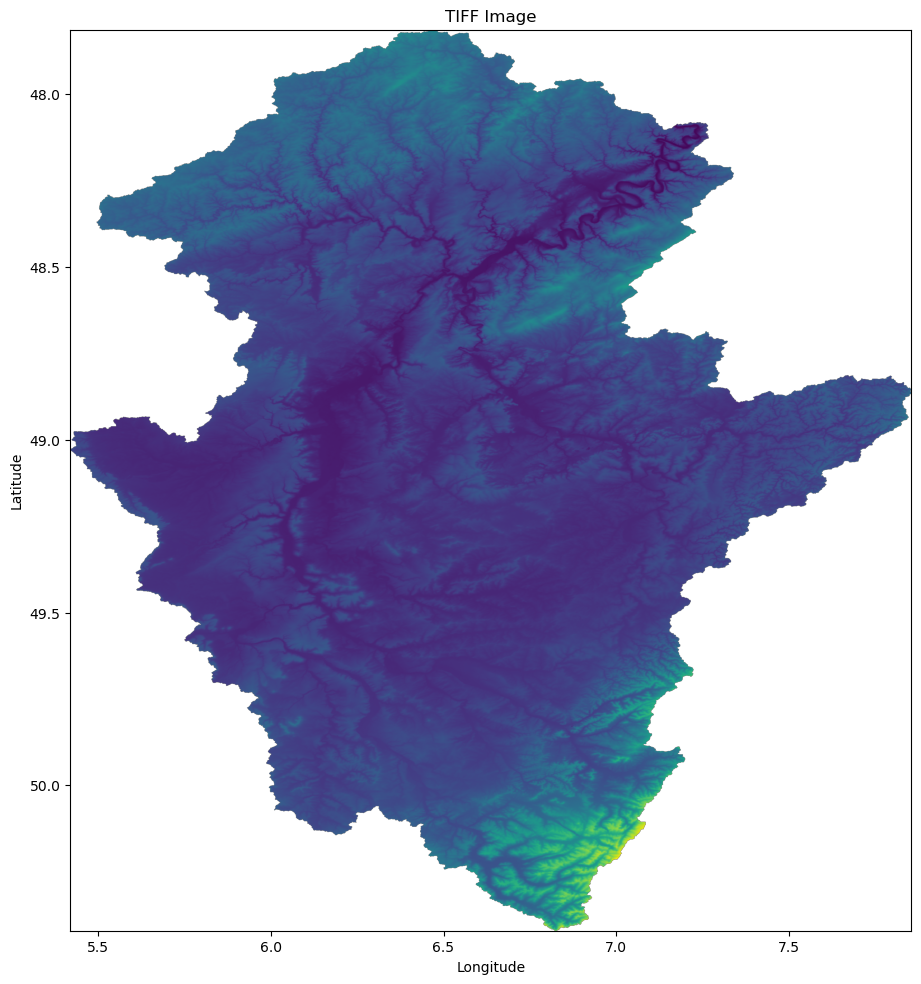

In [6]:
##################################################################################################################
# Terrain (elevation)
# Path to the TIFF file
tiff_path = path_data+"/gis/paper_moselle/raster/elevation/moselle_srtm.tif"

# Open the TIFF file
with rasterio.open(tiff_path) as src:
    # Check the current CRS
    current_crs = src.crs
    print(f'Current CRS: {current_crs}')

    # Define the target CRS (WGS84)
    dst_crs = 'EPSG:4326'  # WGS84

    # If the current CRS is not WGS84, reproject the image
    if current_crs != dst_crs:
        transform, width, height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height
        })

        # Create an in-memory array to hold the reprojected data
        reprojected_image = rasterio.io.MemoryFile().open(**kwargs)

        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(reprojected_image, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest)

        # Read the reprojected image
        elevation_wgs = reprojected_image.read(1)

        print(f'Image reprojected to WGS84 and stored in-memory.')
    else:
        # Read the original image if it is already in WGS84
        elevation_wgs = src.read(1)
        transform = src.transform
        print('Image is already in WGS84 CRS.')

# Calculate the extent
left, bottom, right, top = transform * (0, 0), transform * (elevation_wgs.shape[1], 0), transform * (elevation_wgs.shape[1], elevation_wgs.shape[0]), transform * (0, elevation_wgs.shape[0])
extent = (left[0], right[0], bottom[1], top[1])

# Plot the image with the correct extent
fig, ax = plt.subplots(1, 1, figsize=(16.6, 11.7))
ax.imshow(elevation_wgs, cmap='viridis', extent=extent)
ax.set_title('TIFF Image')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

### Network and attributes

In [7]:
# Read the gauges network metadata (from EStreams):
network_estreams = pd.read_csv(path_estreams+'/streamflow_gauges/estreams_gauging_stations.csv', encoding='utf-8')
network_estreams.set_index("basin_id", inplace = True)

# Attributes already filtered from EStreams previously in do Nascimento et al. (2025a):
estreams_attributes = pd.read_csv('../data/estreams_attributes_filtered_quality_geology_v01.csv', encoding='utf-8')
estreams_attributes.set_index("basin_id", inplace = True)

# Geological attributes (regional scale). Same ones provided in do Nascimento et al. (2025a):
geology_regional_31_classes_moselle = pd.read_csv("../data/estreams_geology_moselle_regional_attributes.csv", encoding='utf-8')
geology_regional_31_classes_moselle.set_index("basin_id", inplace = True)


# Read the dataset network
estreams_attributes_clipped_filters = pd.read_csv(R'../data/network_estreams_moselle_108_gauges.csv', encoding='utf-8')
estreams_attributes_clipped_filters.set_index("basin_id", inplace = True)

# Read the dataset network
estreams_attributes_garonne_clipped_filters = pd.read_csv(R'../data/network_estreams_garonne_22_gauges.csv', encoding='utf-8')
estreams_attributes_garonne_clipped_filters.set_index("basin_id", inplace = True)


# Geological attributes (regional scale) for the Garonne (new):
geology_regional_18_classes_garonne = pd.read_csv("../data/estreams_geology_garonne_regional_attributes.csv", encoding='utf-8')
geology_regional_18_classes_garonne.set_index("basin_id", inplace = True)

In [8]:
# Network file already clipped to the Moselle and Garonne basins:
network_estreams_moselle_108_gauges = pd.read_csv('../data/network_estreams_moselle_108_gauges.csv', encoding='utf-8')
network_estreams_moselle_108_gauges.drop_duplicates("basin_id", inplace = True)
network_estreams_moselle_108_gauges.set_index("basin_id", inplace = True)
network_estreams_garonne_22_gauges = pd.read_csv('../data/network_estreams_garonne_22_gauges.csv', encoding='utf-8')
network_estreams_garonne_22_gauges.drop_duplicates("basin_id", inplace = True)
network_estreams_garonne_22_gauges.set_index("basin_id", inplace = True)

## Preprocessing
### Network organization

In [9]:
# Convert 'date_column' and 'time_column' to datetime
network_estreams['start_date'] = pd.to_datetime(network_estreams['start_date'])
network_estreams['end_date'] = pd.to_datetime(network_estreams['end_date'])

# Convert to list both the nested_catchments and the duplicated_suspect columns
network_estreams['nested_catchments'] = network_estreams['nested_catchments'].apply(lambda x: x.strip("[]").replace("'", "").split(", "))

# Remove the brackets and handle NaN values
network_estreams['duplicated_suspect'] = network_estreams['duplicated_suspect'].apply(
    lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)

# Set the nested catchments as a dataframe
nested_catchments = pd.DataFrame(network_estreams['nested_catchments'])

# Now we add the outlet to the list (IF it was not before):
# Ensure that the basin_id is in the nested_catchments
for basin_id in nested_catchments.index:
    if basin_id not in nested_catchments.at[basin_id, 'nested_catchments']:
        nested_catchments.at[basin_id, 'nested_catchments'].append(basin_id)


# Convert to list both the nested_catchments and the duplicated_suspect columns
estreams_attributes['nested_catchments'] = estreams_attributes['nested_catchments'].apply(lambda x: x.strip("[]").replace("'", "").split(", "))

# Remove the brackets and handle NaN values
estreams_attributes['duplicated_suspect'] = estreams_attributes['duplicated_suspect'].apply(
    lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)

estreams_attributes.sort_index(inplace = True) 

### Geological data organization

In [10]:
# Create a dictionary to map permeability classes to corresponding columns
permeability_columns = {
    "high": ["lit_fra_Alluvium", 'lit_fra_Coal', 'lit_fra_Conglomerate', 'lit_fra_Gravel and sand',
             'lit_fra_Sand', 'lit_fra_Sand and gravel', 'lit_fra_Sandstone and conglomerate', 'lit_fra_Sandstone'
        ],
    
    "medium": ['lit_fra_Limestone', 'lit_fra_Sandstone and marl', 'lit_fra_Sandstone and schist',
              'lit_fra_Sandstone, conglomerate and marl',

              'lit_fra_Arkose', 'lit_fra_Dolomite rock', 'lit_fra_Limestone and marl', 'lit_fra_Marl', 
             'lit_fra_Marl and dolomite', 'lit_fra_Marl and limestone', 'lit_fra_Marl and sandstone',
               'lit_fra_Sandstone and siltstone', 'lit_fra_Sandstone, siltstone and schist', 
              'lit_fra_Schist and sandstone', 'lit_fra_Silt',  'lit_fra_Silt and schist', 'lit_fra_Siltstone, sandstone and schist'
              
             ],
    
    "low": ['lit_fra_Cristallin basement', 'lit_fra_Plutonic rock',  'lit_fra_Quarzite',
                    'lit_fra_Schist','lit_fra_Volcanic rock' 
                   ]
}

# Iterate over the permeability columns and calculate the area for each class
for permeability_class, columns in permeability_columns.items():
    geology_regional_31_classes_moselle[f'area_perm_{permeability_class}'] = geology_regional_31_classes_moselle[columns].sum(axis=1)

# Drop unnecessary columns
geology_regional_31_classes_moselle = geology_regional_31_classes_moselle[["area_perm_high", "area_perm_medium", "area_perm_low"]]

# Rename the columns
geology_regional_31_classes_moselle.columns = ["perm_high_regi", "perm_medium_regi", "perm_low_regi"]

# Display the updated DataFrame
geology_regional_31_classes_moselle

geology_regional_31_classes_moselle["baseflow_index"] = estreams_attributes["baseflow_index"]
geology_regional_31_classes_moselle.corr(method="pearson")

# Concatenation
estreams_attributes[["perm_high_regi", "perm_medium_regi", "perm_low_regi"]] = geology_regional_31_classes_moselle[["perm_high_regi", "perm_medium_regi", "perm_low_regi"]]

# Adjust the three categories for also global dataset
estreams_attributes["perm_high_glob2"] = estreams_attributes["perm_high_glob"]
estreams_attributes["perm_medium_glob2"] = estreams_attributes["perm_medium_glob"] + estreams_attributes["perm_low_glob"]
estreams_attributes["perm_low_glob2"] = estreams_attributes["perm_verylow_glob"]

###########################################################################################################################
# Adjust the columns of the dataset:
for basin_id in estreams_attributes.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes.loc[basin_id, "perm_high_regi"] / 100
    v2 = estreams_attributes.loc[basin_id, "perm_medium_regi"] / 100
    v3 = estreams_attributes.loc[basin_id, "perm_low_regi"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes.loc[basin_id, "perm_high_regi"] = v1 * 100
    estreams_attributes.loc[basin_id, "perm_medium_regi"] = v2 * 100
    estreams_attributes.loc[basin_id, "perm_low_regi"] = v3 * 100


for basin_id in estreams_attributes.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes.loc[basin_id, "perm_high_glob2"] / 100
    v2 = estreams_attributes.loc[basin_id, "perm_medium_glob2"] / 100
    v3 = estreams_attributes.loc[basin_id, "perm_low_glob2"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes.loc[basin_id, "perm_high_glob2"] = v1 * 100
    estreams_attributes.loc[basin_id, "perm_medium_glob2"] = v2 * 100
    estreams_attributes.loc[basin_id, "perm_low_glob2"] = v3 * 100

In [11]:
# Garonne
# Create a dictionary to map permeability classes to corresponding columns
permeability_columns = {
    "high": [ "lit_fra_Alluvium",
             'lit_fra_Sand, gravel and pebbles'    
        ],
    
    "medium": ['lit_fra_Carbonate rocks', 
               'lit_fra_Limestones', 
               'lit_fra_Limestones, sandstones and gravels', 
               'lit_fra_Limestones, sandstones and marls', 
               'lit_fra_Molasses and clays',  
               'lit_fra_Sands and clays',
                'lit_fra_Sedimentary rocks',
               'lit_fra_Sediments mesosoics',
            'lit_fra_Schists, gneisses, granites', 
             ],
    
    "low": ['lit_fra_Impermeable', 
            'lit_fra_Inland water', 
            'lit_fra_Magmatic rocks', 
            'lit_fra_Massif', 
            'lit_fra_Plutonic rocks',
            'lit_fra_Shales',
            'lit_fra_Granitoids',
                   ]
}

# Iterate over the permeability columns and calculate the area for each class
for permeability_class, columns in permeability_columns.items():
    geology_regional_18_classes_garonne[f'area_perm_{permeability_class}'] = geology_regional_18_classes_garonne[columns].sum(axis=1)



# Drop unnecessary columns
geology_regional_18_classes_garonne = geology_regional_18_classes_garonne[["area_perm_high", "area_perm_medium", "area_perm_low"]]

# Rename the columns
geology_regional_18_classes_garonne.columns = ["perm_high_regi", "perm_medium_regi", "perm_low_regi"]

### Attributes organization

In [12]:
# First we define the outlet of the Moselle to be used
outlets = ["DEBU1959"]
nested_cats_df = nested_catchments.loc[outlets, :]

# Now we save our dataframes in a dictionary of dataframes. One dataframe for each watershed. 

nested_cats_filtered = find_max_unique_rows(nested_cats_df)                                  # Filter only the catchemnts using the function stated before
nested_cats_filtered_df = nested_catchments.loc[nested_cats_filtered, :]                     # Here we filter the catchemnts for the list (again, after we apply our function):

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}
for catchment in tqdm.tqdm(nested_cats_filtered):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

# Here we can save the length of each watershed (number of nested catchemnts)
catchment_lens = pd.DataFrame(index = estreams_attributes_dfs.keys())
for catchment, data in estreams_attributes_dfs.items():
    catchment_lens.loc[catchment, "len"] = len(data)

# Now we can filter it properly:
nested_cats_filtered_abovevalue = catchment_lens[catchment_lens.len >= 10]

# # Here we filter the catchemnts for the list (again, after we apply our function):
nested_cats_filtered_abovevalue_df = nested_catchments.loc[nested_cats_filtered_abovevalue.index, :]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}

for catchment in tqdm.tqdm(nested_cats_filtered_abovevalue_df.index):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_abovevalue_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

# Adjust and clip it:
estreams_attributes_clipped = estreams_attributes_dfs["DEBU1959"]

# Convert 'date_column' and 'time_column' to datetime
estreams_attributes_clipped['start_date'] = pd.to_datetime(estreams_attributes_clipped['start_date'])
estreams_attributes_clipped['end_date'] = pd.to_datetime(estreams_attributes_clipped['end_date'])

100%|██████████| 1/1 [00:00<00:00, 657.93it/s]


In [13]:
estreams_attributes_clipped["perm_high_cont2"] = estreams_attributes_clipped["perm_high_cont"]
estreams_attributes_clipped["perm_medium_cont2"] = estreams_attributes_clipped["perm_medium_cont"] + estreams_attributes_clipped["perm_low_cont"]
estreams_attributes_clipped["perm_low_cont2"] = estreams_attributes_clipped["perm_verylow_cont"]

In [14]:
# Garonne
# Concatenation
estreams_attributes_garonne = estreams_attributes.copy()

estreams_attributes_garonne[["perm_high_regi", "perm_medium_regi", "perm_low_regi"]] = geology_regional_18_classes_garonne[["perm_high_regi", "perm_medium_regi", "perm_low_regi"]]
estreams_attributes_garonne["perm_high_glob2"] = estreams_attributes_garonne["perm_high_glob"]
estreams_attributes_garonne["perm_medium_glob2"] = estreams_attributes_garonne["perm_medium_glob"] + estreams_attributes_garonne["perm_low_glob"]
estreams_attributes_garonne["perm_low_glob2"] = estreams_attributes_garonne["perm_verylow_glob"]

estreams_attributes_garonne["perm_high_cont2"] = estreams_attributes_garonne["perm_high_cont"]
estreams_attributes_garonne["perm_medium_cont2"] = estreams_attributes_garonne["perm_medium_cont"] + estreams_attributes_garonne["perm_low_cont"]
estreams_attributes_garonne["perm_low_cont2"] = estreams_attributes_garonne["perm_verylow_cont"]

for basin_id in estreams_attributes_garonne.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes_garonne.loc[basin_id, "perm_high_regi"] / 100
    v2 = estreams_attributes_garonne.loc[basin_id, "perm_medium_regi"] / 100
    v3 = estreams_attributes_garonne.loc[basin_id, "perm_low_regi"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes_garonne.loc[basin_id, "perm_high_regi"] = v1 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_medium_regi"] = v2 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_low_regi"] = v3 * 100


for basin_id in estreams_attributes_garonne.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes_garonne.loc[basin_id, "perm_high_glob2"] / 100
    v2 = estreams_attributes_garonne.loc[basin_id, "perm_medium_glob2"] / 100
    v3 = estreams_attributes_garonne.loc[basin_id, "perm_low_glob2"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes_garonne.loc[basin_id, "perm_high_glob2"] = v1 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_medium_glob2"] = v2 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_low_glob2"] = v3 * 100

for basin_id in estreams_attributes_garonne.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes_garonne.loc[basin_id, "perm_high_cont2"] / 100
    v2 = estreams_attributes_garonne.loc[basin_id, "perm_medium_cont2"] / 100
    v3 = estreams_attributes_garonne.loc[basin_id, "perm_low_cont2"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes_garonne.loc[basin_id, "perm_high_cont2"] = v1 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_medium_cont2"] = v2 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_low_cont2"] = v3 * 100


## Merging simulations
Here we simply do the merging of the simualtions into single netcdfs to facilitate the work.

In [15]:
# Moselle
# Base path to your NetCDF files
base_path = Path(r"../results/sim/sim_moselle/space-time/notconcatenated")
base_path_output= Path(r"../results/sim/sim_moselle/space-time")
# List of group suffixes
group_suffixes = [f"Group_{i}" for i in range(1, 8)]

# Loop through each group
for group in group_suffixes:
    # Load datasets
    ds_compl = xr.load_dataset(base_path / f"simu_compl_{group}.nc")
    ds_nogeo = xr.load_dataset(base_path / f"simu_nogeo_{group}.nc")
    ds_random = xr.load_dataset(base_path / f"simu_random_{group}.nc")

    # Merge and save
    ds_merged = xr.merge([ds_compl, ds_nogeo, ds_random])
    output_path = base_path_output / f"simu_{group}.nc"
    ds_merged.to_netcdf(output_path, engine="netcdf4")


# Garonne
# Base path to your NetCDF files
base_path = Path(r"../results/sim/sim_garonne/space-time/notconcatenated")
base_path_output= Path(r"../results/sim/sim_garonne/space-time")
# List of group suffixes
group_suffixes = [f"Group_{i}" for i in range(1, 3)]

# Loop through each group
for group in group_suffixes:
    # Load datasets
    ds_compl = xr.load_dataset(base_path / f"simu_compl_{group}.nc")
    ds_nogeo = xr.load_dataset(base_path / f"simu_nogeo_{group}.nc")
    ds_random = xr.load_dataset(base_path / f"simu_random_{group}.nc")

    # Merge and save
    ds_merged = xr.merge([ds_compl, ds_nogeo, ds_random])
    output_path = base_path_output / f"simu_{group}.nc"
    ds_merged.to_netcdf(output_path, engine="netcdf4")

In [16]:
# Moselle
# Base path to your NetCDF files
base_path = Path(r"../results/sim/sim_moselle/space/notconcatenated")
base_path_output= Path(r"../results/sim/sim_moselle/space")
# List of group suffixes
group_suffixes = [f"Group_{i}" for i in range(1, 8)]

# Loop through each group
for group in group_suffixes:
    # Load datasets
    ds_compl = xr.load_dataset(base_path / f"simu_compl_{group}.nc")
    ds_nogeo = xr.load_dataset(base_path / f"simu_nogeo_{group}.nc")
    ds_random = xr.load_dataset(base_path / f"simu_random_{group}.nc")

    # Merge and save
    ds_merged = xr.merge([ds_compl, ds_nogeo, ds_random])
    output_path = base_path_output / f"simu_{group}.nc"
    ds_merged.to_netcdf(output_path, engine="netcdf4")

# Garonne
# Base path to your NetCDF files
base_path = Path(r"../results/sim/sim_garonne/space/notconcatenated")
base_path_output= Path(r"../results/sim/sim_garonne/space")
# List of group suffixes
group_suffixes = [f"Group_{i}" for i in range(1, 3)]

# Loop through each group
for group in group_suffixes:
    # Load datasets
    ds_compl = xr.load_dataset(base_path / f"simu_compl_{group}.nc")
    ds_nogeo = xr.load_dataset(base_path / f"simu_nogeo_{group}.nc")
    ds_random = xr.load_dataset(base_path / f"simu_random_{group}.nc")

    # Merge and save
    ds_merged = xr.merge([ds_compl, ds_nogeo, ds_random])
    output_path = base_path_output / f"simu_{group}.nc"
    ds_merged.to_netcdf(output_path, engine="netcdf4")
    

## Load the simulations

### Functions

In [17]:
# Function to load the simulations and merge with the observations
def load_group_with_inputs(group: str, base_path: Path) -> xr.Dataset:
    """
    Load simulation + inputs for a given group into a single merged xarray.Dataset.
    
    Assumes both files contain the same gauge_id and date dimensions.

    Parameters:
    - group (str): Group name like "Group_3"
    - base_path (Path): Directory where both simu_Group_X.nc and inputs_Group_X.nc live

    Returns:
    - xarray.Dataset with all variables merged
    """
    # Load the group simulation file
    ds_sim = xr.load_dataset(base_path / f"simu_{group}.nc")
    
    # Load and clip the group input file
    ds_inputs = xr.load_dataset(base_path / f"inputs.nc")
    ds_inputs = ds_inputs.sel(gauge_id=ds_sim.gauge_id)

    # Merge datasets (assumes same gauge_id and date alignment)
    ds_merged = xr.merge([ds_sim, ds_inputs])

    return ds_merged


# Function to load the simulations and merge with the observations
def load_group_with_inputs_cal(group: str, base_path: Path) -> xr.Dataset:
    """
    Load simulation + inputs for a given group into a single merged xarray.Dataset.
    
    Assumes both files contain the same gauge_id and date dimensions.

    Parameters:
    - group (str): Group name like "Group_3"
    - base_path (Path): Directory where both simu_Group_X.nc and inputs_Group_X.nc live

    Returns:
    - xarray.Dataset with all variables merged
    """
    # Load the group simulation file
    ds_sim = xr.load_dataset(base_path / f"simu_cal_{group}.nc")
    
    # Load and clip the group input file
    ds_inputs = xr.load_dataset(base_path / f"inputs.nc")
    ds_inputs = ds_inputs.sel(gauge_id=ds_sim.gauge_id)
    
    # Merge datasets (assumes same gauge_id and date alignment)
    ds_merged = xr.merge([ds_sim, ds_inputs])

    return ds_merged


In [18]:
# Define the NSE adjusted function
def compute_nse(observations, simulation, expo=0.5):
    """
    Calculate the Normalized Squared Error Efficiency (NSEE) while ensuring that
    NaNs in simulation are NOT masked (only NaNs in observations are masked).

    Parameters:
        observations (array-like): Observed values (with fixed NaNs).
        simulation (array-like): Simulated values (can contain NaNs).
        expo (float, optional): Exponent applied to observations and simulations. Default is 1.0.

    Returns:
        float: NSEE score (higher values indicate worse performance).
    """
    observations = np.asarray(observations)
    simulation = np.asarray(simulation)

    # Mask only NaNs in observations
    mask = ~np.isnan(observations)
    obs = observations[mask]
    sim = simulation[mask]  # Keep all simulated values, even NaNs

    # If simulation contains NaNs after masking observations, return penalty
    #if np.isnan(sim).any():
    #    return 10.0  # Large penalty if NaNs appear in the simulation

    metric = 1 - np.sum((sim**expo - obs**expo)**2) / np.sum((obs**expo - np.mean(obs**expo))**2)
    
    return float(metric)


def compute_nse(observations, simulation, expo=0.5):
    """
    Calculate the Normalized Squared Error Efficiency (NSEE) while ensuring that
    NaNs in simulation are NOT masked (only NaNs in observations are masked).

    Parameters:
        observations (array-like): Observed values (with fixed NaNs).
        simulation (array-like): Simulated values (can contain NaNs).
        expo (float, optional): Exponent applied to observations and simulations. Default is 1.0.

    Returns:
        float: NSEE score (higher values indicate worse performance).
    """
    observations = np.asarray(observations)
    simulation = np.asarray(simulation)

    # Mask only NaNs in observations
    mask = ~np.isnan(observations)
    obs = observations[mask]
    sim = simulation[mask]  # Keep all simulated values, even NaNs

    mask_sim = ~np.isnan(sim)

    obs = obs[mask_sim]
    sim = sim[mask_sim]

    # If simulation contains NaNs after masking observations, return penalty
    if np.isnan(sim).any():
        return 10.0  # Large penalty if NaNs appear in the simulation

    metric = 1 - np.sum((sim**expo - obs**expo)**2) / np.sum((obs**expo - np.mean(obs**expo))**2)
    
    return float(metric)

### Space-time evaluation

In [ ]:
# Moselle
# Base directory and group names
base_dir = Path("../results/sim/sim_moselle/space-time")
group_names = [f"Group_{i}" for i in range(1, 8)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

# Define the time range
start_date = "2001-10-01"
end_date = "2015-09-30"
#selected_gauge_ids = estreams_attributes_clipped_filters.index.unique().tolist()
selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeology"].values),
        'nse_g1comp': compute_nse(obs, ts["global"].values),
        'nse_c1comp': compute_nse(obs, ts["continental"].values),
        'nse_r1comp': compute_nse(obs, ts["regional"].values),
        'nse_rand': compute_nse(obs, ts["random"].values),

    }


# Convert to DataFrame
data_diff_val_complete_dict_plot = pd.DataFrame.from_dict(nse_results, orient='index')


# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeology', "random"]

MIN_VALID_POINTS = 365  # You can adjust this threshold if needed

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)

signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}

# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
        }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_val_complete = data_diff_val_complete_dict_plot.join(signature_df, how='left')

100%|██████████| 108/108 [00:08<00:00, 13.29it/s]


In [ ]:
# Garonne
# Base directory and group names
base_dir = Path("../results/sim/sim_garonne/space-time")
group_names = [f"Group_{i}" for i in range(1, 3)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

# Define the time range
start_date = "2001-10-01"
end_date = "2015-09-30"

#selected_gauge_ids = estreams_attributes_clipped_filters.index.unique().tolist()
selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeology"].values),
        'nse_g1comp': compute_nse(obs, ts["global"].values),
        'nse_c1comp': compute_nse(obs, ts["continental"].values),
        'nse_r1comp': compute_nse(obs, ts["regional"].values),
        'nse_rand': compute_nse(obs, ts["random"].values),

    }


# Convert to DataFrame
data_diff_val_complete_dict_plot_garonne = pd.DataFrame.from_dict(nse_results, orient='index')


# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeology', "random"]

MIN_VALID_POINTS = 365  # You can adjust this threshold if needed

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)

signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}

# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
        }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_val_complete_garonne = data_diff_val_complete_dict_plot_garonne.join(signature_df, how='left')

100%|██████████| 22/22 [00:01<00:00, 15.55it/s]


### Calibration

In [23]:
# Moselle
# Base directory and group names
base_dir = Path("../results/sim/sim_moselle/calibration")
group_names = [f"Group_{i}" for i in range(1, 8)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs_cal(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

start_date = "1991-10-01"
end_date = "2001-09-30"

selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeo"].values, expo=0.5),
        'nse_g1comp': compute_nse(obs, ts["global"].values, expo=0.5),
        'nse_c1comp': compute_nse(obs, ts["continental"].values, expo=0.5),
        'nse_r1comp': compute_nse(obs, ts["regional"].values, expo=0.5),
        'nse_rand': compute_nse(obs, ts["random"].values, expo=0.5),

    }


# Convert to DataFrame
data_diff_calibration_complete_dict_plot = pd.DataFrame.from_dict(nse_results, orient='index')

# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeo', "random"]

MIN_VALID_POINTS = 365  # You can adjust this threshold if needed

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)

signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}


# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
            }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_calibration_complete = data_diff_calibration_complete_dict_plot.join(signature_df, how='left')

100%|██████████| 92/92 [00:04<00:00, 20.67it/s]


In [25]:
# Garonne
# Base directory and group names
base_dir = Path("../results/sim/sim_garonne/calibration")
group_names = [f"Group_{i}" for i in range(1, 3)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs_cal(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

start_date = "1991-10-01"
end_date = "2001-09-30"

selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeo"].values, expo=0.5),
        'nse_g1comp': compute_nse(obs, ts["global"].values, expo=0.5),
        'nse_c1comp': compute_nse(obs, ts["continental"].values, expo=0.5),
        'nse_r1comp': compute_nse(obs, ts["regional"].values, expo=0.5),
        'nse_rand': compute_nse(obs, ts["random"].values, expo=0.5),

    }


# Convert to DataFrame
data_diff_calibration_complete_dict_plot_garonne = pd.DataFrame.from_dict(nse_results, orient='index')

# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeo', "random"]

MIN_VALID_POINTS = 365  # You can adjust this threshold if needed

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)

signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}


# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
            }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_calibration_complete_garonne = data_diff_calibration_complete_dict_plot_garonne.join(signature_df, how='left')

100%|██████████| 22/22 [00:01<00:00, 20.40it/s]


In [ ]:
# Small sanity check on the NSEs across calibration groups (Moselle)
estreams_attributes_clipped_filters_teste = estreams_attributes_clipped_filters.copy()
estreams_attributes_clipped_filters_teste["nse_nogeo"] = data_diff_calibration_complete["nse_nogeo"]
estreams_attributes_clipped_filters_teste["nse_rand"] = data_diff_calibration_complete["nse_rand"]
estreams_attributes_clipped_filters_teste["nse_g1comp"] = data_diff_calibration_complete["nse_g1comp"]
estreams_attributes_clipped_filters_teste["nse_c1comp"] = data_diff_calibration_complete["nse_c1comp"]
estreams_attributes_clipped_filters_teste["nse_r1comp"] = data_diff_calibration_complete["nse_r1comp"]
group_stats = estreams_attributes_clipped_filters_teste.groupby("group")[["nse_nogeo", "nse_rand", "nse_g1comp", "nse_c1comp", "nse_r1comp"]].describe()
group_stats.columns = [f"{col[0]}_{col[1]}" for col in group_stats.columns]
group_stats[["nse_nogeo_mean", "nse_rand_mean", "nse_g1comp_mean", "nse_c1comp_mean", "nse_r1comp_mean"]]

,nse_nogeo_mean,nse_rand_mean,nse_g1comp_mean,nse_c1comp_mean,nse_r1comp_mean
group,,,,,
Group_1,0.676841,0.699446,0.719677,0.702393,0.730614
Group_2,0.781757,0.794273,0.811441,0.815274,0.823105
Group_3,0.813252,0.821604,0.815864,0.830135,0.843886
Group_4,0.757397,0.757421,0.781412,0.783933,0.797229
Group_5,0.717760,0.758224,0.770755,0.799695,0.799713
Group_6,0.764952,0.785734,0.790832,0.795254,0.809113
Group_7,0.717105,0.731186,0.767245,0.760221,0.764030


In [ ]:
# Small sanity check on the NSEs across calibration groups (Garonne)
estreams_attributes_clipped_filters_teste = estreams_attributes_garonne_clipped_filters.copy()
estreams_attributes_clipped_filters_teste["nse_nogeo"] = data_diff_calibration_complete_garonne["nse_nogeo"]
estreams_attributes_clipped_filters_teste["nse_rand"] = data_diff_calibration_complete_garonne["nse_rand"]
estreams_attributes_clipped_filters_teste["nse_g1comp"] = data_diff_calibration_complete_garonne["nse_g1comp"]
estreams_attributes_clipped_filters_teste["nse_c1comp"] = data_diff_calibration_complete_garonne["nse_c1comp"]
estreams_attributes_clipped_filters_teste["nse_r1comp"] = data_diff_calibration_complete_garonne["nse_r1comp"]
group_stats = estreams_attributes_clipped_filters_teste.groupby("group")[["nse_nogeo", "nse_rand", "nse_g1comp", "nse_c1comp", "nse_r1comp"]].describe()
group_stats.columns = [f"{col[0]}_{col[1]}" for col in group_stats.columns]
group_stats[["nse_nogeo_mean", "nse_rand_mean", "nse_g1comp_mean", "nse_c1comp_mean", "nse_r1comp_mean"]]

,nse_nogeo_mean,nse_rand_mean,nse_g1comp_mean,nse_c1comp_mean,nse_r1comp_mean
group,,,,,
Group_1,0.692303,0.700561,0.720842,0.735793,0.730867
Group_2,0.717981,0.726496,0.727838,0.736339,0.740273


### Space evaluation

In [30]:
# Moselle
# Base directory and group names
base_dir = Path("../results/sim/sim_moselle/space")
group_names = [f"Group_{i}" for i in range(1, 8)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

start_date = "1991-10-01"
end_date = "2001-09-30"

#selected_gauge_ids = estreams_attributes_clipped_filters.index.unique().tolist()
selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeology"].values),
        'nse_g1comp': compute_nse(obs, ts["global"].values),
        'nse_c1comp': compute_nse(obs, ts["continental"].values),
        'nse_r1comp': compute_nse(obs, ts["regional"].values),
        'nse_rand': compute_nse(obs, ts["random"].values),
    }


# Convert to DataFrame
data_diff_cal_complete_dict_plot = pd.DataFrame.from_dict(nse_results, orient='index')


# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeology', "random"]

MIN_VALID_POINTS = 365

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)


signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}


# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
            }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_cal_complete = data_diff_cal_complete_dict_plot.join(signature_df, how='left')

/opt/miniconda3/envs/superf/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/miniconda3/envs/superf/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/4024488637.py:62: RuntimeWarning: invalid value encountered in scalar divide
  metric = 1 - np.sum((sim**expo - obs**expo)**2) / np.sum((obs**expo - np.mean(obs**expo))**2)
100%|██████████| 108/108 [00:04<00:00, 22.10it/s]


In [31]:
# Garonne
# Base directory and group names
base_dir = Path("../results/sim/sim_garonne/space")
group_names = [f"Group_{i}" for i in range(1, 3)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

# Define the time range
start_date = "1991-10-01"
end_date = "2001-09-30"

#selected_gauge_ids = estreams_attributes_clipped_filters.index.unique().tolist()
selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeology"].values),
        'nse_g1comp': compute_nse(obs, ts["global"].values),
        'nse_c1comp': compute_nse(obs, ts["continental"].values),
        'nse_r1comp': compute_nse(obs, ts["regional"].values),
        'nse_rand': compute_nse(obs, ts["random"].values),
    }


# Convert to DataFrame
data_diff_cal_complete_dict_plot_garonne = pd.DataFrame.from_dict(nse_results, orient='index')


# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeology', "random"]

MIN_VALID_POINTS = 365

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    #if sim.count() < MIN_VALID_POINTS:
    #    return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)


signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}


# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
            }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_cal_complete_garonne = data_diff_cal_complete_dict_plot_garonne.join(signature_df, how='left')

100%|██████████| 22/22 [00:01<00:00, 20.03it/s]


### Comparison to Fenicia

In [32]:
catchments_ids_fenicia = ['FR000184',
 'DERP2017',
 'DERP2011',
 'DERP2013',
 'DERP2007',
 'DERP2024',
 'FR003253',
 'FR003283',
 'FR003301',
 'DERP2003',
 'FR003265',
 'FR003272',
 'DEBU1958',
 'FR000144',
 'DERP2033',
 'FR003275',
 'DERP2004',
 'FR003271',
 'LU000007',
 'FR003237',
 'FR000171',
 'FR000159',
 'FR003249',
 'DEBU1957',
 'DEBU1956',
 'DEBU1959']

data_diff_val_complete.loc[catchments_ids_fenicia].describe()

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_c1comp,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand
count,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,...,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000
mean,0.695245,0.762892,0.769383,0.782100,0.695081,0.597387,0.637778,0.645802,0.647760,0.663345,...,2.362814,2.270826,2.077913,2.259514,1.048105,0.886562,0.890577,0.884674,0.884399,0.890123
std,0.343108,0.214954,0.218585,0.183087,0.369473,0.082951,0.076923,0.062235,0.067497,0.013822,...,0.859725,0.809672,0.724853,0.688414,0.381997,0.357668,0.358336,0.350679,0.356510,0.356420
min,-0.590685,-0.219412,-0.261562,-0.052581,-0.641714,0.417313,0.542318,0.575247,0.554594,0.618918,...,0.960179,1.352111,1.678703,1.857466,0.624614,0.474445,0.475634,0.479522,0.473380,0.477652
25%,0.743958,0.764485,0.763945,0.775870,0.749760,0.542759,0.583713,0.612182,0.600843,0.658164,...,2.088881,1.923854,1.838493,1.995750,0.779051,0.675270,0.682892,0.678092,0.675608,0.682392
50%,0.793771,0.807880,0.819009,0.827361,0.805720,0.603966,0.623959,0.638338,0.637718,0.662986,...,2.223367,2.221161,1.916921,2.090050,0.958107,0.784826,0.791215,0.785757,0.784659,0.787511
75%,0.853168,0.863165,0.862462,0.862225,0.851559,0.622438,0.643732,0.652276,0.686609,0.671280,...,2.579501,2.497008,1.987059,2.171657,1.257108,1.038579,1.036313,1.023764,1.030109,1.037693
max,0.869158,0.893714,0.898628,0.906393,0.891407,0.815731,0.832244,0.824743,0.787203,0.694453,...,5.778109,5.602927,5.531658,5.471893,2.433244,2.268380,2.271529,2.244442,2.260305,2.268256


In [33]:
data_diff_val_complete_ff = data_diff_val_complete.loc[catchments_ids_fenicia]
data_diff_val_complete_ff.describe()

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_c1comp,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand
count,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,...,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000
mean,0.695245,0.762892,0.769383,0.782100,0.695081,0.597387,0.637778,0.645802,0.647760,0.663345,...,2.362814,2.270826,2.077913,2.259514,1.048105,0.886562,0.890577,0.884674,0.884399,0.890123
std,0.343108,0.214954,0.218585,0.183087,0.369473,0.082951,0.076923,0.062235,0.067497,0.013822,...,0.859725,0.809672,0.724853,0.688414,0.381997,0.357668,0.358336,0.350679,0.356510,0.356420
min,-0.590685,-0.219412,-0.261562,-0.052581,-0.641714,0.417313,0.542318,0.575247,0.554594,0.618918,...,0.960179,1.352111,1.678703,1.857466,0.624614,0.474445,0.475634,0.479522,0.473380,0.477652
25%,0.743958,0.764485,0.763945,0.775870,0.749760,0.542759,0.583713,0.612182,0.600843,0.658164,...,2.088881,1.923854,1.838493,1.995750,0.779051,0.675270,0.682892,0.678092,0.675608,0.682392
50%,0.793771,0.807880,0.819009,0.827361,0.805720,0.603966,0.623959,0.638338,0.637718,0.662986,...,2.223367,2.221161,1.916921,2.090050,0.958107,0.784826,0.791215,0.785757,0.784659,0.787511
75%,0.853168,0.863165,0.862462,0.862225,0.851559,0.622438,0.643732,0.652276,0.686609,0.671280,...,2.579501,2.497008,1.987059,2.171657,1.257108,1.038579,1.036313,1.023764,1.030109,1.037693
max,0.869158,0.893714,0.898628,0.906393,0.891407,0.815731,0.832244,0.824743,0.787203,0.694453,...,5.778109,5.602927,5.531658,5.471893,2.433244,2.268380,2.271529,2.244442,2.260305,2.268256


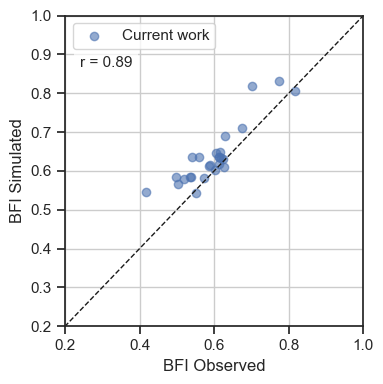

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

df = data_diff_val_complete_ff


x1 = df["bfi_obs"]
y1 = df["bfi_r1comp"]

# Pearson correlations
r1, p1 = pearsonr(x1, y1)

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

plt.figure(figsize=(4, 4))

plt.scatter(x1, y1, alpha=0.6)

# 1:1 line
lims = [0, 1]
plt.plot(lims, lims, "k--", linewidth=1)

plt.xlabel("BFI Observed")
plt.ylabel("BFI Simulated")
plt.xlim(0.2, 1)
plt.ylim(0.2, 1)
plt.grid(True)

# ------------------------------------------------------------
# Add Pearson r annotations
# ------------------------------------------------------------


plt.text(
    0.05, 0.87,
    rf"r = {r1:.2f}",
    transform=plt.gca().transAxes,
    ha="left", va="top",
    fontsize=11,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.7)
)

plt.legend(["Current work"])
plt.tight_layout()
plt.savefig("../results/figs/figures/SX_comparisonFF.png", dpi=300)
plt.show()


## Merge & Save the results

In [ ]:
# Merge the results
data_diff_cal_complete_all = pd.concat(
    [data_diff_cal_complete, data_diff_cal_complete_garonne],
    axis=0
)
data_diff_cal_complete_all.to_csv("../results/Table18_PB.csv")

data_diff_val_complete_all = pd.concat(
    [data_diff_val_complete, data_diff_val_complete_garonne],
    axis=0
)
data_diff_val_complete_all.to_csv("../results/TableS16_PB.csv")

data_diff_calibration_complete_all = pd.concat(
    [data_diff_calibration_complete, data_diff_calibration_complete_garonne],
    axis=0
)

data_diff_calibration_complete_all.to_csv("../results/TableCal_PB.csv")

### Sanity checks (plot differences no geo and random)

<Axes: >

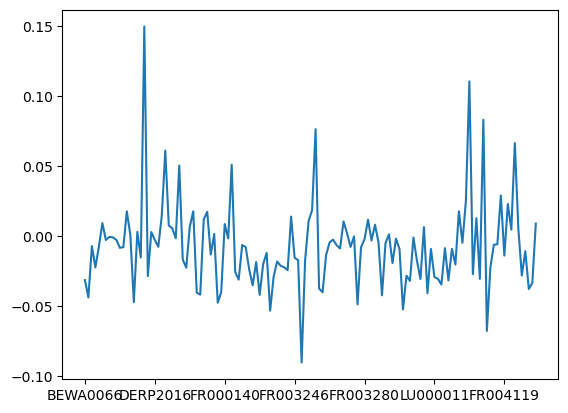

In [35]:
(data_diff_val_complete_all["nse_nogeo"] - data_diff_val_complete_all["nse_rand"]).plot()

<Axes: >

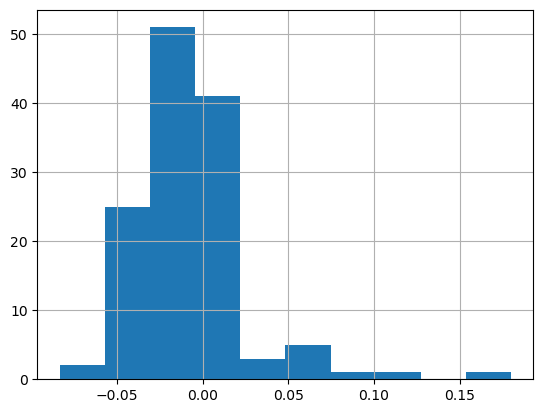

In [39]:
(data_diff_val_complete_all["nse_nogeo"] - data_diff_val_complete_all["nse_rand"]).hist()

## Signficance tests

In [37]:
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests

df = data_diff_val_complete_all.copy()

# Pairwise one-sided Wilcoxon signed-rank tests for NSE
comparisons = [
    ("nse_r1comp", "nse_c1comp"),
    ("nse_r1comp", "nse_g1comp"),
    ("nse_r1comp", "nse_nogeo"),
    ("nse_r1comp", "nse_rand"),
    ("nse_c1comp", "nse_g1comp"),
    ("nse_c1comp", "nse_nogeo"),
    ("nse_c1comp", "nse_rand"),
    ("nse_g1comp", "nse_nogeo"),
    ("nse_g1comp", "nse_rand"),
]

results = []

for col1, col2 in comparisons:
    pair = df[[col1, col2]].dropna()

    # Wilcoxon signed-rank test on paired NSE values
    stat, p = wilcoxon(
        pair[col1],
        pair[col2],
        alternative="greater",   # tests whether col1 > col2
        zero_method="wilcox"
    )

    median_diff = (pair[col1] - pair[col2]).median()

    results.append({
        "comparison": f"{col1} > {col2}",
        "n_catchments": len(pair),
        "median_diff": median_diff,
        "statistic": stat,
        "p_value": p
    })

results_df = pd.DataFrame(results)

# Multiple-testing correction (Holm)
reject, p_holm, _, _ = multipletests(results_df["p_value"], method="holm")
results_df["p_value_holm"] = p_holm
results_df["significant_holm"] = reject

results_df.sort_values("p_value")

,comparison,n_catchments,median_diff,statistic,p_value,p_value_holm,significant_holm
2,nse_r1comp > nse_nogeo,130,0.032833,7197.0,4.231417e-12,3.808276e-11,True
5,nse_c1comp > nse_nogeo,130,0.029635,6876.0,5.839846e-10,4.671876e-09,True
3,nse_r1comp > nse_rand,130,0.020711,6874.0,6.011645e-10,4.671876e-09,True
6,nse_c1comp > nse_rand,130,0.011348,6207.0,2.948736e-06,1.769241e-05,True
7,nse_g1comp > nse_nogeo,130,0.019283,5809.0,1.559540e-04,7.797701e-04,True
0,nse_r1comp > nse_c1comp,130,0.004394,5738.0,2.906187e-04,1.162475e-03,True
1,nse_r1comp > nse_g1comp,130,0.004330,5657.0,5.729739e-04,1.718922e-03,True
8,nse_g1comp > nse_rand,130,0.010447,5168.0,1.718436e-02,3.436871e-02,True
4,nse_c1comp > nse_g1comp,130,-0.001274,4320.0,4.422644e-01,4.422644e-01,False


In [38]:
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests

df = data_diff_val_complete_all.copy()

# Pairwise one-sided Wilcoxon signed-rank tests for NSE
comparisons = [
    ("nse_r1comp", "nse_c1comp"),
    ("nse_r1comp", "nse_g1comp"),
    ("nse_r1comp", "nse_nogeo"),
    ("nse_r1comp", "nse_rand"),
    ("nse_c1comp", "nse_g1comp"),
    ("nse_c1comp", "nse_nogeo"),
    ("nse_c1comp", "nse_rand"),
    ("nse_g1comp", "nse_nogeo"),
    ("nse_g1comp", "nse_rand"),
    ("nse_rand", "nse_nogeo"),

]

results = []

for col1, col2 in comparisons:
    pair = df[[col1, col2]].dropna()

    # Wilcoxon signed-rank test on paired NSE values
    stat, p = wilcoxon(
        pair[col1],
        pair[col2],
        alternative="greater",   # tests whether col1 > col2
        zero_method="wilcox"
    )

    median_diff = (pair[col1] - pair[col2]).median()

    results.append({
        "comparison": f"{col1} > {col2}",
        "n_catchments": len(pair),
        "median_diff": median_diff,
        "statistic": stat,
        "p_value": p
    })

results_df = pd.DataFrame(results)

# Multiple-testing correction (Holm)
reject, p_holm, _, _ = multipletests(results_df["p_value"], method="holm")
results_df["p_value_holm"] = p_holm
results_df["significant_holm"] = reject

results_df.sort_values("p_value")

,comparison,n_catchments,median_diff,statistic,p_value,p_value_holm,significant_holm
2,nse_r1comp > nse_nogeo,130,0.032833,7197.0,4.231417e-12,4.231417e-11,True
5,nse_c1comp > nse_nogeo,130,0.029635,6876.0,5.839846e-10,5.255861e-09,True
3,nse_r1comp > nse_rand,130,0.020711,6874.0,6.011645e-10,5.255861e-09,True
6,nse_c1comp > nse_rand,130,0.011348,6207.0,2.948736e-06,2.064115e-05,True
9,nse_rand > nse_nogeo,130,0.007839,6089.0,1.041343e-05,6.248057e-05,True
7,nse_g1comp > nse_nogeo,130,0.019283,5809.0,1.559540e-04,7.797701e-04,True
0,nse_r1comp > nse_c1comp,130,0.004394,5738.0,2.906187e-04,1.162475e-03,True
1,nse_r1comp > nse_g1comp,130,0.004330,5657.0,5.729739e-04,1.718922e-03,True
8,nse_g1comp > nse_rand,130,0.010447,5168.0,1.718436e-02,3.436871e-02,True
4,nse_c1comp > nse_g1comp,130,-0.001274,4320.0,4.422644e-01,4.422644e-01,False


In [39]:
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests

df = data_diff_cal_complete_all.copy()

# Pairwise one-sided Wilcoxon signed-rank tests for NSE
comparisons = [
    ("nse_r1comp", "nse_c1comp"),
    ("nse_r1comp", "nse_g1comp"),
    ("nse_r1comp", "nse_nogeo"),
    ("nse_r1comp", "nse_rand"),
    ("nse_c1comp", "nse_g1comp"),
    ("nse_c1comp", "nse_nogeo"),
    ("nse_c1comp", "nse_rand"),
    ("nse_g1comp", "nse_nogeo"),
    ("nse_g1comp", "nse_rand"),
    ("nse_rand", "nse_nogeo"),

]

results = []

for col1, col2 in comparisons:
    pair = df[[col1, col2]].dropna()

    # Wilcoxon signed-rank test on paired NSE values
    stat, p = wilcoxon(
        pair[col1],
        pair[col2],
        alternative="greater",   # tests whether col1 > col2
        zero_method="wilcox"
    )

    median_diff = (pair[col1] - pair[col2]).median()

    results.append({
        "comparison": f"{col1} > {col2}",
        "n_catchments": len(pair),
        "median_diff": median_diff,
        "statistic": stat,
        "p_value": p
    })

results_df = pd.DataFrame(results)

# Multiple-testing correction (Holm)
reject, p_holm, _, _ = multipletests(results_df["p_value"], method="holm")
results_df["p_value_holm"] = p_holm
results_df["significant_holm"] = reject

results_df.sort_values("p_value")

,comparison,n_catchments,median_diff,statistic,p_value,p_value_holm,significant_holm
3,nse_r1comp > nse_rand,114,0.023386,5250.0,1.223247e-08,1.223247e-07,True
2,nse_r1comp > nse_nogeo,114,0.024607,5163.0,4.882222e-08,4.394000e-07,True
0,nse_r1comp > nse_c1comp,114,0.004772,4786.0,9.989479e-06,7.991583e-05,True
5,nse_c1comp > nse_nogeo,114,0.015032,4736.0,1.863718e-05,1.304603e-04,True
6,nse_c1comp > nse_rand,114,0.010522,4695.0,3.063923e-05,1.838354e-04,True
7,nse_g1comp > nse_nogeo,114,0.017093,4590.0,1.032389e-04,5.161943e-04,True
8,nse_g1comp > nse_rand,114,0.012741,4552.0,1.569711e-04,6.278845e-04,True
1,nse_r1comp > nse_g1comp,114,0.000912,4010.0,1.917626e-02,5.752879e-02,False
9,nse_rand > nse_nogeo,114,0.000852,3550.0,2.205120e-01,4.410240e-01,False
4,nse_c1comp > nse_g1comp,114,-0.007468,2791.0,9.155161e-01,9.155161e-01,False


In [ ]:
import pandas as pd
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests


def wilcoxon_signature_tests(df, obs_col, sim_cols, reference_col, alternative="less"):
    """
    Paired Wilcoxon signed-rank tests on absolute signature errors.

    Parameters
    ----------
    df : pd.DataFrame
    obs_col : str
        Column with observed signature values, e.g. 'bfi_obs'
    sim_cols : list of str
        Simulation columns to compare, e.g. ['bfi_r1comp', 'bfi_c1comp', ...]
    reference_col : str
        Column taken as the better / more detailed benchmark, e.g. 'bfi_r1comp'
    alternative : str
        'less' means: error(reference_col) < error(other_col)
    """

    results = []

    # absolute errors
    err = pd.DataFrame(index=df.index)
    for col in sim_cols:
        err[col] = ((df[col] - df[obs_col])/df[obs_col]).abs()

    # compare reference against all others
    comparisons = [(reference_col, col) for col in sim_cols if col != reference_col]

    for ref_col, other_col in comparisons:
        pair = err[[ref_col, other_col]].dropna()

        stat, p = wilcoxon(
            pair[ref_col],
            pair[other_col],
            alternative=alternative,   # "less" => reference has smaller error
            zero_method="wilcox"
        )

        median_diff = (pair[ref_col] - pair[other_col]).median()

        results.append({
            "comparison": f"|{ref_col}-{obs_col}| < |{other_col}-{obs_col}|",
            "n_catchments": len(pair),
            "median_error_diff": median_diff,   # negative = reference better
            "statistic": stat,
            "p_value": p
        })

    results_df = pd.DataFrame(results)

    # Holm correction
    reject, p_holm, _, _ = multipletests(results_df["p_value"], method="holm")
    results_df["p_value_holm"] = p_holm
    results_df["significant_holm"] = reject

    return results_df.sort_values("p_value")


# -----------------------------
# BFI
# -----------------------------
bfi_results = wilcoxon_signature_tests(
    df=df,
    obs_col="bfi_obs",
    sim_cols=["bfi_r1comp", "bfi_c1comp", "bfi_g1comp", "bfi_nogeo", "bfi_rand"],
    reference_col="bfi_r1comp",
    alternative="less"
)

print("BFI results")
bfi_results

BFI results


,comparison,n_catchments,median_error_diff,statistic,p_value,p_value_holm,significant_holm
3,|bfi_r1comp-bfi_obs| < |bfi_rand-bfi_obs|,113,-0.081439,1254.0,8.818338e-09,3.527335e-08,True
2,|bfi_r1comp-bfi_obs| < |bfi_nogeo-bfi_obs|,113,-0.056571,1407.0,1.021426e-07,3.064278e-07,True
0,|bfi_r1comp-bfi_obs| < |bfi_c1comp-bfi_obs|,113,-0.024869,1533.0,6.676552e-07,1.335310e-06,True
1,|bfi_r1comp-bfi_obs| < |bfi_g1comp-bfi_obs|,113,-0.001634,2821.0,1.262071e-01,1.262071e-01,False


In [41]:
# -----------------------------
# FDC slope
# -----------------------------
slope_results = wilcoxon_signature_tests(
    df=df,
    obs_col="slope_obs",
    sim_cols=["slope_r1comp", "slope_c1comp", "slope_g1comp", "slope_nogeo", "slope_rand"],
    reference_col="slope_r1comp",
    alternative="less"
)

print("\nSlope results")
slope_results


Slope results


,comparison,n_catchments,median_error_diff,statistic,p_value,p_value_holm,significant_holm
2,|slope_r1comp-slope_obs| < |slope_nogeo-slope_...,106,-0.085428,1894.0,0.001501,0.006005,True
3,|slope_r1comp-slope_obs| < |slope_rand-slope_obs|,106,-0.045666,2205.0,0.023446,0.070339,False
0,|slope_r1comp-slope_obs| < |slope_c1comp-slope...,106,-0.026466,2319.0,0.051768,0.103535,False
1,|slope_r1comp-slope_obs| < |slope_g1comp-slope...,106,-0.006861,2580.0,0.210321,0.210321,False


In [42]:
# -----------------------------
# qmean
# -----------------------------
qmean_results = wilcoxon_signature_tests(
    df=df,
    obs_col="hfd_obs",
    sim_cols=["hfd_r1comp", "hfd_c1comp", "hfd_g1comp", "hfd_nogeo", "hfd_rand"],
    reference_col="hfd_r1comp",
    alternative="less"
)

print("\nQmean results")
qmean_results


Qmean results


,comparison,n_catchments,median_error_diff,statistic,p_value,p_value_holm,significant_holm
3,|hfd_r1comp-hfd_obs| < |hfd_rand-hfd_obs|,114,-0.020363,1607.0,0.000002,0.000008,True
2,|hfd_r1comp-hfd_obs| < |hfd_nogeo-hfd_obs|,114,-0.017324,1715.0,0.000005,0.000015,True
0,|hfd_r1comp-hfd_obs| < |hfd_c1comp-hfd_obs|,114,-0.009449,1919.0,0.000151,0.000301,True
1,|hfd_r1comp-hfd_obs| < |hfd_g1comp-hfd_obs|,114,-0.001731,2459.0,0.014570,0.014570,True


In [ ]:
import pandas as pd
import re

def prettify_experiment_name(name):
    """Convert short experiment labels into readable names."""
    mapping = {
        "nse_r1comp": "Regional",
        "nse_c1comp": "Continental",
        "nse_g1comp": "Global",
        "nse_nogeo": "No geology",
        "nse_rand": "Random",
        "nse_ran": "Random",
        "bfi_r1comp": "Regional",
        "bfi_c1comp": "Continental",
        "bfi_g1comp": "Global",
        "bfi_nogeo": "No geology",
        "bfi_rand": "Random",
        "bfi_ran": "Random",
        "slope_r1comp": "Regional",
        "slope_c1comp": "Continental",
        "slope_g1comp": "Global",
        "slope_nogeo": "No geology",
        "slope_rand": "Random",
        "slope_ran": "Random",
        "hfd_r1comp": "Regional",
        "hfd_c1comp": "Continental",
        "hfd_g1comp": "Global",
        "hfd_nogeo": "No geology",
        "hfd_rand": "Random",
        "hfd_ran": "Random",
    }
    return mapping.get(name, name)


def parse_nse_comparison(comp):
    """
    Example:
        'nse_r1comp > nse_c1comp'
    ->  ('Regional', 'Continental')
    """
    left, right = [x.strip() for x in comp.split(">")]
    return prettify_experiment_name(left), prettify_experiment_name(right)


def parse_signature_comparison(comp):
    """
    Example:
        '|bfi_r1comp-bfi_obs| < |bfi_c1comp-bfi_obs|'
    ->  ('Regional', 'Continental')
    """
    matches = re.findall(r"\|([a-zA-Z0-9_]+)-[a-zA-Z0-9_]+\|", comp)
    if len(matches) >= 2:
        return prettify_experiment_name(matches[0]), prettify_experiment_name(matches[1])
    return comp, ""


def format_p_value(p):
    """Format p-values for publication."""
    if pd.isna(p):
        return ""
    if p < 0.001:
        return f"{p:.2e}"
    return f"{p:.3f}"


def build_table(df, model_name, metric_name, comparison_type):
    """
    comparison_type:
        'nse' or 'signature'
    """
    df = df.copy()

    if comparison_type == "nse":
        parsed = df["comparison"].apply(parse_nse_comparison)
        df["Reference"] = parsed.apply(lambda x: x[0])
        df["Compared against"] = parsed.apply(lambda x: x[1])
        df["Median difference"] = df["median_diff"].round(4)
    else:
        parsed = df["comparison"].apply(parse_signature_comparison)
        df["Reference"] = parsed.apply(lambda x: x[0])
        df["Compared against"] = parsed.apply(lambda x: x[1])
        df["Median difference"] = df["median_error_diff"].round(4)

    df["Model"] = model_name
    df["Metric"] = metric_name
    df["n"] = df["n_catchments"]
    df["Wilcoxon statistic"] = df["statistic"].round(1)
    df["p"] = df["p_value"].apply(format_p_value)
    df["Holm-adjusted p"] = df["p_value_holm"].apply(format_p_value)
    df["Significant (5%)"] = df["significant_holm"].map({True: "Yes", False: "No"})

    out = df[
        [
            "Model",
            "Metric",
            "Reference",
            "Compared against",
            "n",
            "Median difference",
            "Wilcoxon statistic",
            "p",
            "Holm-adjusted p",
            "Significant (5%)",
        ]
    ].copy()

    return out


# -------------------------------------------------------------------
# BUILD ALL TABLES
# -------------------------------------------------------------------

tables = []

# Process-based model
tables.append(build_table(results_df, "Process-based", "NSE", "nse"))
tables.append(build_table(bfi_results, "Process-based", "BFI error", "signature"))
tables.append(build_table(slope_results, "Process-based", "FDC slope error", "signature"))
tables.append(build_table(qmean_results, "Process-based", "HFD error", "signature"))

supp_table = pd.concat(tables, ignore_index=True)

# Optional sorting
metric_order = {
    "NSE": 0,
    "BFI error": 1,
    "FDC slope error": 2,
    "HFD error": 3,
}
model_order = {
    "Process-based": 0,
    "LSTM": 1,
}

supp_table = supp_table.sort_values(
    by=["Model", "Metric"],
    key=lambda s: s.map({**metric_order, **model_order}) if s.name in ["Model", "Metric"] else s
).reset_index(drop=True)

print(supp_table)

# -------------------------------------------------------------------
# SAVE FILES
# -------------------------------------------------------------------

# CSV file for Excel / easy copy-paste
supp_table.to_csv("../results/supplementary_wilcoxon_results_PB.csv", index=False)

            Model           Metric    Reference Compared against    n  \
0   Process-based              NSE     Regional      Continental  114   
1   Process-based              NSE     Regional           Global  114   
2   Process-based              NSE     Regional       No geology  114   
3   Process-based              NSE     Regional           Random  114   
4   Process-based              NSE  Continental           Global  114   
5   Process-based              NSE  Continental       No geology  114   
6   Process-based              NSE  Continental           Random  114   
7   Process-based              NSE       Global       No geology  114   
8   Process-based              NSE       Global           Random  114   
9   Process-based              NSE       Random       No geology  114   
10  Process-based        BFI error     Regional           Random  113   
11  Process-based        BFI error     Regional       No geology  113   
12  Process-based        BFI error     Regional    

In [44]:
supp_table

,Model,Metric,Reference,Compared against,n,Median difference,Wilcoxon statistic,p,Holm-adjusted p,Significant (5%)
0,Process-based,NSE,Regional,Continental,114,0.0048,4786.0,9.99e-06,7.99e-05,Yes
1,Process-based,NSE,Regional,Global,114,0.0009,4010.0,0.019,0.058,No
2,Process-based,NSE,Regional,No geology,114,0.0246,5163.0,4.88e-08,4.39e-07,Yes
3,Process-based,NSE,Regional,Random,114,0.0234,5250.0,1.22e-08,1.22e-07,Yes
4,Process-based,NSE,Continental,Global,114,-0.0075,2791.0,0.916,0.916,No
5,Process-based,NSE,Continental,No geology,114,0.0150,4736.0,1.86e-05,1.30e-04,Yes
6,Process-based,NSE,Continental,Random,114,0.0105,4695.0,3.06e-05,1.84e-04,Yes
7,Process-based,NSE,Global,No geology,114,0.0171,4590.0,1.03e-04,5.16e-04,Yes
8,Process-based,NSE,Global,Random,114,0.0127,4552.0,1.57e-04,6.28e-04,Yes
9,Process-based,NSE,Random,No geology,114,0.0009,3550.0,0.221,0.441,No


## Figures and Main Analysis

### CDF curves

In [35]:
# Configurations for consistent font across all plots
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['DejaVu Sans']  # or another consistent font

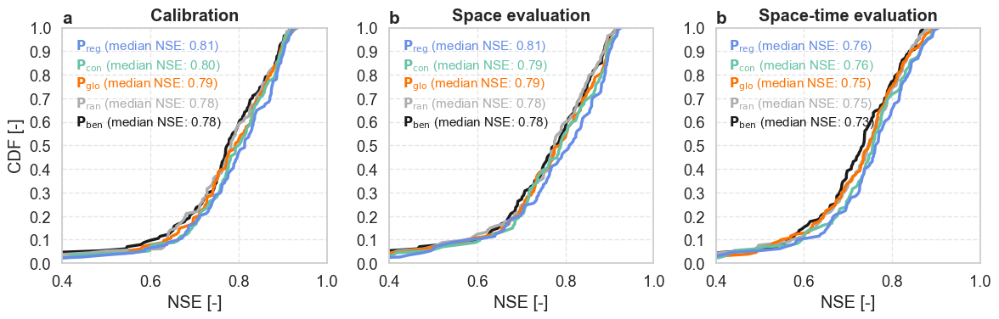

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# -------------------------
# Color and label maps
# -------------------------
colors = {
    'nse_rand': "#adacac",
    'nse_nogeo': 'k',
    'nse_g1comp': "#fd7200",
    'nse_c1comp': "#66c2a5",
    'nse_r1comp': "#668de7",
}

labels_pretty = {
    'nse_rand': r"$\mathbf{P_{\mathrm{ran}}}$",
    'nse_nogeo': r"$\mathbf{P_{\mathrm{ben}}}$",
    'nse_g1comp': r"$\mathbf{P_{\mathrm{glo}}}$",
    'nse_c1comp': r"$\mathbf{P_{\mathrm{con}}}$",
    'nse_r1comp': r"$\mathbf{P_{\mathrm{reg}}}$",
}

model_order = [
    'nse_nogeo',
    'nse_rand',
    'nse_g1comp',
    'nse_c1comp',
    'nse_r1comp'
]

# -------------------------
# Plotting function
# -------------------------
def plot_cdf_mean(ax, data_input, title, label_letter):

    # Handle dict or DataFrame input
    if isinstance(data_input, dict):
        dfs = list(data_input.values())
        all_data = pd.concat(dfs, axis=0)
    elif isinstance(data_input, pd.DataFrame):
        all_data = data_input.copy()
    else:
        raise ValueError("data_input must be a dict of DataFrames or a single DataFrame.")

    # Mean over repetitions
    data_combined = all_data.groupby(all_data.index).mean()

    medians = {}

    # ---- Plot CDFs ----
    for model_type in model_order:
        if model_type not in data_combined.columns:
            continue

        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue

        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)

        ax.plot(
            nse_values,
            cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

        medians[model_type] = np.median(nse_values)

    # ---- Median text inside plot ----
    y0 = 0.6        # starting vertical position (axes coords)
    dy = 0.08        # vertical spacing

    for i, model_type in enumerate(model_order):
        if model_type not in medians:
            continue

        ax.text(
            0.05,
            y0 + i * dy,
            f"{labels_pretty[model_type]} (median NSE: {medians[model_type]:.2f})",
            transform=ax.transAxes,
            fontsize=11,
            color=colors[model_type],
            ha='left',
            va='center'
        )

    # ---- Axis formatting ----
    ax.set_title(title, fontweight="bold")
    ax.set_xlim(0.4, 1)
    ax.set_ylim(0, 1.0)
    ax.set_xlabel("NSE [-]")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))

    # Subplot label
    ax.text(
        0,
        1.075,
        label_letter,
        transform=ax.transAxes,
        fontsize=15,
        fontweight='bold',
        va='top',
        ha='left'
    )

# -------------------------
# Figure layout
# -------------------------
sns.set(style="whitegrid", font_scale=1.2)
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharey=False)

# ---- Legend-only panel ----
#axs[0].axis("off")

#for model_type in model_order:
#    axs[0].plot(
#        [],
#        [],
#        color=colors[model_type],
#        linewidth=2.5,
#        label=labels_pretty[model_type]
#    )
#
#axs[0].legend(
#    title="Model experiment",
#    loc="center",
#    frameon=False,
#    fontsize=12,
#    title_fontsize=14
#)

# ---- Space evaluation ----
plot_cdf_mean(
    axs[0],
    data_diff_calibration_complete_all,
    "Calibration",
    "a"
)

# ---- Space-time evaluation ----
plot_cdf_mean(
    axs[1],
    data_diff_cal_complete_all,
    "Space evaluation",
    "b"
)

# ---- Space-time evaluation ----
plot_cdf_mean(
    axs[2],
    data_diff_val_complete_all,
    "Space-time evaluation",
    "b"
)

axs[0].set_ylabel("CDF [-]")
#axs[0].hlines(xmin=0, xmax=1, y=0.5, color='red', linestyle='--', linewidth=0.7)
#axs[1].hlines(xmin=0, xmax=1, y=0.5, color='red', linestyle='--', linewidth=0.7)
#axs[2].hlines(xmin=0,xmax=1, y=0.5, color='red', linestyle='--', linewidth=0.7)

# ---- Save & show ----
plt.tight_layout()
plt.savefig(
    "../results/figs/figures/jpgs/fig04.jpg",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

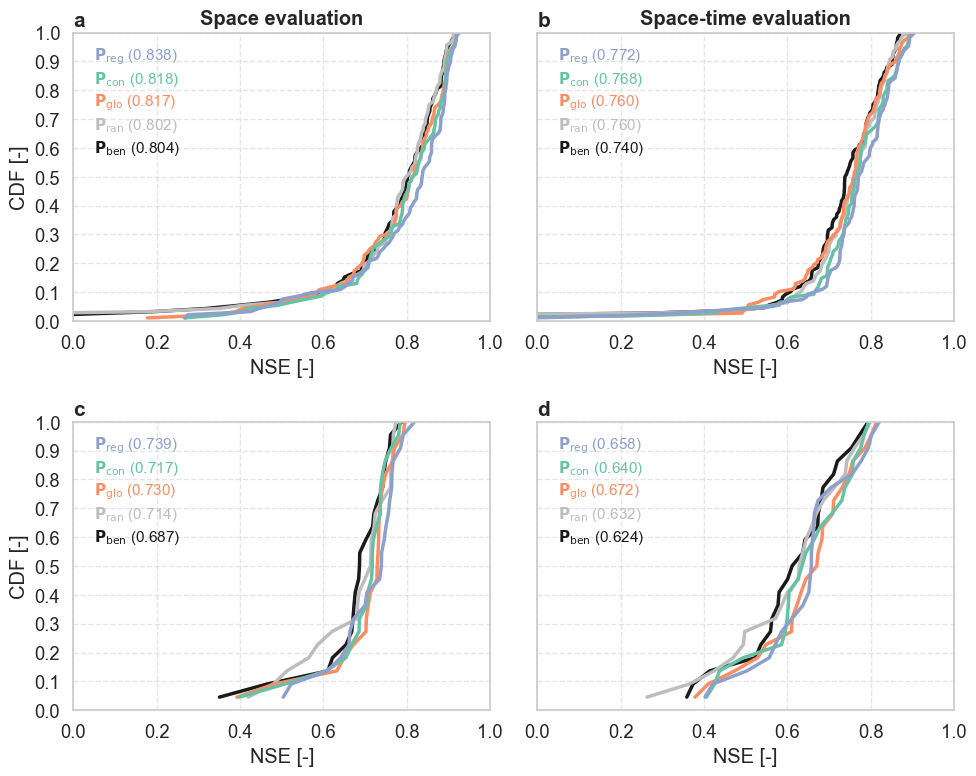

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# -------------------------
# Color and label maps
# -------------------------
colors = {
    'nse_rand': '#bdbdbd',
    'nse_nogeo': 'k',
    'nse_g1comp': '#fc8d62',
    'nse_c1comp': '#66c2a5',
    'nse_r1comp': '#8da0cb',
}

labels_pretty = {
    'nse_rand': r"$\mathbf{P_{\mathrm{ran}}}$",
    'nse_nogeo': r"$\mathbf{P_{\mathrm{ben}}}$",
    'nse_g1comp': r"$\mathbf{P_{\mathrm{glo}}}$",
    'nse_c1comp': r"$\mathbf{P_{\mathrm{con}}}$",
    'nse_r1comp': r"$\mathbf{P_{\mathrm{reg}}}$",
}

model_order = [
    'nse_nogeo',
    'nse_rand',
    'nse_g1comp',
    'nse_c1comp',
    'nse_r1comp'
]

# -------------------------
# Plotting function (UNCHANGED)
# -------------------------
def plot_cdf_mean(ax, data_input, title, label_letter):

    if isinstance(data_input, dict):
        all_data = pd.concat(list(data_input.values()), axis=0)
    elif isinstance(data_input, pd.DataFrame):
        all_data = data_input.copy()
    else:
        raise ValueError("data_input must be a dict or DataFrame")

    data_combined = all_data.groupby(all_data.index).mean()
    medians = {}

    for model_type in model_order:
        if model_type not in data_combined.columns:
            continue

        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue

        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)

        ax.plot(
            nse_values,
            cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

        medians[model_type] = np.median(nse_values)

    y0, dy = 0.6, 0.08
    for i, model_type in enumerate(model_order):
        if model_type in medians:
            ax.text(
                0.05, y0 + i * dy,
                f"{labels_pretty[model_type]} ({medians[model_type]:.3f})",
                transform=ax.transAxes,
                fontsize=11,
                color=colors[model_type],
                ha="left", va="center"
            )

    ax.set_title(title, fontweight="bold")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_xlabel("NSE [-]")
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))

    ax.text(
        0, 1.075, label_letter,
        transform=ax.transAxes,
        fontsize=15, fontweight="bold",
        va="top", ha="left"
    )

# -------------------------
# Figure layout (2x2)
# -------------------------
sns.set(style="whitegrid", font_scale=1.2)
fig, axs = plt.subplots(2, 2, figsize=(10, 8), sharey=True)

basins = {
    "Moselle": network_estreams_moselle_108_gauges.index.tolist(),
    "Garonne": network_estreams_garonne_22_gauges.index.tolist(),
}

labels = ["a", "b", "c", "d"]
panel = 0

for i, (basin_name, basin_ids) in enumerate(basins.items()):

    # ---- Filter data ----
    df_space = data_diff_cal_complete_all.copy()
    df_space["basin_id"] = df_space.index
    df_space = df_space[df_space["basin_id"].isin(basin_ids)]

    df_space_time = data_diff_val_complete_all.copy()
    df_space_time["basin_id"] = df_space_time.index
    df_space_time = df_space_time[df_space_time["basin_id"].isin(basin_ids)]

    # ---- Space ----
    plot_cdf_mean(
        axs[i, 0],
        df_space.iloc[:, 0:5],
        f" ",
        labels[panel]
    )
    panel += 1

    # ---- Space-time ----
    plot_cdf_mean(
        axs[i, 1],
        df_space_time.iloc[:, 0:5],
        f" ",
        labels[panel]
    )
    panel += 1
axs[0, 0].set_title("Space evaluation", fontweight="bold")
axs[0, 1].set_title("Space-time evaluation", fontweight="bold")

# Shared y-label
axs[0, 0].set_ylabel("CDF [-]")
axs[1, 0].set_ylabel("CDF [-]")

# Legend (only once)
#axs[0, 1].legend(frameon=False, loc="lower right")

plt.tight_layout()

#plt.savefig(
#    "../results/figs/figures/S7.png",
#    dpi=300,
#    bbox_inches="tight"
#)
plt.show()


In [38]:
# Save the csv for the further climatic correction analysis
#data_diff_calibration_complete_garonne.to_csv("../data/precipitation_correction/garonne_clim.csv")
#data_diff_calibration_complete.to_csv("../data/precipitation_correction/moselle_clim.csv")

#### Get some values from CDF

In [39]:
def get_mean_cdf_dataframe(data_input, phase_name):
    # Accept dict of DataFrames or a single DataFrame
    if isinstance(data_input, dict):
        dfs = list(data_input.values())
        all_data = pd.concat(dfs, axis=0)
    elif isinstance(data_input, pd.DataFrame):
        all_data = data_input.copy()
    else:
        raise ValueError("data_input must be a dict of DataFrames or a single DataFrame.")

    data_combined = all_data.groupby(all_data.index).median()

    cdf_dict = {}
    for model_type in ['nse_rand', 'nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        if model_type not in data_combined.columns:
            continue
        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue
        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
        df_model = pd.DataFrame({
            'NSE': nse_values,
            'CDF': cumulative
        })
        cdf_dict[model_type] = df_model

    return pd.concat(cdf_dict, names=["Model"])

In [40]:
cdf_cal = get_mean_cdf_dataframe(data_diff_calibration_complete_all, "Calibration")
cdf_val = get_mean_cdf_dataframe(data_diff_cal_complete_all.iloc[:, 0:5], "Space validation")
cdf_valst = get_mean_cdf_dataframe(data_diff_val_complete_all, "Space-time validation")

In [41]:
# Space validation results
print(cdf_val.loc["nse_rand"][cdf_val.loc["nse_rand"].CDF > 0.499499].head(1))
print(cdf_val.loc["nse_nogeo"][cdf_val.loc["nse_nogeo"].CDF > 0.499].head(1))
print(cdf_val.loc["nse_g1comp"][cdf_val.loc["nse_g1comp"].CDF > 0.499].head(1))
print(cdf_val.loc["nse_c1comp"][cdf_val.loc["nse_c1comp"].CDF > 0.499499].head(1))
print(cdf_val.loc["nse_r1comp"][cdf_val.loc["nse_r1comp"].CDF > 0.499].head(1))

         NSE  CDF
56  0.775133  0.5
         NSE  CDF
56  0.775591  0.5
         NSE  CDF
56  0.786545  0.5
         NSE  CDF
56  0.789382  0.5
         NSE  CDF
56  0.808835  0.5


In [42]:
# Space validation results
print(cdf_valst.loc["nse_rand"][cdf_valst.loc["nse_rand"].CDF > 0.499499].head(1))
print(cdf_valst.loc["nse_nogeo"][cdf_valst.loc["nse_nogeo"].CDF > 0.499].head(1))
print(cdf_valst.loc["nse_g1comp"][cdf_valst.loc["nse_g1comp"].CDF > 0.499].head(1))
print(cdf_valst.loc["nse_c1comp"][cdf_valst.loc["nse_c1comp"].CDF > 0.499499].head(1))
print(cdf_valst.loc["nse_r1comp"][cdf_valst.loc["nse_r1comp"].CDF > 0.499].head(1))

         NSE  CDF
64  0.745389  0.5
         NSE  CDF
64  0.734354  0.5
         NSE  CDF
64  0.748184  0.5
         NSE  CDF
64  0.755933  0.5
         NSE  CDF
64  0.762095  0.5


In [43]:
# Space validation results
print(cdf_cal.loc["nse_rand"][cdf_cal.loc["nse_rand"].CDF > 0.499499].head(1))
print(cdf_cal.loc["nse_nogeo"][cdf_cal.loc["nse_nogeo"].CDF > 0.499].head(1))
print(cdf_cal.loc["nse_g1comp"][cdf_cal.loc["nse_g1comp"].CDF > 0.499].head(1))
print(cdf_cal.loc["nse_c1comp"][cdf_cal.loc["nse_c1comp"].CDF > 0.499499].head(1))
print(cdf_cal.loc["nse_r1comp"][cdf_cal.loc["nse_r1comp"].CDF > 0.499].head(1))

         NSE  CDF
56  0.782346  0.5
         NSE  CDF
56  0.774007  0.5
        NSE  CDF
56  0.79235  0.5
        NSE  CDF
56  0.79956  0.5
         NSE  CDF
56  0.813356  0.5


### Scatter plots signatures

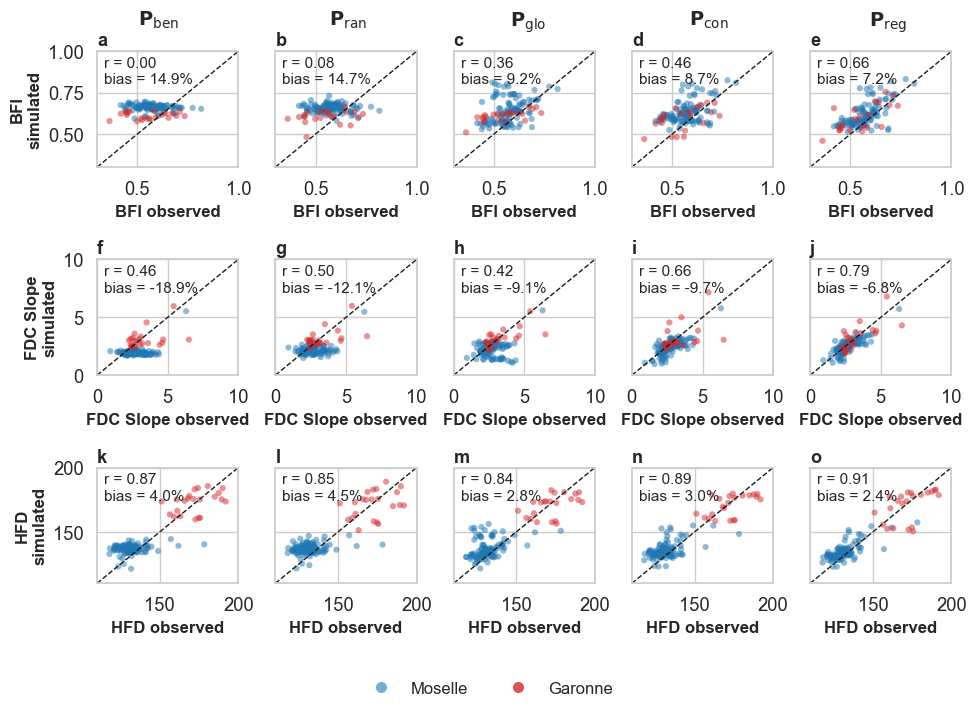

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

# Define suffixes and scales
suffixes = ['nogeo', 'rand', 'g1comp', 'c1comp', 'r1comp']
scale_titles = [
    r"$\mathbf{P_{\mathrm{ben}}}$",
    r"$\mathbf{P_{\mathrm{ran}}}$",
    r"$\mathbf{P_{\mathrm{glo}}}$",
    r"$\mathbf{P_{\mathrm{con}}}$",
    r"$\mathbf{P_{\mathrm{reg}}}$"
]

# DEFINE BASIN COLORS
basin_colors = {
    "moselle": "#1f77b4",   # blue
    "garonne": "#d62728",  # red
}

def get_basin_color(gauge_id):
    if gauge_id in network_estreams_moselle_108_gauges.index.tolist():
        return basin_colors["moselle"]
    elif gauge_id in network_estreams_garonne_22_gauges.index.tolist():
        return basin_colors["garonne"]
    else:
        return "grey"  # fallback (should not happen)

# Precompute colors in dataframe order
point_colors = data_diff_val_complete_all.index.map(get_basin_color)

# CREATE SUBPLOTS
fig, axs = plt.subplots(3, 5, figsize=(10, 7), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]

        var_obs  = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"

        # Moselle
        moselle_mask = data_diff_val_complete_all.index.isin(
            network_estreams_moselle_108_gauges.index
        )

        ax.scatter(
            data_diff_val_complete_all.loc[moselle_mask, var_obs],
            data_diff_val_complete_all.loc[moselle_mask, var_pred],
            c=basin_colors["moselle"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1
        )

        # Garonne
        garonne_mask = data_diff_val_complete_all.index.isin(
            network_estreams_garonne_22_gauges.index
        )

        ax.scatter(
            data_diff_val_complete_all.loc[garonne_mask, var_obs],
            data_diff_val_complete_all.loc[garonne_mask, var_pred],
            c=basin_colors["garonne"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=2
        )


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels([])

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # Correlation & bias
        p = data_diff_val_complete_all[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        bias_rel = (
            100
            * (data_diff_val_complete_all[var_pred].median()
               - data_diff_val_complete_all[var_obs].median())
            / data_diff_val_complete_all[var_obs].median()
        )
        #x = data_diff_val_complete_all[var_obs].values
        #y = data_diff_val_complete_all[var_pred].values

        #R = np.corrcoef(x, y)[0, 1]
        #CCC = compute_ccc(x, y)

        #bias_rel = 100 * (np.nanmedian(y) - np.nanmedian(x)) / np.nanmedian(x)
        x = data_diff_val_complete_all[var_obs]
        y = data_diff_val_complete_all[var_pred]

        bias_rel = 100 * np.nanmedian((y - x) / x)

        ax.text(
            0.05, 0.72,
            f"r = {p:.2f}\nbias = {bias_rel:.1f}%",
            #f"rs = {p:.2f}\nCCC = {CCC:.2f}\nbias = {bias_rel:.1f}%",

            transform=ax.transAxes,
            fontsize=11,
            bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )


        # Subplot letter
        subplot_idx = row * 5 + col
        ax.text(
            0.00, 1.17, letters[subplot_idx],
            transform=ax.transAxes,
            fontsize=13,
            fontweight='bold',
            va='top',
            ha='left'
        )

        # Axis limits
        if metric == 'bfi':
            ax.set_xlim(0.3, 1)
            ax.set_ylim(0.3, 1)
            ax.plot([0.3, 1], [0.3, 1], 'k--', lw=1)
        elif metric == 'slope':
            ax.set_xlim(0, 10)
            ax.set_ylim(0, 10)
            ax.plot([0, 10], [0, 10], 'k--', lw=1)
        elif metric == 'hfd':
            ax.set_xlim(110, 200)
            ax.set_ylim(110, 200)
            ax.plot([110, 200], [110, 200], 'k--', lw=1)

# LEGEND (INSTEAD OF COLORBAR)
from matplotlib.lines import Line2D

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Moselle',
           markerfacecolor=basin_colors["moselle"], markersize=8, markeredgecolor='none', alpha=0.6),
    Line2D([0], [0], marker='o', color='w', label='Garonne',
           markerfacecolor=basin_colors["garonne"], markersize=8, markeredgecolor='none', alpha=0.8),
]

fig.legend(
    handles=legend_elements,
    loc="lower center",
    ncol=2,
    frameon=False,
    fontsize=12
)

# Column titles
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 1, title, ha='center', va='top',
             fontsize=14, fontweight='bold')

# Layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.18)

## Save
#plt.savefig("../results/figs/figures/jpgs/fig06.jpg", dpi=300)
#plt.show()

## Export some tables for Supporting Information

In [45]:
import pandas as pd
import numpy as np

# Containers
rows = []

for metric in metrics:
    var_obs = f"{metric}_obs"

    for suffix in suffixes:
        var_pred = f"{metric}_{suffix}"

        # Extract vectors
        x = data_diff_val_complete_all[var_obs].values
        y = data_diff_val_complete_all[var_pred].values

        # Spearman correlation
        r_spearman = (
            data_diff_val_complete_all[[var_obs, var_pred]]
            .corr(method="pearson")
            .iloc[0, 1]
        )

        # Relative bias (%)
        bias_rel = 100 * np.nanmedian((y - x) / x)

        rows.append({
            "metric": metric,
            "experiment": suffix,
            "r_spearman": r_spearman,
            "bias_%": bias_rel
        })

# Create dataframe
df_stats = pd.DataFrame(rows)

# Pivot for nice table layout (optional)
table_r = df_stats.pivot(index="metric", columns="experiment", values="r_spearman")
table_bias = df_stats.pivot(index="metric", columns="experiment", values="bias_%")


In [46]:
data_diff_val_complete_all[data_diff_val_complete_all["slope_obs"] > 5][["slope_obs", "slope_nogeo", "slope_c1comp", "slope_r1comp", "slope_g1comp"]]

,slope_obs,slope_nogeo,slope_c1comp,slope_r1comp,slope_g1comp
FR003272,6.300326,5.531658,5.778109,5.722935,5.602927
FR004119,5.423184,5.965911,7.158691,6.799324,5.522959
FR004140,6.495121,3.075605,3.059398,4.301211,3.526012


In [48]:
table_bias

experiment,c1comp,g1comp,nogeo,r1comp,rand
metric,,,,,
bfi,8.736036,9.193358,14.865520,7.245825,14.745269
hfd,3.044818,2.796726,4.015456,2.417811,4.508096
slope,-9.656746,-9.093759,-18.890698,-6.777439,-12.109560


In [49]:
table_r

experiment,c1comp,g1comp,nogeo,r1comp,rand
metric,,,,,
bfi,0.461883,0.355305,0.003501,0.656402,0.083731
hfd,0.891094,0.842285,0.865250,0.911763,0.849987
slope,0.664268,0.422490,0.463573,0.787021,0.504957


In [50]:
is_moselle = network_estreams_moselle_108_gauges.index.tolist()
is_garonne = network_estreams_garonne_22_gauges.index.tolist()

In [51]:
import pandas as pd
import numpy as np

rows = []

basins = {
    "Garonne": is_garonne,
    "Moselle": is_moselle,
}

for basin_name, basin_idx in basins.items():

    # Subset once per basin
    df_basin = data_diff_val_complete_all.loc[basin_idx]

    for metric in metrics:
        var_obs = f"{metric}_obs"

        for suffix in suffixes:
            var_pred = f"{metric}_{suffix}"

            # Extract vectors
            x = df_basin[var_obs].values
            y = df_basin[var_pred].values

            # Spearman correlation
            r_spearman = (
                df_basin[[var_obs, var_pred]]
                .corr(method="pearson")
                .iloc[0, 1]
            )

            # Relative bias (%)
            bias_rel = 100 * np.nanmedian((y - x) / x)

            rows.append({
                "basin": basin_name,
                "metric": metric,
                "experiment": suffix,
                "r_spearman": r_spearman,
                "bias_%": bias_rel
            })

# Single tidy dataframe
df_stats = pd.DataFrame(rows)
df_stats

,basin,metric,experiment,r_spearman,bias_%
0,Garonne,bfi,nogeo,0.080909,9.543594
1,Garonne,bfi,rand,0.224271,11.539087
2,Garonne,bfi,g1comp,0.688378,12.155101
3,Garonne,bfi,c1comp,0.529046,6.107360
4,Garonne,bfi,r1comp,0.696738,11.766416
5,Garonne,slope,nogeo,0.399519,2.718794
6,Garonne,slope,rand,0.540708,-1.184213
7,Garonne,slope,g1comp,0.658655,1.543675
8,Garonne,slope,c1comp,0.441922,-2.697968
9,Garonne,slope,r1comp,0.711828,0.030283


In [52]:
table_r = df_stats.pivot_table(
    index=["basin", "metric"],
    columns="experiment",
    values="r_spearman"
)
table_r

experiment        c1comp    g1comp     nogeo    r1comp      rand
basin   metric                                                  
Garonne bfi     0.529046  0.688378  0.080909  0.696738  0.224271
        hfd     0.555898  0.491291  0.422622  0.524594  0.361038
        slope   0.441922  0.658655  0.399519  0.711828  0.540708
Moselle bfi     0.434664  0.329372 -0.162355  0.643083 -0.062948
        hfd     0.517102  0.349383  0.223500  0.706436  0.257049
        slope   0.728382  0.221236  0.389570  0.797296  0.387858

In [53]:
table_r[["nogeo", "rand", "g1comp", "c1comp", "r1comp"]]

experiment         nogeo      rand    g1comp    c1comp    r1comp
basin   metric                                                  
Garonne bfi     0.080909  0.224271  0.688378  0.529046  0.696738
        hfd     0.422622  0.361038  0.491291  0.555898  0.524594
        slope   0.399519  0.540708  0.658655  0.441922  0.711828
Moselle bfi    -0.162355 -0.062948  0.329372  0.434664  0.643083
        hfd     0.223500  0.257049  0.349383  0.517102  0.706436
        slope   0.389570  0.387858  0.221236  0.728382  0.797296

In [54]:
table_bias = df_stats.pivot_table(
    index=["basin", "metric"],
    columns="experiment",
    values="bias_%"
)
table_bias[["nogeo", "rand", "g1comp", "c1comp", "r1comp"]]

experiment          nogeo       rand     g1comp     c1comp     r1comp
basin   metric                                                       
Garonne bfi      9.543594  11.539087  12.155101   6.107360  11.766416
        hfd      2.095610   1.414970   0.396654   0.194643  -0.735929
        slope    2.718794  -1.184213   1.543675  -2.697968   0.030283
Moselle bfi     15.401145  15.658090   8.896261   9.218204   7.069867
        hfd      4.319564   5.354669   3.204483   3.766361   2.667113
        slope  -21.371767 -14.107435 -12.295260 -10.701675  -7.204464

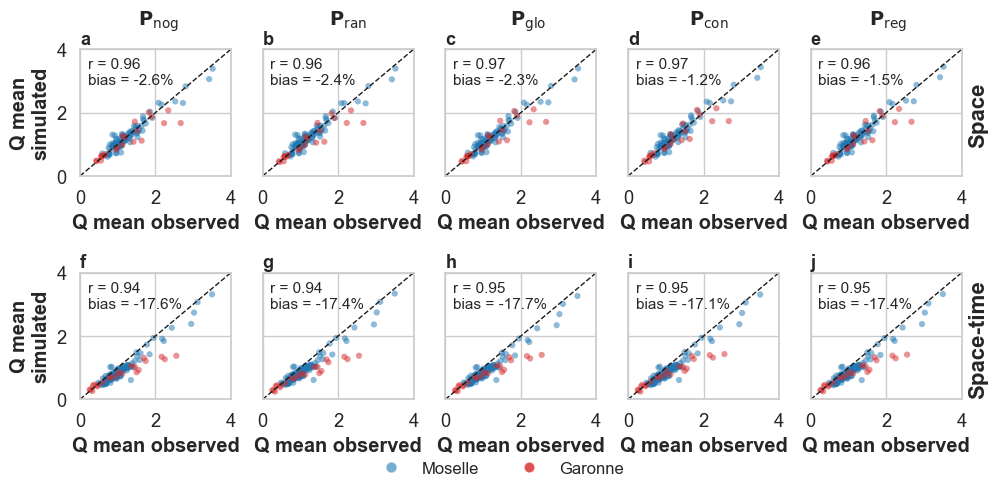

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string
from matplotlib.lines import Line2D

sns.set(style="whitegrid", font_scale=1.2)

# =========================
# CONFIG
# =========================
metrics = ["qmean"]
metric_titles = ["Q mean"]

suffixes = ["nogeo", "rand", "g1comp", "c1comp", "r1comp"]
scale_titles = [
    r"$\mathbf{P_{\mathrm{nog}}}$",
    r"$\mathbf{P_{\mathrm{ran}}}$",
    r"$\mathbf{P_{\mathrm{glo}}}$",
    r"$\mathbf{P_{\mathrm{con}}}$",
    r"$\mathbf{P_{\mathrm{reg}}}$",
]

basin_colors = {
    "moselle": "#1f77b4",
    "garonne": "#d62728",
}

letters = list(string.ascii_lowercase)

# =========================
# FIGURE SETUP
# =========================
fig, axs = plt.subplots(
    2, 5,
    figsize=(10, 5),
    sharex=False,
    sharey=False
)

# =========================
# LOOP OVER ROWS
# =========================
for row_idx, (df, row_title) in enumerate([
    (data_diff_cal_complete_all, "Space evaluation"),
    (data_diff_val_complete_all, "Space–time evaluation"),
]):

    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row_idx, col]

        var_obs  = "qmean_obs"
        var_pred = f"qmean_{suffix}"

        # Moselle
        moselle_mask = df.index.isin(
            network_estreams_moselle_108_gauges.index
        )

        ax.scatter(
            df.loc[moselle_mask, var_obs],
            df.loc[moselle_mask, var_pred],
            c=basin_colors["moselle"],
            s=20,
            alpha=0.5,
            edgecolor="none",
            zorder=1,
        )

        # Garonne
        garonne_mask = df.index.isin(
            network_estreams_garonne_22_gauges.index
        )

        ax.scatter(
            df.loc[garonne_mask, var_obs],
            df.loc[garonne_mask, var_pred],
            c=basin_colors["garonne"],
            s=20,
            alpha=0.5,
            edgecolor="none",
            zorder=2,
        )

        # Labels
        if col == 0:
            ax.set_ylabel("Q mean\nsimulated", fontweight="bold")
        else:
            ax.set_yticklabels([])

        ax.set_xlabel("Q mean observed", fontweight="bold")

        # Stats
        p = df[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        bias = 100 * (np.nanmean(df[var_pred]) - np.nanmean(df[var_obs])) / np.nanmean(df[var_obs])

        ax.text(
            0.05, 0.72,
            f"r = {p:.2f}\nbias = {bias:.1f}%",
            transform=ax.transAxes,
            fontsize=11,
        )

        # 1:1 line
        ax.set_xlim(0, 4)
        ax.set_ylim(0, 4)
        ax.plot([0, 4], [0, 4], "k--", lw=1)

        # Subplot letter
        ax.text(
            0.00, 1.15,
            letters[row_idx * 5 + col],
            transform=ax.transAxes,
            fontweight="bold",
            fontsize=13,
            va="top",
            ha="left",
        )

# =========================
# COLUMN TITLES
# =========================
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 0.96, title, ha="center", va="top",
             fontsize=14, fontweight="bold")

# =========================
# ROW TITLES
# =========================
# =========================
# ROW TITLES (VERTICAL, RIGHT SIDE)
# =========================
fig.text(
    1, 0.75, "Space",
    rotation=90,
    va="center",
    ha="right",
    fontsize=16,
    fontweight="bold"
)

fig.text(
    1, 0.3, "Space-time",
    rotation=90,
    va="center",
    ha="right",
    fontsize=16,
    fontweight="bold"
)

# =========================
# LEGEND
# =========================
legend_elements = [
    Line2D([0], [0], marker="o", color="w", label="Moselle",
           markerfacecolor=basin_colors["moselle"], markersize=8, alpha=0.6),
    Line2D([0], [0], marker="o", color="w", label="Garonne",
           markerfacecolor=basin_colors["garonne"], markersize=8, alpha=0.8),
]

fig.legend(
    handles=legend_elements,
    loc="lower center",
    ncol=2,
    frameon=False,
    fontsize=12,
)

# =========================
# FINALIZE
# =========================
plt.tight_layout()
plt.subplots_adjust(top=0.88, bottom=0.18)

#plt.savefig(
#    "../results/figs/figures/S11.png",
#    dpi=300,
#    bbox_inches="tight",
#)

plt.show()


## Some further evaluation

In [89]:
estreams_attributes_clipped.loc["DEBU1959", ["perm_low_regi","perm_medium_regi", 
                                                     "perm_high_regi", 
                                                     "perm_low_cont2", "perm_medium_cont2",
                                                     "perm_high_cont2",
                                                     
                                                     "perm_low_glob2", 
                                                     "perm_medium_glob2", "perm_high_glob2"]]

perm_low_regi             19.0
perm_medium_regi          56.0
perm_high_regi            25.0
perm_low_cont2       22.741459
perm_medium_cont2       54.772
perm_high_cont2         22.487
perm_low_glob2             4.0
perm_medium_glob2         65.0
perm_high_glob2           31.0
Name: DEBU1959, dtype: object

In [ ]:
estreams_attributes_garonne.loc["FR001604", ["perm_low_regi","perm_medium_regi", 
                                                     "perm_high_regi", 
                                                     "perm_low_cont2", "perm_medium_cont2",
                                                     "perm_high_cont2",
                                                     "perm_low_glob2", 
                                                     "perm_medium_glob2", "perm_high_glob2"]]

perm_low_regi        39.0
perm_medium_regi     47.0
perm_high_regi       14.0
perm_low_cont2       26.0
perm_medium_cont2    57.0
perm_high_cont2      17.0
perm_low_glob2        3.0
perm_medium_glob2    68.0
perm_high_glob2      29.0
Name: FR001604, dtype: object

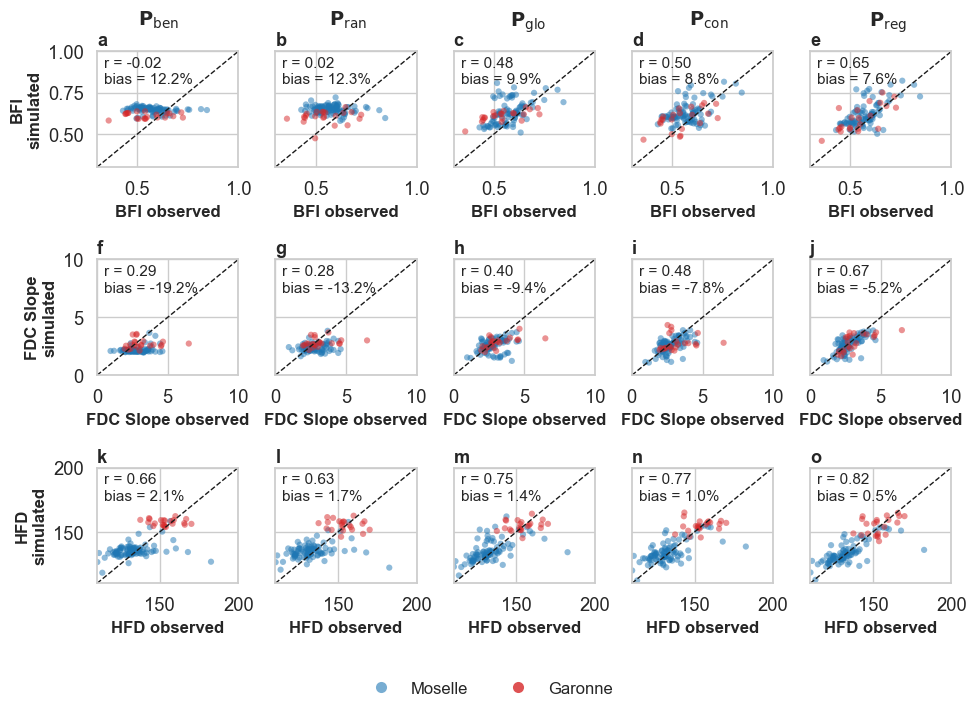

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

# Define suffixes and scales
suffixes = ['nogeo', 'rand', 'g1comp', 'c1comp', 'r1comp']
scale_titles = [
    r"$\mathbf{P_{\mathrm{ben}}}$",
    r"$\mathbf{P_{\mathrm{ran}}}$",
    r"$\mathbf{P_{\mathrm{glo}}}$",
    r"$\mathbf{P_{\mathrm{con}}}$",
    r"$\mathbf{P_{\mathrm{reg}}}$"
]

# DEFINE BASIN COLORS
basin_colors = {
    "moselle": "#1f77b4",   # blue
    "garonne": "#d62728",  # red
}

def get_basin_color(gauge_id):
    if gauge_id in network_estreams_moselle_108_gauges.index.tolist():
        return basin_colors["moselle"]
    elif gauge_id in network_estreams_garonne_22_gauges.index.tolist():
        return basin_colors["garonne"]
    else:
        return "grey"  # fallback (should not happen)

# Precompute colors in dataframe order
point_colors = data_diff_cal_complete_all.index.map(get_basin_color)

# CREATE SUBPLOTS
fig, axs = plt.subplots(3, 5, figsize=(10, 7), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]

        var_obs  = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"

        # Moselle
        moselle_mask = data_diff_cal_complete_all.index.isin(
            network_estreams_moselle_108_gauges.index
        )

        ax.scatter(
            data_diff_cal_complete_all.loc[moselle_mask, var_obs],
            data_diff_cal_complete_all.loc[moselle_mask, var_pred],
            c=basin_colors["moselle"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1
        )

        # Garonne
        garonne_mask = data_diff_cal_complete_all.index.isin(
            network_estreams_garonne_22_gauges.index
        )

        ax.scatter(
            data_diff_cal_complete_all.loc[garonne_mask, var_obs],
            data_diff_cal_complete_all.loc[garonne_mask, var_pred],
            c=basin_colors["garonne"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=2
        )


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels([])

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # Correlation & bias
        p = data_diff_cal_complete_all[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        bias_rel = (
            100
            * (data_diff_cal_complete_all[var_pred].mean()
               - data_diff_cal_complete_all[var_obs].mean())
            / data_diff_cal_complete_all[var_obs].mean()
        )
        x = data_diff_cal_complete_all[var_obs].values
        y = data_diff_cal_complete_all[var_pred].values

        R = np.corrcoef(x, y)[0, 1]
        #CCC = compute_ccc(x, y)

        bias_rel = 100 * (np.nanmean(y) - np.nanmean(x)) / np.nanmean(x)

        ax.text(
            0.05, 0.72,
            f"r = {p:.2f}\nbias = {bias_rel:.1f}%",
            #f"rs = {p:.2f}\nCCC = {CCC:.2f}\nbias = {bias_rel:.1f}%",

            transform=ax.transAxes,
            fontsize=11,
            bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )


        # Subplot letter
        subplot_idx = row * 5 + col
        ax.text(
            0.00, 1.17, letters[subplot_idx],
            transform=ax.transAxes,
            fontsize=13,
            fontweight='bold',
            va='top',
            ha='left'
        )

        # Axis limits
        if metric == 'bfi':
            ax.set_xlim(0.3, 1)
            ax.set_ylim(0.3, 1)
            ax.plot([0.3, 1], [0.3, 1], 'k--', lw=1)
        elif metric == 'slope':
            ax.set_xlim(0, 10)
            ax.set_ylim(0, 10)
            ax.plot([0, 10], [0, 10], 'k--', lw=1)
        elif metric == 'hfd':
            ax.set_xlim(110, 200)
            ax.set_ylim(110, 200)
            ax.plot([110, 200], [110, 200], 'k--', lw=1)

# LEGEND (INSTEAD OF COLORBAR)
from matplotlib.lines import Line2D

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Moselle',
           markerfacecolor=basin_colors["moselle"], markersize=8, markeredgecolor='none', alpha=0.6),
    Line2D([0], [0], marker='o', color='w', label='Garonne',
           markerfacecolor=basin_colors["garonne"], markersize=8, markeredgecolor='none', alpha=0.8),
]

fig.legend(
    handles=legend_elements,
    loc="lower center",
    ncol=2,
    frameon=False,
    fontsize=12
)

# Column titles
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 1, title, ha='center', va='top',
             fontsize=14, fontweight='bold')

# Layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.18)

## Save
#plt.savefig("../results/figs/figures/S5.png", dpi=300)
#plt.show()

## Other Main Figures: Threee geological maps

In [58]:
from matplotlib.lines import Line2D

def add_scalebar(ax, length_km=50, location=(0.05, 0.05), linewidth=2):
    """
    Adds a scale bar to a GeoAxes.
    
    Parameters
    ----------
    ax : matplotlib axis
    length_km : int
        Length of the scale bar in kilometers
    location : tuple
        (x, y) position in axis fraction coordinates
    linewidth : int
        Thickness of the scale bar
    """

    # Convert km to degrees (approximation valid for mid-latitudes)
    # 1 degree longitude ≈ 111 km * cos(latitude)
    mean_lat = (ax.get_ylim()[0] + ax.get_ylim()[1]) / 2
    km_per_degree = 111 * np.cos(np.deg2rad(mean_lat))
    length_deg = length_km / km_per_degree

    # Get axis limits
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()

    # Scale bar start point
    x_start = x_min + location[0] * (x_max - x_min)
    y_start = y_min + location[1] * (y_max - y_min) - 0.025

    # Draw scale bar
    ax.add_line(Line2D(
        [x_start, x_start + length_deg],
        [y_start, y_start],
        linewidth=linewidth,
        color='black'
    ))

    # Add label
    ax.text(
        x_start + length_deg / 2,
        y_start + 0.01 * (y_max - y_min) + 0.01,
        f"{length_km} km",
        ha='center',
        va='bottom',
        fontsize=8
    )

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/84910451.py:58: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/84910451.py:64: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/84910451.py:91: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/84910451.py:114: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True,


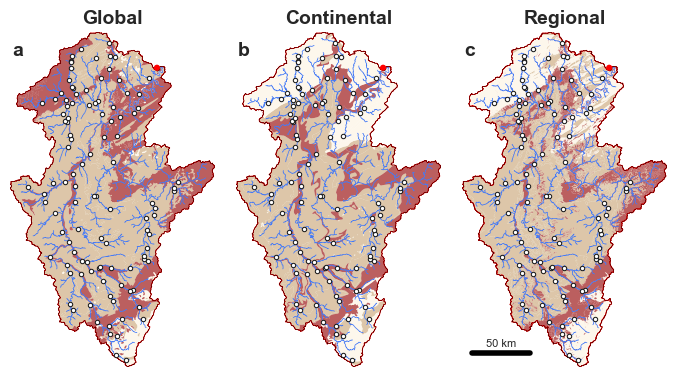

In [59]:
network_estreams_gdf = estreams_attributes_clipped_filters.loc[~estreams_attributes_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index
# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(7, 4))  # Two subplots side by side

# Select multiple geometries
FR_selected_gdf = moselle.copy()

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set plot limits to the bounding box of the selected study areas
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Plot the first geology shapefile with different colors for each class
GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True, 
                    categorical=True, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax1, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)

# Plot the mask to cover everything outside the study area
#mask.plot(ax=ax1, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)

# Set plot title and labels
ax1.set_xlabel('')
ax1.set_ylabel('')



# Plot the second geology shapefile with different colors for each class
geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True, 
                    categorical=True, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax2, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax2, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)
# Set plot limits to the bounding box of the study area
ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)

# Set plot title and labels
#ax2.set_title('(c)', loc="left")
ax2.set_xlabel('')
ax2.set_ylabel('')
custom_label = ["Low", "Medium-low", "Medium-high", "High"]

# Plot the third geology shapefile with different colors for each class
geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True, 
                    categorical=True, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax3, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax3, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)


# Plot the river
rivers_moselle.plot(ax=ax1, linewidth=0.5, label='River network', color="#457af6")
rivers_moselle.plot(ax=ax2, linewidth=0.5, label='River network', color="#457af6")
rivers_moselle.plot(ax=ax3, linewidth=0.5, label='River network', color="#457af6")

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax3, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# Set plot title and labels
#ax3.set_title('(d)', loc="left")

text_to_subplots = ["Global", "Continental", "Regional"]
i = 0 
subtiles = ["a", "b", "c"]
for ax, subtitle in zip([ax1, ax2, ax3], subtiles):

    # Overlay the study area boundaries
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25, label='Sub-catchments')

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    #ax.text(0.45, 1.075, text_to_subplots[i], transform=ax.transAxes, 
    #        fontsize=10, ha='center', va='top', color='black', fontweight='bold')
    ax.set_title(text_to_subplots[i], loc="center", fontsize=14, fontweight="bold")
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    i = i + 1

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.75),
    'Medium': to_rgba('tan', 0.75),
    'High': to_rgba('brown', 0.75)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
#legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
#                   bbox_to_anchor=(0.5, -0.01), ncol=5)
## Make the legend title bold
#legend.get_title().set_fontweight('bold')
for ax in [ax3]:
    add_scalebar(ax, length_km=50, linewidth=4)

# Adjust the layout to remove extra space
plt.tight_layout()

#fig.savefig("../results/figs/figures/fig02a.png", dpi=300, bbox_inches='tight')

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/3537935392.py:91: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/3537935392.py:93: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/3537935392.py:95: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/3537935392.py:180: U

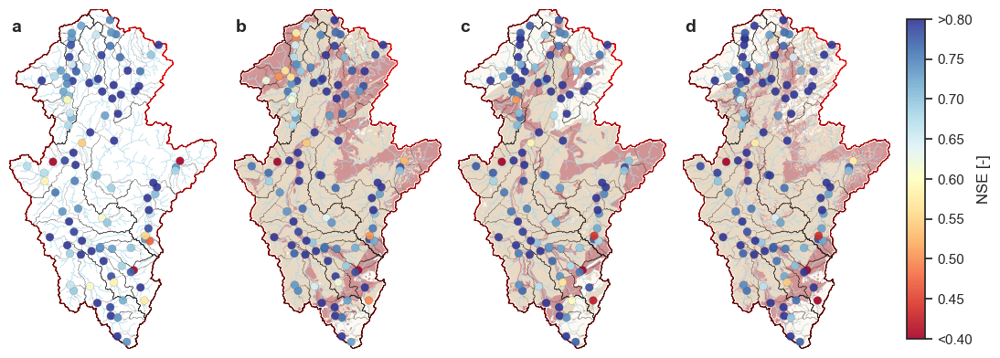

In [60]:
catchment_boundaries_moselle = catchment_boundaries.loc[network_estreams_gdf.index.tolist(), :]

selected_ids = ["FR000144", "FR000185", "FR003250","FR003280"]


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines


network_estreams_gdf = estreams_attributes_clipped_filters.loc[~estreams_attributes_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set style
sns.set_theme(style="ticks")

# Copy and add coordinates
df = data_diff_val_complete.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

# Create figure
fig, axes = plt.subplots(1, 4, figsize=(10, 5), sharex=True, sharey=True)

# NSE columns and titles
nse_cols = ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']
titles = ['a', 'b', 'c', 'd']
main_titles = [r"$\mathbf{B_{\mathrm{ben}}}$", r"$\mathbf{B_{\mathrm{glo}}}$", r"$\mathbf{B_{\mathrm{con}}}$",
                r"$\mathbf{B_{\mathrm{reg}}}$"]

background_maps = ['none', 'GLiM', 'median', 'high']

# Set plot limits to the bounding box of the selected study areas
FR_selected_gdf = moselle.copy()
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

## Create a mask that covers the entire plotting area
#plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
#mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Color setup
vmin, vmax = 0.4, 0.8
cmap_nse = plt.cm.RdYlBu

# Plot loop
for ax, col, subtitle, maintitle, bg_type in zip(axes, nse_cols, titles, main_titles, background_maps):

    # Add background geology map where appropriate
    if bg_type == 'GLiM':
        GLiM_moselle_dissolved.plot(column='permeability', ax=ax, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'median':
        geology_median_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'high':
        geology_high_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

    # Add rivers and boundary for all
    moselle.plot(ax=ax, color='none', linewidth=2, alpha=1)
    rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

#   if bg_type != 'none':
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)
    mask.plot(ax=ax, facecolor='white', edgecolor='red', linewidth=0.75)

    # Scatter NSE values
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot letter
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Clean look
    ax.set_xticks([])
    ax.set_yticks([])
    #ax.set_xlabel(maintitle, fontsize=14, fontweight='bold')
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)


    catchment_boundaries_moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.1, label='Sub-catchments')



# Colorbar setup
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
ticks = np.linspace(0.4, 0.8, num=9)
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f">0.80"]
#cbar.set_ticks(ticks)
cbar.set_ticks(np.arange(vmin, vmax + 0.05, 0.05))

cbar.set_ticklabels(tick_labels)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.5),
    'Medium': to_rgba('tan', 0.5),
    'High': to_rgba('brown', 0.5)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, linewidth=0.5)
                   for label, color in color_dict_legend.items()]

## Add the legend outside the plot area with minimal space
#legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
#                   bbox_to_anchor=(0.5, -0.01), ncol=5)
## Make the legend title bold
#legend.get_title().set_fontweight('bold')


#axes[0].text(7.38,48.7, "FR000185", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.2,48.38, "FR000144", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.35,48.15, "FR003250", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(5.7,49.28, "FR003280", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
	
# Save and show
plt.tight_layout()

# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/figures/fig8a.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/3592926503.py:63: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union


Text(0.79, 0.16, 'Permeability')

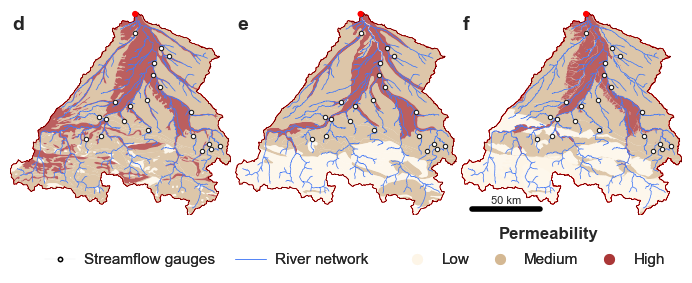

In [61]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, box
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# --------------------------------------------------
# Prepare gauge GeoDataFrame
# --------------------------------------------------
network_estreams_gdf = estreams_attributes_garonne_clipped_filters.loc[
    ~estreams_attributes_garonne_clipped_filters.index.duplicated(keep='first')
].copy()

geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# --------------------------------------------------
# Figure and axes
# --------------------------------------------------
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(7, 3))
fig.subplots_adjust(left=0.02, right=0.98, top=0.98, bottom=0.20, wspace=0.02)

FR_selected_gdf = garonne.copy()

# --------------------------------------------------
# Color mappings
# --------------------------------------------------
color_mapping_glim = {
    'very low': "oldlace",
    'low': "tan",
    'medium': "tan",
    'high': "brown"
}

color_mapping_geology = {
    'very low': "oldlace",
    'low': "tan",
    'medium': "tan",
    'high': "brown"
}

color_mapping_geology2 = {
    'very low': "oldlace",
    'low': "oldlace",
    'medium': "tan",
    'high': "brown"
}

GLiM_garonne_dissolved['color'] = GLiM_garonne_dissolved['permeability'].map(color_mapping_glim)
geology_median_garonne_dissolved['color'] = geology_median_garonne_dissolved['permeability'].map(color_mapping_geology)
geology_high_garonne_dissolved['color'] = geology_high_garonne_dissolved['permeability'].map(color_mapping_geology2)

# --------------------------------------------------
# Bounds and mask
# --------------------------------------------------
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3] + 0.02

plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1.0)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

combined_geometry = FR_selected_gdf.unary_union
mask['geometry'] = mask.difference(combined_geometry)

# --------------------------------------------------
# Panel 1
# --------------------------------------------------
GLiM_garonne_dissolved.plot(
    ax=ax1,
    color=GLiM_garonne_dissolved['color'],
    edgecolor='none',
    linewidth=0,
    alpha=0.75
)

FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='red', linewidth=0.5)

network_estreams_gdf.plot(
    ax=ax1,
    color='white',
    markersize=10,
    edgecolor='k',
    linewidth=0.75,
    zorder=100
)

network_estreams_gdf.loc[["FR001604"]].plot(
    ax=ax1,
    color='red',
    markersize=20,
    edgecolor='none',
    linewidth=0.5,
    zorder=101
)

rivers_garonne.plot(ax=ax1, linewidth=0.5, color='#457af6')

ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)
ax1.set_xlabel('')
ax1.set_ylabel('')

# --------------------------------------------------
# Panel 2
# --------------------------------------------------
geology_median_garonne_dissolved.plot(
    ax=ax2,
    color=geology_median_garonne_dissolved['color'],
    edgecolor='none',
    linewidth=0,
    alpha=0.75
)

FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='red', linewidth=0.5)

network_estreams_gdf.plot(
    ax=ax2,
    color='white',
    markersize=10,
    edgecolor='k',
    linewidth=0.75,
    zorder=100
)

network_estreams_gdf.loc[["FR001604"]].plot(
    ax=ax2,
    color='red',
    markersize=20,
    edgecolor='none',
    linewidth=0.5,
    zorder=101
)

rivers_garonne.plot(ax=ax2, linewidth=0.5, color='#457af6')

ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)
ax2.set_xlabel('')
ax2.set_ylabel('')

# --------------------------------------------------
# Panel 3
# --------------------------------------------------
geology_high_garonne_dissolved.plot(
    ax=ax3,
    color=geology_high_garonne_dissolved['color'],
    edgecolor='none',
    linewidth=0,
    alpha=0.75
)

FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='red', linewidth=0.5)

network_estreams_gdf.plot(
    ax=ax3,
    color='white',
    markersize=10,
    edgecolor='k',
    linewidth=0.75,
    zorder=100
)

network_estreams_gdf.loc[["FR001604"]].plot(
    ax=ax3,
    color='red',
    markersize=20,
    edgecolor='none',
    linewidth=0.5,
    zorder=101
)

rivers_garonne.plot(ax=ax3, linewidth=0.5, color='#457af6')

mask.plot(ax=ax3, facecolor='white', edgecolor='red', linewidth=0.5)

ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# --------------------------------------------------
# Common axis formatting
# --------------------------------------------------
subtiles = ["d", "e", "f"]

for ax, subtitle in zip([ax1, ax2, ax3], subtiles):
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])

    ax.text(
        0.01, 0.97, subtitle,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

# --------------------------------------------------
# Scalebar
# --------------------------------------------------
add_scalebar(ax3, length_km=50, linewidth=4)

# --------------------------------------------------
# Legends
# --------------------------------------------------
gauge_handle = Line2D(
    [0], [0],
    marker='o',
    color='black',
    markerfacecolor='white',
    markeredgecolor='black',
    markersize=3,
    linewidth=0.01,
    label='Streamflow gauges'
)

river_handle = Line2D(
    [0], [0],
    color='#457af6',
    linewidth=0.5,
    label='River network'
)

perm_handles = [
    Line2D([0], [0], marker='o', color='w',
           markerfacecolor=to_rgba('oldlace', 0.75),
           markeredgecolor='none', markersize=8, linewidth=0, label='Low'),
    Line2D([0], [0], marker='o', color='w',
           markerfacecolor=to_rgba('tan', 0.75),
           markeredgecolor='none', markersize=8, linewidth=0, label='Medium'),
    Line2D([0], [0], marker='o', color='w',
           markerfacecolor=to_rgba('brown', 0.75),
           markeredgecolor='none', markersize=8, linewidth=0, label='High')
]

legend_features = fig.legend(
    handles=[gauge_handle, river_handle],
    loc='lower left',
    bbox_to_anchor=(0.05, 0.03),
    ncol=2,
    frameon=False,
    handletextpad=0.6,
    columnspacing=1.3
)

legend_perm = fig.legend(
    handles=perm_handles,
    loc='lower left',
    bbox_to_anchor=(0.56, 0.03),
    ncol=3,
    frameon=False,
    handletextpad=0.6,
    columnspacing=1.0
)

fig.add_artist(legend_features)
fig.add_artist(legend_perm)

fig.text(
    0.79, 0.16,
    'Permeability',
    ha='center',
    va='bottom',
    fontweight='bold'
)

# --------------------------------------------------
# Save
# --------------------------------------------------
#fig.savefig(
#    "../results/figs/figures/fig02b.png",
#    dpi=300
#)

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/1051329369.py:84: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/1051329369.py:99: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/1051329369.py:101: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/1051329369.py:192: UserWarning: This figure includes Axes that are not compatible with tight_l

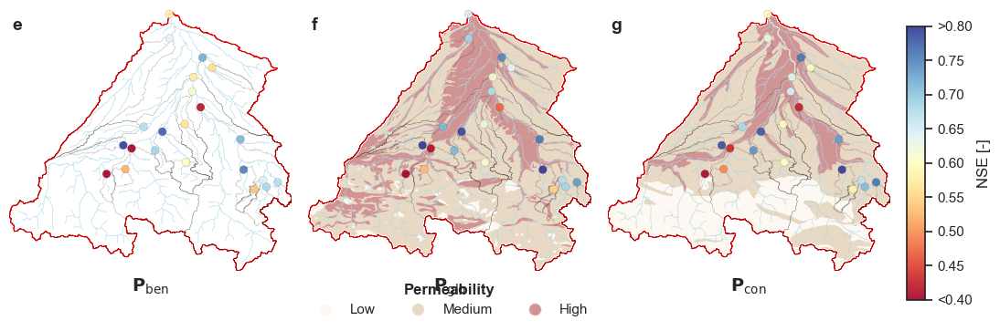

In [62]:
network_estreams_gdf = estreams_attributes_garonne_clipped_filters.loc[~estreams_attributes_garonne_clipped_filters.index.duplicated(keep='first')]

catchment_boundaries_garonne = catchment_boundaries.loc[network_estreams_gdf.index.tolist(), :]

#selected_ids = ["DERP2013", "FR000144", "FR000183", "FR000185", "FR003250", "FR003259","FR003280"]


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines


# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "oldlace",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_garonne_dissolved['color'] = GLiM_garonne_dissolved['permeability'].map(color_mapping_glim)
geology_median_garonne_dissolved['color'] = geology_median_garonne_dissolved['permeability'].map(color_mapping_geology)
geology_high_garonne_dissolved['color'] = geology_high_garonne_dissolved['permeability'].map(color_mapping_geology2)

# Set style
sns.set_theme(style="ticks")

# Copy and add coordinates
df = data_diff_val_complete_garonne.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

# Create figure
fig, axes = plt.subplots(1, 3, figsize=(10, 5), sharex=True, sharey=True)

# NSE columns and titles
nse_cols = ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']
titles = ['e', 'f', 'g', 'h']
main_titles = [r"$\mathbf{P_{\mathrm{ben}}}$", r"$\mathbf{P_{\mathrm{glo}}}$", r"$\mathbf{P_{\mathrm{con}}}$", 
                r"$\mathbf{P_{\mathrm{reg}}}$"]

background_maps = ['none', 'GLiM','median', 'high']

# Set plot limits to the bounding box of the selected study areas
FR_selected_gdf = garonne.copy()
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]+0.02

## Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
#mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)


# Color setup
vmin, vmax = 0.4, 0.8
cmap_nse = plt.cm.RdYlBu

# Plot loop
for ax, col, subtitle, maintitle, bg_type in zip(axes, nse_cols, titles, main_titles, background_maps):

    # Add background geology map where appropriate
    if bg_type == 'GLiM':
        GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'median':
        geology_median_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'high':
        geology_high_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_high_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

    # Add rivers and boundary for all
    garonne.plot(ax=ax, color='none', linewidth=2, alpha=1)
    rivers_garonne.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

#   if bg_type != 'none':
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)
    mask.plot(ax=ax, facecolor='white', edgecolor='red', linewidth=0.75)

    # Scatter NSE values
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot letter
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Clean look
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel(maintitle, fontsize=14, fontweight='bold')
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)


    catchment_boundaries_garonne.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.1, label='Sub-catchments')



# Colorbar setup
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.6])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
ticks = np.linspace(0.4, 0.8, num=9
                    )
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f">0.80"]
#cbar.set_ticks(ticks)
cbar.set_ticks(np.arange(vmin, vmax + 0.05, 0.05))

cbar.set_ticklabels(tick_labels)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.5),
    'Medium': to_rgba('tan', 0.5),
    'High': to_rgba('brown', 0.5)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, linewidth=0.5)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, 0.15), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')


#axes[0].text(7.419000,49.27, "DERP2013", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.014472,48.7, "FR00185", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.18,48.5, "FR00183", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.2,48.38, "FR00144", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.35,48.15, "FR03250", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(6.645964,48.21, "FR03259", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(5.9,49.28, "FR03280", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
	
# Save and show
plt.tight_layout()

# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/figures/fig8b.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

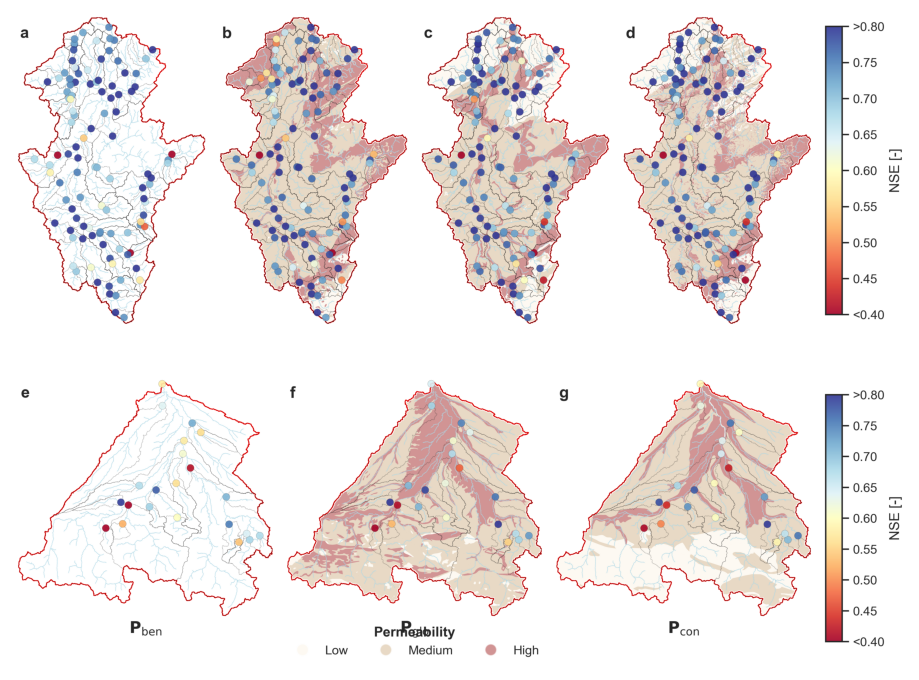

In [63]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Read back as arrays
img_a = plt.imread("../results/figs/figures/fig8a.png")
img_b = plt.imread("../results/figs/figures/fig8b.png")

# Create combined figure
combined_fig = plt.figure(figsize=(9, 7))
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.9], hspace=0.0)

ax1 = combined_fig.add_subplot(gs[0])
ax1.imshow(img_a)
ax1.axis('off')

ax2 = combined_fig.add_subplot(gs[1])
ax2.imshow(img_b)
ax2.axis('off')

# Adjust layout and save combined figure
combined_fig.tight_layout(pad=0)
#combined_fig.savefig("../results/figs/figures/jpgs/fig08.jpg", dpi=500, bbox_inches='tight')

plt.show()

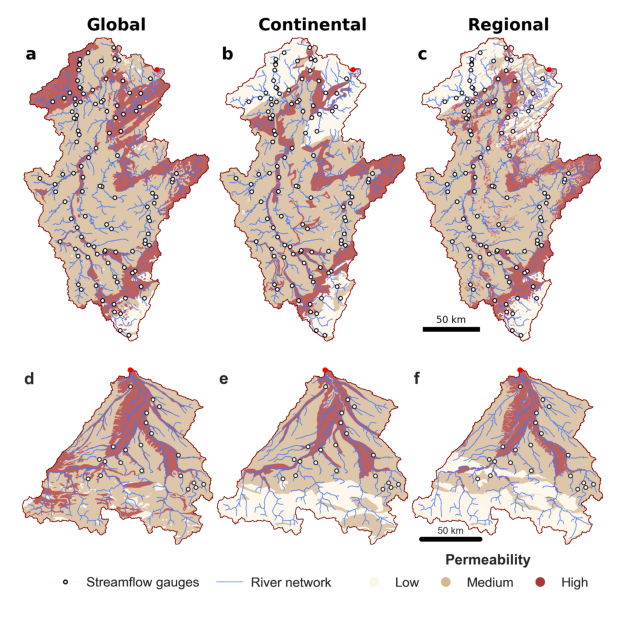

In [64]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Read back as arrays
img_a = plt.imread("../results/figs/figures/fig02a.png")
img_b = plt.imread("../results/figs/figures/fig02b.png")

# Create combined figure
combined_fig = plt.figure(figsize=(7, 6))
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.76], hspace=0.0)

ax1 = combined_fig.add_subplot(gs[0])
ax1.imshow(img_a)
ax1.axis('off')

ax2 = combined_fig.add_subplot(gs[1])
ax2.imshow(img_b)
ax2.axis('off')

# Adjust layout and save combined figure
combined_fig.tight_layout(pad=0)
#combined_fig.savefig("../results/figs/figures/jpgs/fig02.jpg", dpi=500, bbox_inches='tight')

plt.show()

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/2245194782.py:58: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/2245194782.py:64: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/2245194782.py:91: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/2245194782.py:114: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True,


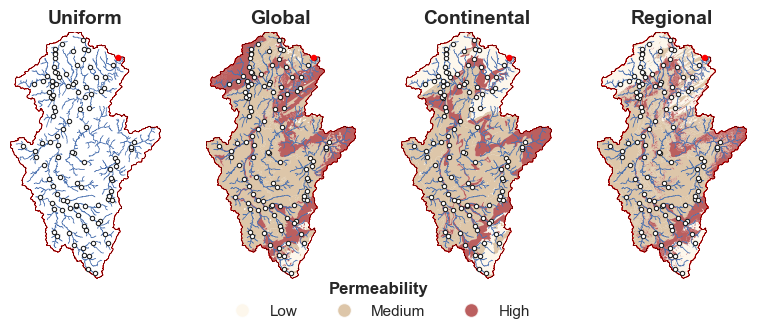

In [65]:
network_estreams_gdf = estreams_attributes_clipped_filters.loc[~estreams_attributes_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index
# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, (ax4, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(8, 3))  # Two subplots side by side

# Select multiple geometries
FR_selected_gdf = moselle.copy()

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set plot limits to the bounding box of the selected study areas
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Plot the first geology shapefile with different colors for each class
GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True, 
                    categorical=True, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax1, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)

# Plot the mask to cover everything outside the study area
#mask.plot(ax=ax1, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)

# Set plot title and labels
ax1.set_xlabel('')
ax1.set_ylabel('')



# Plot the second geology shapefile with different colors for each class
geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True, 
                    categorical=True, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax2, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax2, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)
# Set plot limits to the bounding box of the study area
ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)

# Set plot title and labels
#ax2.set_title('(c)', loc="left")
ax2.set_xlabel('')
ax2.set_ylabel('')
custom_label = ["Low", "Medium-low", "Medium-high", "High"]

# Plot the third geology shapefile with different colors for each class
geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True, 
                    categorical=True, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax3, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax3, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)

# Plot the third geology shapefile with different colors for each class
#geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True, 
#                    categorical=True, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax4, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax4, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax4, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)

# Plot the river
rivers_moselle.plot(ax=ax1, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax2, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax3, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax4, linewidth=0.5, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax3, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# Set plot limits to the bounding box of the study area
ax4.set_xlim(x_min, x_max)
ax4.set_ylim(y_min, y_max)

# Set plot title and labels
#ax3.set_title('(d)', loc="left")

text_to_subplots = ["Global", "Continental", "Regional", "Uniform"]
i = 0 
for ax in [ax1, ax2, ax3, ax4]:

    # Overlay the study area boundaries
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25, label='Sub-catchments')

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    #ax.text(0.45, 1.075, text_to_subplots[i], transform=ax.transAxes, 
    #        fontsize=10, ha='center', va='top', color='black', fontweight='bold')
    ax.set_title(text_to_subplots[i], loc="center", fontsize=14, fontweight="bold")
    i = i + 1

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.75),
    'Medium': to_rgba('tan', 0.75),
    'High': to_rgba('brown', 0.75)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')

# Adjust the layout to remove extra space
plt.tight_layout()

#fig.savefig("../results/figs/figures/fig_geologies_and_muni.png", dpi=300, bbox_inches='tight')

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/1085802270.py:135: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/1085802270.py:144: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='class', ax=ax1, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/1085802270.py:184: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_moselle_dissolved.plot(column='class', ax=ax2, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/1085802270.py:225: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='class', ax=ax3, legend=True,


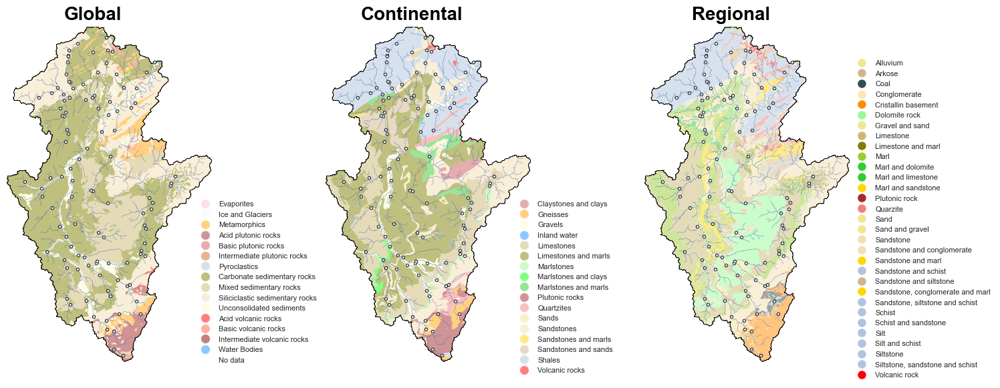

In [66]:
# Set global font properties
plt.rcParams.update({
    #'font.family': 'serif',            # Font family (e.g., 'sans-serif', 'serif', 'monospace')
    'font.size': 8,                  # Default font size
    'axes.titlesize': 8,             # Title font size
    'axes.labelsize': 8,             # Axis label font size
    'xtick.labelsize': 8,            # X-axis tick label font size
    'ytick.labelsize': 8,            # Y-axis tick label font size
    'legend.fontsize': 8,            # Legend font size
    'figure.titlesize': 6  ,          # Figure title font size
    'axes.titleweight': 'regular',        # Make only axis titles bold
    'font.weight': 'regular'           # Regular font for all other text
})

# Select multiple geometries
FR_selected = catchment_boundaries.loc[["DEBU1959"], "geometry"]

# Create a GeoDataFrame from the selected geometries and set the CRS directly
FR_selected_gdf = gpd.GeoDataFrame({'geometry': FR_selected}, crs='EPSG:4326')


# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'ev': "pink",  # Evaporites
    'ig': "ghostwhite",  # Ice and Glaciers
    'mt': "orange",  # Metamorphics
    'pa': "brown",  # Acid plutonic rocks
    'pb': "indianred",  # Basic plutonic rocks
    'pi': "chocolate",  # Intermediate plutonic rocks
    'py': "lightsteelblue",  # Pyroclastics
    'sc': "olive",  # Carbonate sedimentary rocks
    'sm': "y",  # Mixed sedimentary rocks
    'ss': "#F5DEB3",  # Siliciclastic sedimentary rocks
    'su': "#FAFAD2",  # Unconsolidated sediments
    'va': "red",  # Acid volcanic rocks
    'vb': "tomato",  # Basic volcanic rocks
    'vi': "darkred",  # Intermediate volcanic rocks
    'wb': "#1E90FF",  # Water Bodies
    'nd': "white"   # Precambrian rocks
}

# Define the first color mapping for GLiM_dissolved just for the legend (full names)
color_mapping_glim_legend = {
    'Evaporites': "pink",  # Evaporites
    'Ice and Glaciers': "ghostwhite",  # Ice and Glaciers
    'Metamorphics': "orange",  # Metamorphics
    'Acid plutonic rocks': "brown",  # Acid plutonic rocks
    'Basic plutonic rocks': "indianred",  # Basic plutonic rocks
    'Intermediate plutonic rocks': "chocolate",  # Intermediate plutonic rocks
    'Pyroclastics': "lightsteelblue",  # Pyroclastics
    'Carbonate sedimentary rocks': "olive",  # Carbonate sedimentary rocks
    'Mixed sedimentary rocks': "y",  # Mixed sedimentary rocks
    'Siliciclastic sedimentary rocks': "#F5DEB3",  # Siliciclastic sedimentary rocks
    'Unconsolidated sediments': "#FAFAD2",  # Unconsolidated sediments
    'Acid volcanic rocks': "red",  # Acid volcanic rocks
    'Basic volcanic rocks': "tomato",  # Basic volcanic rocks
    'Intermediate volcanic rocks': "darkred",  # Intermediate volcanic rocks
    'Water Bodies': "#1E90FF",  # Water Bodies
    'No data': "white"   # Precambrian rocks
}


# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'Claystones and clays': 'indianred',       # Saddle Brown
    'Gneisses': 'orange',                       # Dim Gray
    'Gravels': '#FAFAD2',                         # Light Yellow
    'Inland water': '#1E90FF',                 # Dodger Blue
    'Limestones': 'y',                       # Light Slate Gray
    'Limestones and marls': 'olive',            # Slate Gray
    'Marlstones': 'palegreen',                   # Pale Green
    'Marlstones and clays': 'lime',         # Dark Olive Green
    'Marlstones and marls': '#32CD32',         # Lime Green
    'Plutonic rocks': 'brown',                 # Black
    'Quartzites': 'lightcoral',                   # Dark Slate Blue
    'Sands': 'khaki',                        # Light Goldenrod Yellow
    'Sandstones': '#F5DEB3',                   # Burlywood
    'Sandstones and marls': 'gold',         # Peru
    'Sandstones and sands': 'tan',         # Wheat
    'Shales': 'lightsteelblue',                       # Dark Slate Gray
    'Volcanic rocks': 'red'                # Dark Red
}

# Corrected color mapping with same colors for classes with the same name
color_mapping_geology_high = {
    'Alluvium': '#F0E68C',                        # Khaki-like, slightly lighter than sand
    'Arkose': '#D2B48C',                          # Tan
    'Coal': '#2F4F4F',                            # Dark Slate Gray (for a coal-like appearance)
    'Conglomerate': '#FFE4B5',                    # Moccasin, similar to gravel
    'Cristallin basement': '#FF8C00',             # Dark Orange, similar to 'Gneisses'
    'Dolomite rock': '#98FB98',                   # PaleGreen
    'Gravel and sand': '#F0E68C',                 # Same as Sand, as they are closely related
    'Limestone': 'y',                             # Yellow, same as before
    'Limestone and marl': 'olive',                # Same as before
    'Marl': '#9ACD32',                            # YellowGreen, similar to PaleGreen but unique
    'Marl and dolomite': '#32CD32',               # LimeGreen, same as before
    'Marl and limestone': '#32CD32',              # Same as Marl and dolomite (same color logic)
    'Marl and sandstone': 'gold',                 # Same as Sandstones and marls
    'Plutonic rock': 'brown',                     # Same as Plutonic rocks
    'Quarzite': 'lightcoral',                     # Same as Quartzites
    'Sand': 'khaki',                              # Same as Sands
    'Sand and gravel': 'khaki',                   # Same as Sand
    'Sandstone': '#F5DEB3',                       # Burlywood, same as Sandstones
    'Sandstone and conglomerate': '#F5DEB3',      # Same as Sandstones (close relationship)
    'Sandstone and marl': 'gold',                 # Same as Sandstones and marls
    'Sandstone and schist': 'lightsteelblue',     # Similar to Shales but distinct
    'Sandstone and siltstone': 'tan',             # Tan-like, similar to Arkose but unique
    'Sandstone, conglomerate and marl': 'gold',   # Same as Sandstones and marls
    'Sandstone, siltstone and schist': 'lightsteelblue',  # Similar to Shales
    'Schist': 'lightsteelblue',                   # Same as Shales (similar behavior)
    'Schist and sandstone': 'lightsteelblue',     # Same as Schist
    'Silt': 'lightsteelblue',                     # Same as Schist and Shales
    'Silt and schist': 'lightsteelblue',          # Same as Schist
    'Siltstone': 'lightsteelblue',                # Same as Schist and Shales
    'Siltstone, sandstone and schist': 'lightsteelblue',  # Same as Schist
    'Volcanic rock': 'red'                        # Dark Red, same as Volcanic rocks
}



# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['class'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['class'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['class'].map(color_mapping_geology_high)

# Set plot limits to the bounding box of the selected study areas
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Plotting
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 8))

# Plot the first geology shapefile with different colors for each class
GLiM_moselle_dissolved.plot(column='class', ax=ax1, legend=True, 
                    categorical=True, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='black', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='black', markersize=10, edgecolor='white', linewidth=0.5, 
                          label='Measurement Points')

# Plot the river
rivers_moselle.plot(ax=ax1, linewidth=0.25, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax1, facecolor='white', edgecolor='black', linewidth=0.5, label='Basins')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Streamflow gauges')


# Set plot limits to the bounding box of the study area
ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)

# Set plot title and labels
ax1.set_title('')
ax1.set_xlabel('')
ax1.set_ylabel('')

# Create custom legend elements with circles for the first plot
geology_legend_elements1 = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, alpha=0.5, 
                                   label=cls) for cls, color in color_mapping_glim_legend.items()]
geology_legend1 = ax1.legend(handles=geology_legend_elements1, title='', 
                             bbox_to_anchor=(0.9, 0.5), frameon=False)

# Add the geological classes legend back to the first plot
#ax1.add_artist(geology_legend1)

# Plot the second geology shapefile with different colors for each class
geology_median_moselle_dissolved.plot(column='class', ax=ax2, legend=True, 
                    categorical=True, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='black', linewidth=0.5, label='')

## Plot the points from network_estreams_filtered
#network_estreams_gdf.plot(ax=ax2, color='black', markersize=10, edgecolor='white', linewidth=0.5, 
#                          label='Measurement Points')


# Plot the river
rivers_moselle.plot(ax=ax2, linewidth=0.25, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax2, facecolor='white', edgecolor='black', linewidth=0.5, label='Basins')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax2, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Streamflow gauges')


# Set plot limits to the bounding box of the study area
ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)

# Set plot title and labels
ax2.set_title('')
ax2.set_xlabel('')
ax2.set_ylabel('')

# Create custom legend elements with circles for the second plot
geology_legend_elements2 = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, alpha=0.5,
                                   label=cls) for cls, color in color_mapping_geology.items()]
geology_legend2 = ax2.legend(handles=geology_legend_elements2, title='', 
                             bbox_to_anchor=(0.9, 0.5), frameon=False)

# Add the geological classes legend back to the second plot
#ax2.add_artist(geology_legend2)
###########################################################################################################
# Plot the THIRD geology shapefile with different colors for each class
geology_high_moselle_dissolved.plot(column='class', ax=ax3, legend=True, 
                    categorical=True, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='black', linewidth=0.5, label='')

## Plot the points from network_estreams_filtered
#network_estreams_gdf.plot(ax=ax2, color='black', markersize=10, edgecolor='white', linewidth=0.5, 
#                          label='Measurement Points')


# Plot the river
rivers_moselle.plot(ax=ax3, linewidth=0.25, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax3, facecolor='white', edgecolor='black', linewidth=0.5, label='Basins')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax3, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Streamflow gauges')

# Set plot limits to the bounding box of the study area
ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# Set plot title and labels
ax3.set_title('')
ax3.set_xlabel('')
ax3.set_ylabel('')

# Create custom legend elements with circles for the second plot
geology_legend_elements3 = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, alpha=1,
                                   label=cls) for cls, color in color_mapping_geology_high.items()]
# Add the legend to the third plot, keeping its current location
geology_legend3 = ax3.legend(handles=geology_legend_elements3, title='', 
                             bbox_to_anchor=(0.99, 0.92), frameon=False)


# Add the geological classes legend back to the second plot
#ax3.add_artist(geology_legend3)


## Extract color mapping information from the color mapping list
#legend_labels = color_mapping_list[variable][2]
#color_mapping = color_mapping_list[variable][3]
#
## Extract color mapping information from the color mapping list
#legend_labels = color_mapping_list[variable][2]
#color_mapping = color_mapping_list[variable][3]

text_to_subplots = ["Global", "Continental", "Regional"]
i = 0 
for ax in [ax1, ax2, ax3]:

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    ax.text(0.42, 1.06, text_to_subplots[i], transform=ax.transAxes, 
            fontsize=20, ha='center', va='top', color='black', fontweight='bold')
    i = i + 1

fig.tight_layout()

#fig.savefig("../results/figs/figures/figs1a.jpg", dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/2037587772.py:165: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/2037587772.py:174: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_garonne_dissolved.plot(column='class', ax=ax1, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/2037587772.py:214: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_garonne_dissolved.plot(column='class', ax=ax2, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_13791/2037587772.py:255: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_garonne_dissolved.plot(column='class', ax=ax3, legend=True,


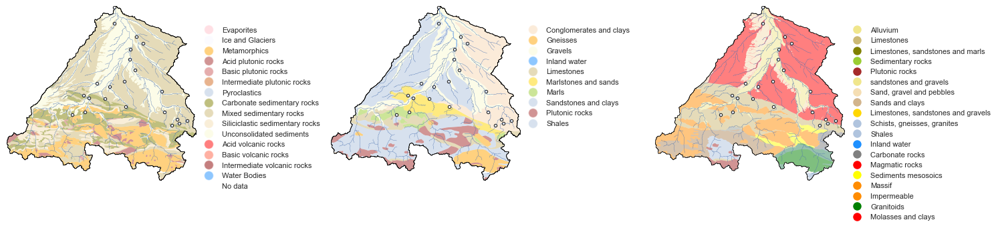

In [67]:
# Set global font properties
plt.rcParams.update({
    #'font.family': 'serif',            # Font family (e.g., 'sans-serif', 'serif', 'monospace')
    'font.size': 8,                  # Default font size
    'axes.titlesize': 8,             # Title font size
    'axes.labelsize': 8,             # Axis label font size
    'xtick.labelsize': 8,            # X-axis tick label font size
    'ytick.labelsize': 8,            # Y-axis tick label font size
    'legend.fontsize': 8,            # Legend font size
    'figure.titlesize': 6  ,          # Figure title font size
    'axes.titleweight': 'regular',        # Make only axis titles bold
    'font.weight': 'regular'           # Regular font for all other text
})

# --------------------------------------------------
# Prepare gauge GeoDataFrame
# --------------------------------------------------
network_estreams_gdf = estreams_attributes_garonne_clipped_filters.loc[
    ~estreams_attributes_garonne_clipped_filters.index.duplicated(keep='first')
].copy()

geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Select multiple geometries
FR_selected = catchment_boundaries.loc[["FR001604"], "geometry"]

# Create a GeoDataFrame from the selected geometries and set the CRS directly
FR_selected_gdf = gpd.GeoDataFrame({'geometry': FR_selected}, crs='EPSG:4326')


# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'ev': "pink",  # Evaporites
    'ig': "ghostwhite",  # Ice and Glaciers
    'mt': "orange",  # Metamorphics
    'pa': "brown",  # Acid plutonic rocks
    'pb': "indianred",  # Basic plutonic rocks
    'pi': "chocolate",  # Intermediate plutonic rocks
    'py': "lightsteelblue",  # Pyroclastics
    'sc': "olive",  # Carbonate sedimentary rocks
    'sm': "y",  # Mixed sedimentary rocks
    'ss': "#F5DEB3",  # Siliciclastic sedimentary rocks
    'su': "#FAFAD2",  # Unconsolidated sediments
    'va': "red",  # Acid volcanic rocks
    'vb': "tomato",  # Basic volcanic rocks
    'vi': "darkred",  # Intermediate volcanic rocks
    'wb': "#1E90FF",  # Water Bodies
    'nd': "white"   # Precambrian rocks
}

# Define the first color mapping for GLiM_dissolved just for the legend (full names)
color_mapping_glim_legend = {
    'Evaporites': "pink",  # Evaporites
    'Ice and Glaciers': "ghostwhite",  # Ice and Glaciers
    'Metamorphics': "orange",  # Metamorphics
    'Acid plutonic rocks': "brown",  # Acid plutonic rocks
    'Basic plutonic rocks': "indianred",  # Basic plutonic rocks
    'Intermediate plutonic rocks': "chocolate",  # Intermediate plutonic rocks
    'Pyroclastics': "lightsteelblue",  # Pyroclastics
    'Carbonate sedimentary rocks': "olive",  # Carbonate sedimentary rocks
    'Mixed sedimentary rocks': "y",  # Mixed sedimentary rocks
    'Siliciclastic sedimentary rocks': "#F5DEB3",  # Siliciclastic sedimentary rocks
    'Unconsolidated sediments': "#FAFAD2",  # Unconsolidated sediments
    'Acid volcanic rocks': "red",  # Acid volcanic rocks
    'Basic volcanic rocks': "tomato",  # Basic volcanic rocks
    'Intermediate volcanic rocks': "darkred",  # Intermediate volcanic rocks
    'Water Bodies': "#1E90FF",  # Water Bodies
    'No data': "white"   # Precambrian rocks
}


# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'Conglomerates and clays': "#F9D8B4",       # Saddle Brown
    'Gneisses': 'orange',                       # Dim Gray
    'Gravels': '#FAFAD2',                         # Light Yellow
    'Inland water': '#1E90FF',                 # Dodger Blue
    'Limestones': 'y',                       # Light Slate Gray
    'Marlstones and sands': 'gold',            # Slate Gray
    'Marls': '#9ACD32',                   # Pale Green
    'Sandstones and clays': 'lightsteelblue',         # Dark Olive Green
    #'Marlstones and marls': '#32CD32',         # Lime Green
    'Plutonic rocks': 'brown',                 # Black
    #'Quartzites': 'lightcoral',                   # Dark Slate Blue
    #'Sands': 'khaki',                        # Light Goldenrod Yellow
    #'Sandstones': '#F5DEB3',                   # Burlywood
    #'Sandstones and marls': 'gold',         # Peru
    #'Sandstones and sands': 'tan',         # Wheat
    'Shales': 'lightsteelblue',                       # Dark Slate Gray
    #'Volcanic rocks': 'red'                # Dark Red
}

#Index(['', , '', '',
#       , , '',
#       , '', ,
#       , '', 'Sedimentary rocks',
#        ''],
#      dtype='object', name='class')


# Corrected color mapping with same colors for classes with the same name
color_mapping_geology_high = {
    'Alluvium': '#F0E68C',                        # Khaki-like, slightly lighter than sand
    #'Arkose': '#D2B48C',                          # Tan
    #'Coal': '#2F4F4F',                            # Dark Slate Gray (for a coal-like appearance)
    #'Conglomerate': '#FFE4B5',                    # Moccasin, similar to gravel
    #'Cristallin basement': '#FF8C00',             # Dark Orange, similar to 'Gneisses'
    #'Dolomite rock': '#98FB98',                   # PaleGreen
    #'Gravel and sand': '#F0E68C',                 # Same as Sand, as they are closely related
    'Limestones': 'y',                             # Yellow, same as before
    'Limestones, sandstones and marls': 'olive',                # Same as before
    'Sedimentary rocks': '#9ACD32',                            # YellowGreen, similar to PaleGreen but unique
    #'Marl and dolomite': '#32CD32',               # LimeGreen, same as before
    #'Marl and limestone': '#32CD32',              # Same as Marl and dolomite (same color logic)
    #'Marl and sandstone': 'gold',                 # Same as Sandstones and marls
    'Plutonic rocks': 'brown',                     # Same as Plutonic rocks
    #'Quarzite': 'lightcoral',                     # Same as Quartzites
    #'Sand': 'khaki',                              # Same as Sands
    'sandstones and gravels': 'khaki',                   # Same as Sand
    #'Sandstone': '#F5DEB3',                       # Burlywood, same as Sandstones
    'Sand, gravel and pebbles': '#F5DEB3',      # Same as Sandstones (close relationship)
    #'Sandstone and marl': 'gold',                 # Same as Sandstones and marls
    #'Sandstone and schist': 'lightsteelblue',     # Similar to Shales but distinct
    'Sands and clays': 'tan',             # Tan-like, similar to Arkose but unique
    'Limestones, sandstones and gravels': 'gold',   # Same as Sandstones and marls
    #'Sandstone, siltstone and schist': 'lightsteelblue',  # Similar to Shales
    'Schists, gneisses, granites': 'lightsteelblue',                   # Same as Shales (similar behavior)
    #'Schist and sandstone': 'lightsteelblue',     # Same as Schist
    #'Silt': 'lightsteelblue',                     # Same as Schist and Shales
    #'Silt and schist': 'lightsteelblue',          # Same as Schist
    #'Siltstone': 'lightsteelblue',                # Same as Schist and Shales
    #'Siltstone, sandstone and schist': 'lightsteelblue',  # Same as Schist
    #'Volcanic rock': 'red'                        # Dark Red, same as Volcanic rocks
    'Shales': 'lightsteelblue',                       # Dark Slate Gray
    'Inland water': '#1E90FF',
    'Carbonate rocks':'gray', 
    'Magmatic rocks':'red', 
    'Sediments mesosoics':'yellow',
    'Massif':'#FF8C00',
    'Impermeable':'#FF8C00',
    'Granitoids':'green',
    'Molasses and clays':'red'

}



# Add a column for colors based on the class

GLiM_garonne_dissolved['color'] = GLiM_garonne_dissolved['class'].map(color_mapping_glim)
geology_median_garonne_dissolved['color'] = geology_median_garonne_dissolved['class'].map(color_mapping_geology)
geology_high_garonne_dissolved['color'] = geology_high_garonne_dissolved['class'].map(color_mapping_geology_high)

# Set plot limits to the bounding box of the selected study areas
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Plotting
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 8))

# Plot the first geology shapefile with different colors for each class
GLiM_garonne_dissolved.plot(column='class', ax=ax1, legend=True, 
                    categorical=True, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='black', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='black', markersize=10, edgecolor='white', linewidth=0.5, 
                          label='Measurement Points')

# Plot the river
rivers_garonne.plot(ax=ax1, linewidth=0.25, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax1, facecolor='white', edgecolor='black', linewidth=0.5, label='Basins')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Streamflow gauges')


# Set plot limits to the bounding box of the study area
ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)

# Set plot title and labels
ax1.set_title('')
ax1.set_xlabel('')
ax1.set_ylabel('')

# Create custom legend elements with circles for the first plot
geology_legend_elements1 = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, alpha=0.5, 
                                   label=cls) for cls, color in color_mapping_glim_legend.items()]
geology_legend1 = ax1.legend(handles=geology_legend_elements1, title='', 
                             bbox_to_anchor=(0.99, 0.92), frameon=False)

# Add the geological classes legend back to the first plot
#ax1.add_artist(geology_legend1)

# Plot the second geology shapefile with different colors for each class
geology_median_garonne_dissolved.plot(column='class', ax=ax2, legend=True, 
                    categorical=True, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='black', linewidth=0.5, label='')

## Plot the points from network_estreams_filtered
#network_estreams_gdf.plot(ax=ax2, color='black', markersize=10, edgecolor='white', linewidth=0.5, 
#                          label='Measurement Points')


# Plot the river
rivers_garonne.plot(ax=ax2, linewidth=0.25, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax2, facecolor='white', edgecolor='black', linewidth=0.5, label='Basins')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax2, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Streamflow gauges')


# Set plot limits to the bounding box of the study area
ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)

# Set plot title and labels
ax2.set_title('')
ax2.set_xlabel('')
ax2.set_ylabel('')

# Create custom legend elements with circles for the second plot
geology_legend_elements2 = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, alpha=0.5,
                                   label=cls) for cls, color in color_mapping_geology.items()]
geology_legend2 = ax2.legend(handles=geology_legend_elements2, title='', 
                             bbox_to_anchor=(0.99, 0.92), frameon=False)

# Add the geological classes legend back to the second plot
#ax2.add_artist(geology_legend2)
###########################################################################################################
# Plot the THIRD geology shapefile with different colors for each class
geology_high_garonne_dissolved.plot(column='class', ax=ax3, legend=True, 
                    categorical=True, color=geology_high_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='black', linewidth=0.5, label='')

## Plot the points from network_estreams_filtered
#network_estreams_gdf.plot(ax=ax2, color='black', markersize=10, edgecolor='white', linewidth=0.5, 
#                          label='Measurement Points')


# Plot the river
rivers_garonne.plot(ax=ax3, linewidth=0.25, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax3, facecolor='white', edgecolor='black', linewidth=0.4, label='Basins')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax3, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Streamflow gauges')

# Set plot limits to the bounding box of the study area
ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# Set plot title and labels
ax3.set_title('')
ax3.set_xlabel('')
ax3.set_ylabel('')

# Create custom legend elements with circles for the second plot
geology_legend_elements3 = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, alpha=1,
                                   label=cls) for cls, color in color_mapping_geology_high.items()]
# Add the legend to the third plot, keeping its current location
geology_legend3 = ax3.legend(handles=geology_legend_elements3, title='', 
                             bbox_to_anchor=(0.99, 0.92), frameon=False)

text_to_subplots = ["Global", "Continental", "Regional"]
i = 0 
for ax in [ax1, ax2, ax3]:

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    #ax.text(0.42, 1.06, text_to_subplots[i], transform=ax.transAxes, 
    #        fontsize=20, ha='center', va='top', color='black', fontweight='bold')
    i = i + 1

fig.tight_layout()

#fig.savefig("../results/figs/figures/figs1b.jpg", dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

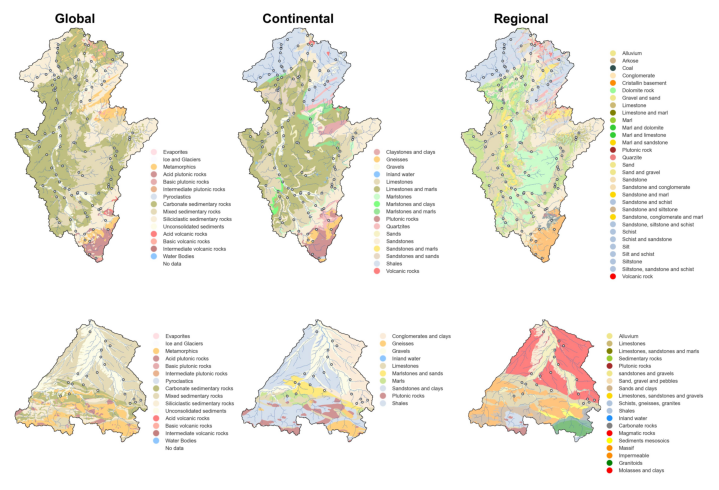

In [69]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Read back as arrays
img_a = plt.imread("../results/figs/figures/figs1a.jpg")
img_b = plt.imread("../results/figs/figures/figs1b.jpg")

# Create combined figure
combined_fig = plt.figure(figsize=(7, 5))
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.8], hspace=0.0)

ax1 = combined_fig.add_subplot(gs[0])
ax1.imshow(img_a)
ax1.axis('off')

ax2 = combined_fig.add_subplot(gs[1])
ax2.imshow(img_b)
ax2.axis('off')

# Adjust layout and save combined figure
combined_fig.tight_layout(pad=0)
#combined_fig.savefig("../results/figs/figures/figs1.jpg", dpi=500, bbox_inches='tight')

plt.show()

### Correlations with some attributes

In [70]:
data_diff_val_complete_dict_plot_garonne[data_diff_val_complete_dict_plot_garonne.nse_r1comp<0.5].index.tolist()

['FR001545', 'FR004091']

In [71]:
data_diff_val_complete_dict_plot_garonne["root_dep_mean"] = network_estreams_garonne_22_gauges["root_dep_mean"]
data_diff_val_complete_dict_plot["area_estreams"] = network_estreams_moselle_108_gauges["area_estreams"]

In [72]:
data_diff_val_complete_dict_plot_garonne.corr(method="spearman")

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,root_dep_mean
nse_nogeo,1.000000,0.968379,0.962733,0.858837,0.964992,0.557312
nse_g1comp,0.968379,1.000000,0.954828,0.905138,0.978543,0.682665
nse_c1comp,0.962733,0.954828,1.000000,0.875776,0.950311,0.543761
nse_r1comp,0.858837,0.905138,0.875776,1.000000,0.863354,0.632976
nse_rand,0.964992,0.978543,0.950311,0.863354,1.000000,0.653303
root_dep_mean,0.557312,0.682665,0.543761,0.632976,0.653303,1.000000


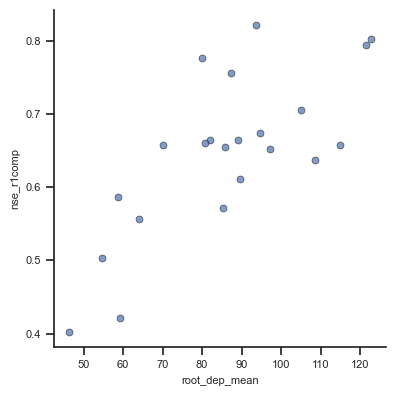

In [73]:
# Example variable names — CHANGE THESE
x_var = "root_dep_mean"
y_var = "nse_r1comp"

fig, ax = plt.subplots(figsize=(4, 4))

ax.scatter(
    data_diff_val_complete_dict_plot_garonne[x_var],
    data_diff_val_complete_dict_plot_garonne[y_var],
    s=25,
    edgecolor="k",
    linewidth=0.5,
    alpha=0.7
)

ax.set_xlabel(x_var)
ax.set_ylabel(y_var)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig("../results/figs/figures/S15_fig_scatterroot_nse.png", dpi=300, bbox_inches='tight')

plt.show()

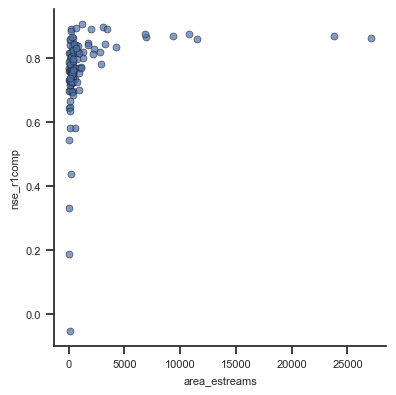

In [74]:
# Example variable names — CHANGE THESE
x_var = "area_estreams"
y_var = "nse_r1comp"

fig, ax = plt.subplots(figsize=(4, 4))

ax.scatter(
    data_diff_val_complete_dict_plot[x_var],
    data_diff_val_complete_dict_plot[y_var],
    s=25,
    edgecolor="k",
    linewidth=0.5,
    alpha=0.7
)

ax.set_xlabel(x_var)
ax.set_ylabel(y_var)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
#plt.savefig("../results/figs/figures/S15_fig_scatter_area_nse.png", dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

### Catchments with the lowest performance

#### Some analysis

In [19]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp<0.5][["nse_r1comp", "nse_nogeo"]]


,nse_r1comp,nse_nogeo
FR000183,0.488465,0.381274
FR000185,0.263676,0.356058
FR000144,0.235977,-0.214744
FR003280,0.402323,0.531344
DERP2013,0.443957,-0.506631
FR003259,0.272996,0.323611
FR003250,0.181581,0.382867


In [20]:
estreams_attributes.loc[["FR000183","FR000185", "FR000144", "FR003280", "DERP2013", "FR003259", "FR003250"], ["frac_snow", "sno_cov_mean", "root_dep_mean",'soil_fra_sand_mean',
       'soil_fra_silt_mean', 'soil_fra_clay_mean', 'soil_fra_grav_mean', "bedrk_dep", "hfd_mean"]]

,frac_snow,sno_cov_mean,root_dep_mean,soil_fra_sand_mean,soil_fra_silt_mean,soil_fra_clay_mean,soil_fra_grav_mean,bedrk_dep,hfd_mean
basin_id,,,,,,,,,
FR000183,0.042,5.440,93.143,71.914,16.614,11.471,7.014,0.887,152.760
FR000185,0.043,5.536,92.353,68.257,18.866,12.877,7.235,0.912,145.097
FR000144,0.047,7.244,79.831,76.475,15.559,7.966,5.483,0.917,172.085
FR003280,0.036,2.491,103.243,30.568,33.054,36.378,8.878,1.248,148.667
DERP2013,0.039,3.575,116.881,39.495,35.219,25.285,9.293,1.017,166.582
FR003259,0.041,3.622,128.125,51.312,24.641,24.047,6.672,1.009,136.647
FR003250,0.075,11.555,89.701,73.896,16.537,9.567,7.597,0.802,156.082


In [21]:
estreams_attributes_clipped_filters.bedrk_dep.describe()

count    112.000000
mean       1.269929
std        0.543463
min        0.691000
25%        1.024250
50%        1.111500
75%        1.247250
max        4.694000
Name: bedrk_dep, dtype: float64

In [22]:
estreams_attributes_clipped_filters.sno_cov_mean.describe()

count    112.000000
mean       4.879259
std        2.027789
min        2.060000
25%        3.188000
50%        4.614000
75%        6.350000
max       11.555000
Name: sno_cov_mean, dtype: float64

In [23]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp<0.55][["nse_r1comp","nse_g1comp", "nse_nogeo", "bfi_obs", "bfi_r1comp"]]

,nse_r1comp,nse_g1comp,nse_nogeo,bfi_obs,bfi_r1comp
FR000183,0.488465,0.468859,0.381274,0.740801,0.729413
FR000185,0.263676,0.308589,0.356058,0.537419,0.762668
FR000144,0.235977,0.165087,-0.214744,0.698369,0.801613
FR003280,0.402323,0.422430,0.531344,0.665425,0.498500
DERP2013,0.443957,0.348807,-0.506631,0.816544,0.801445
FR003259,0.272996,0.343248,0.323611,0.576604,0.726737
FR003250,0.181581,0.311894,0.382867,0.685264,0.535945


In [24]:
len(data_diff_val_complete[data_diff_val_complete.nse_r1comp>0.5])/108

0.9351851851851852

In [25]:
estreams_attributes_clipped_filters.loc[["DERP2013", "FR003280", "FR003250", "FR000185", "FR003259"]][["root_dep_mean", "perm_low_regi", "perm_high_regi", "perm_high_glob2", "perm_low_glob2"]]

,root_dep_mean,perm_low_regi,perm_high_regi,perm_high_glob2,perm_low_glob2
basin_id,,,,,
DERP2013,116.881,0.0,91.0,92.0,0.0
FR003280,103.243,0.0,0.0,0.0,0.0
FR003250,89.701,96.0,4.0,0.0,94.0
FR000185,92.353,2.0,75.0,71.0,2.0
FR003259,128.125,0.0,66.0,35.0,0.0


In [26]:
network_estreams.loc[data_diff_val_complete[data_diff_val_complete.nse_r1comp<0.5].index.tolist()]


,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,num_continuous_days,num_days_gaps,num_days_reliable,num_days_noflag,num_days_suspect,gauge_flag,duplicated_suspect,watershed_group,gauges_upstream,nested_catchments
basin_id,,,,,,,,,,,,,,,,,,,,,
FR000183,A900105050,A9001050,FR,FR_EAUFRANCE,La Sarre à Laneuveville-lès-Lorquin,7.008689,48.654579,7.008689,48.654579,268,...,5322,399.0,19568.0,62.0,120.0,A,NaN,1,1,[FR000183]
FR000185,A902101060,A9021050,FR,FR_EAUFRANCE,La Sarre à Hermelange,7.014472,48.680322,7.014472,48.680322,258,...,4108,1711.0,13759.0,0.0,22.0,D,[FR003292],1,3,"[FR000183, FR000184, FR000185]"
FR000144,A623201001,A6232010,FR,FR_EAUFRANCE,La Plaine à Raon-l'Étape [La Trouche],6.877879,48.416320,6.877879,48.416320,290,...,11494,179.0,19423.0,0.0,29.0,A,NaN,1,1,[FR000144]
FR003280,A832201001,Le Woigot Ã Briey,FR,FR_EAUFRANCE,Le Woigot à Briey,5.933378,49.246953,5.933378,49.246953,204,...,15790,39.0,19517.0,818.0,188.0,B,NaN,1,3,"[FR003278, FR003279, FR003280]"
DERP2013,2642030800,Contwig,DE,DE_RP,Schwarzbach,7.419000,49.254000,7.419000,49.254000,NaN,...,24532,101.0,0.0,25162.0,0.0,B,NaN,1,1,[DERP2013]
FR003259,A664031002,L'ArentÃƒÂ¨le ÃƒÂ Saint-Gorgon et ÃƒÂ Sainte...,FR,FR_EAUFRANCE,L'Arentèle à Saint-Gorgon et à Sainte-Hélène,6.645964,48.324169,6.645964,48.324169,295,...,4268,64.0,6737.0,0.0,275.0,A,NaN,1,2,"[FR000152, FR003259]"
FR003250,A600101001,La Meurthe Ã Fraize,FR,FR_EAUFRANCE,La Meurthe à Fraize,7.002529,48.184730,7.002529,48.184730,498,...,7524,192.0,18280.0,0.0,606.0,A,NaN,1,1,[FR003250]


#### Plot of the hydrographs

In [676]:
# Base directory and group names
base_dir = Path("../results/sim/space-time")
group_names = [f"Group_{i}" for i in range(1, 8)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.median(dim="group")

In [678]:
# Base directory and group names
base_dir = Path("../results/sim_garonne/space-time")
group_names = [f"Group_{i}" for i in range(1, 3)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean_garonne = combined.median(dim="group")

In [94]:
data_diff_val_complete[0:10]

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,hfd_obs,...,slope_obs,slope_r1comp,slope_c1comp,slope_g1comp,slope_nogeo,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo
LU000018,0.623167,0.656544,0.515473,0.661654,0.552706,0.663353,0.800025,0.541536,0.654113,127.166667,...,2.305895,1.731172,1.142526,2.655898,1.937037,0.895844,0.699256,0.701622,0.703222,0.690309
LU000010,0.736587,0.694558,0.689694,0.781961,0.622472,0.666757,0.776345,0.536320,0.646960,130.500000,...,1.430667,1.722703,1.231856,2.760369,1.960620,0.926464,0.799266,0.799395,0.796793,0.787888
LU000001,0.822228,0.631810,0.877058,0.875687,0.549832,0.525752,0.569345,0.787654,0.638234,121.500000,...,3.860265,3.673564,3.158744,1.279501,1.798806,1.192096,1.075056,1.055832,1.081987,1.060214
DERP2028,0.824758,0.748662,0.629006,0.706292,0.592346,0.768685,0.808396,0.741989,0.641671,131.360000,...,2.249432,1.594274,1.417228,1.624455,2.024797,1.076659,0.981786,0.977432,0.980678,0.979753
FR000183,0.381274,0.468859,0.468789,0.488465,0.740801,0.729413,0.725957,0.711384,0.639381,143.640000,...,2.204864,1.492491,1.475270,1.692929,1.940255,1.358760,1.117682,1.105955,1.110896,1.112764
DERP2008,0.725419,0.816535,0.784371,0.803070,0.463799,0.541792,0.589410,0.533013,0.644855,120.320000,...,3.553243,3.889546,3.316604,2.764790,2.085375,1.047299,1.030159,1.019865,1.013702,1.011802
FR000137,0.749384,0.804027,0.798259,0.805258,0.513152,0.545543,0.567894,0.525656,0.640952,120.520000,...,2.966331,2.713732,2.623395,2.969173,2.057411,0.995667,0.980845,0.980867,0.985966,0.983133
FR003294,0.655522,0.688224,0.680527,0.687140,0.526730,0.525945,0.549793,0.533317,0.649204,118.320000,...,2.515494,2.971062,2.845283,2.869261,2.121811,0.914831,0.772318,0.773103,0.777816,0.778285
FR000185,0.356058,0.308589,0.254690,0.263676,0.537419,0.762668,0.760217,0.729550,0.631692,139.428571,...,3.200160,1.292625,1.255738,1.479305,1.903427,0.799352,1.184124,1.167569,1.181095,1.194112
FR000154,0.740449,0.748546,0.752649,0.744467,0.546750,0.539594,0.573422,0.539525,0.651190,128.480000,...,1.965744,2.929959,2.718527,2.941249,2.092886,0.863725,0.699526,0.702685,0.707107,0.700384


In [95]:
data_diff_val_complete[["bfi_obs", "bfi_nogeo", "bfi_r1comp", "nse_r1comp"]][-20:]

,bfi_obs,bfi_nogeo,bfi_r1comp,nse_r1comp
FR003257,0.524937,0.646410,0.625163,0.812415
FR003296,0.544513,0.643966,0.634810,0.787751
FR000171,0.527469,0.653833,0.552552,0.793622
FR000140,0.570017,0.626647,0.600939,0.885177
DEBU1956,0.602919,0.641835,0.614062,0.855106
LU000002,0.576345,0.654732,0.608045,0.772331
LU000016,0.568219,0.658629,0.579306,0.694848
FR003250,0.685264,0.628615,0.535945,0.181581
FR000132,0.658858,0.612957,0.652564,0.712411
FR003254,0.756521,0.650467,0.726529,0.586972


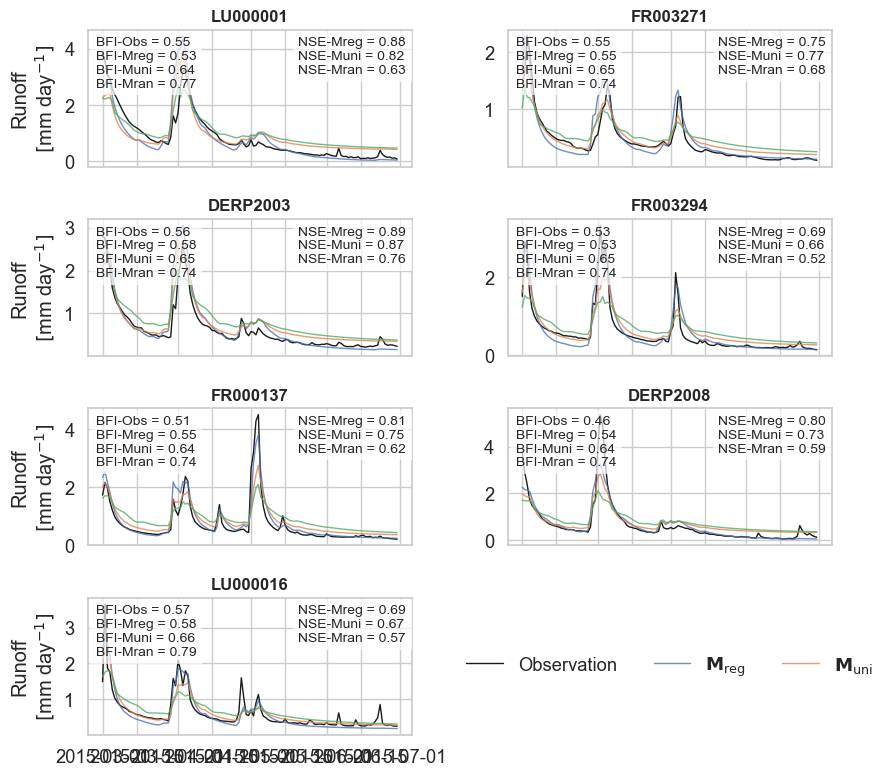

In [46]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["LU000001", "FR003271", "DERP2003", "FR003294", "FR000137", "DERP2008", "LU000016"]  # Your 6 gauge IDs
start_date = "2015-03-01"
end_date = "2015-06-30"

# Create subplots (2 columns × 3 rows)
fig, axes = plt.subplots(4, 2, figsize=(9, 8), sharex=True)
axes = axes.flatten()  # Flatten to easily loop

# Plot each hydrograph
for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]
    
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    # Plot observation and regional simulation
    ax.plot(ts.date, ts["observation"], label="Observation", linewidth=1.0, color="k")
    ax.plot(ts.date, ts["regional"], label="Regional", linewidth=1.0, alpha=0.8)
    ax.plot(ts.date, ts["nogeology"], label="No geology", linewidth=1.0, alpha=0.8)
    ax.plot(ts.date, ts["random"], label="Random", linewidth=1.0, alpha=0.8)

    ax.set_title(f"{gauge_id}", fontsize=12, fontweight="bold")
    #ax.set_ylim(0, 20)
    ax.grid(True)

    if i % 2 == 0:  # Left column
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # Get NSE value (rounded for display)
    nse1 = data_diff_val_complete.loc[gauge_id, "nse_r1comp"]
    nse2 = data_diff_val_complete.loc[gauge_id, "nse_nogeo"]
    nse3 = data_diff_val_complete.loc[gauge_id, "nse_rand"]

    bfi_obs = data_diff_val_complete.loc[gauge_id, "bfi_obs"]
    bfi_nogeo = data_diff_val_complete.loc[gauge_id, "bfi_nogeo"]
    bfi_r1comp = data_diff_val_complete.loc[gauge_id, "bfi_r1comp"]
    bfi_rand = data_diff_val_complete.loc[gauge_id, "bfi_rand"]

    nse_label = f"NSE-Mreg = {nse1:.2f}\nNSE-Muni = {nse2:.2f}\nNSE-Mran = {nse3:.2f}"
    bfi_label = f"BFI-Obs = {bfi_obs:.2f}\nBFI-Mreg = {bfi_r1comp:.2f}\nBFI-Muni = {bfi_nogeo:.2f}\nBFI-Mran = {bfi_rand:.2f}"

    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.65, 0.95, nse_label,
        transform=ax.transAxes,
        ha='left', va='top',
        fontsize=10,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.025, 0.95, bfi_label,
        transform=ax.transAxes,
        ha='left', va='top',
        fontsize=10,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    #if i == 5:
    #    ax.set_xticklabels(["1990", "1992", "1994", "1996", "1998", "2000"])

plt.tight_layout(rect=[0, 0, 1, 1])  # Leave space for legend

# Use last subplot for legend
legend_ax = axes[-1]
legend_ax.axis("off")

# Custom legend
handles, labels = axes[0].get_legend_handles_labels()
labels = ["Observation", r"$\mathbf{M_{\mathrm{reg}}}$", r"$\mathbf{M_{\mathrm{uni}}}$"]

legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=3
)

# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/SI_hydrographs_MregMuni.png",
    dpi=300,
    bbox_inches='tight'
)

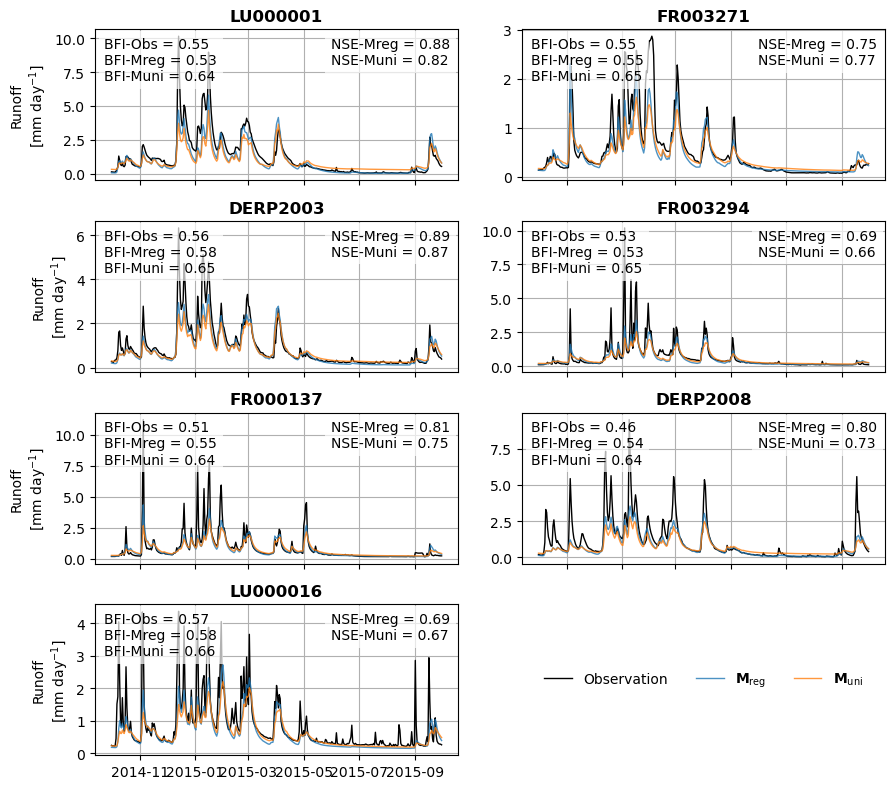

In [99]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["LU000001", "FR003271", "DERP2003", "FR003294", "FR000137", "DERP2008", "LU000016"]  # Your 6 gauge IDs
start_date = "2014-10-01"
end_date = "2015-09-30"

# Create subplots (2 columns × 3 rows)
fig, axes = plt.subplots(4, 2, figsize=(9, 8), sharex=True)
axes = axes.flatten()  # Flatten to easily loop

# Plot each hydrograph
for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]
    
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    # Plot observation and regional simulation
    ax.plot(ts.date, ts["observation"], label="Observation", linewidth=1.0, color="k")
    ax.plot(ts.date, ts["regional"], label="Regional", linewidth=1.0, alpha=0.8)
    ax.plot(ts.date, ts["nogeology"], label="No geology", linewidth=1.0, alpha=0.8)

    ax.set_title(f"{gauge_id}", fontsize=12, fontweight="bold")
    #ax.set_ylim(0, 20)
    ax.grid(True)

    if i % 2 == 0:  # Left column
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # Get NSE value (rounded for display)
    nse1 = data_diff_val_complete.loc[gauge_id, "nse_r1comp"]
    nse2 = data_diff_val_complete.loc[gauge_id, "nse_nogeo"]
    
    bfi_obs = data_diff_val_complete.loc[gauge_id, "bfi_obs"]
    bfi_nogeo = data_diff_val_complete.loc[gauge_id, "bfi_nogeo"]
    bfi_r1comp = data_diff_val_complete.loc[gauge_id, "bfi_r1comp"]

    nse_label = f"NSE-Mreg = {nse1:.2f}\nNSE-Muni = {nse2:.2f}"
    bfi_label = f"BFI-Obs = {bfi_obs:.2f}\nBFI-Mreg = {bfi_r1comp:.2f}\nBFI-Muni = {bfi_nogeo:.2f}"

    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.65, 0.95, nse_label,
        transform=ax.transAxes,
        ha='left', va='top',
        fontsize=10,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.025, 0.95, bfi_label,
        transform=ax.transAxes,
        ha='left', va='top',
        fontsize=10,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    #if i == 5:
    #    ax.set_xticklabels(["1990", "1992", "1994", "1996", "1998", "2000"])

plt.tight_layout(rect=[0, 0, 1, 1])  # Leave space for legend

# Use last subplot for legend
legend_ax = axes[-1]
legend_ax.axis("off")

# Custom legend
handles, labels = axes[0].get_legend_handles_labels()
labels = ["Observation", r"$\mathbf{M_{\mathrm{reg}}}$", r"$\mathbf{M_{\mathrm{uni}}}$"]

legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=3
)

# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/SI_hydrographs_MregMuni.png",
    dpi=300,
    bbox_inches='tight'
)

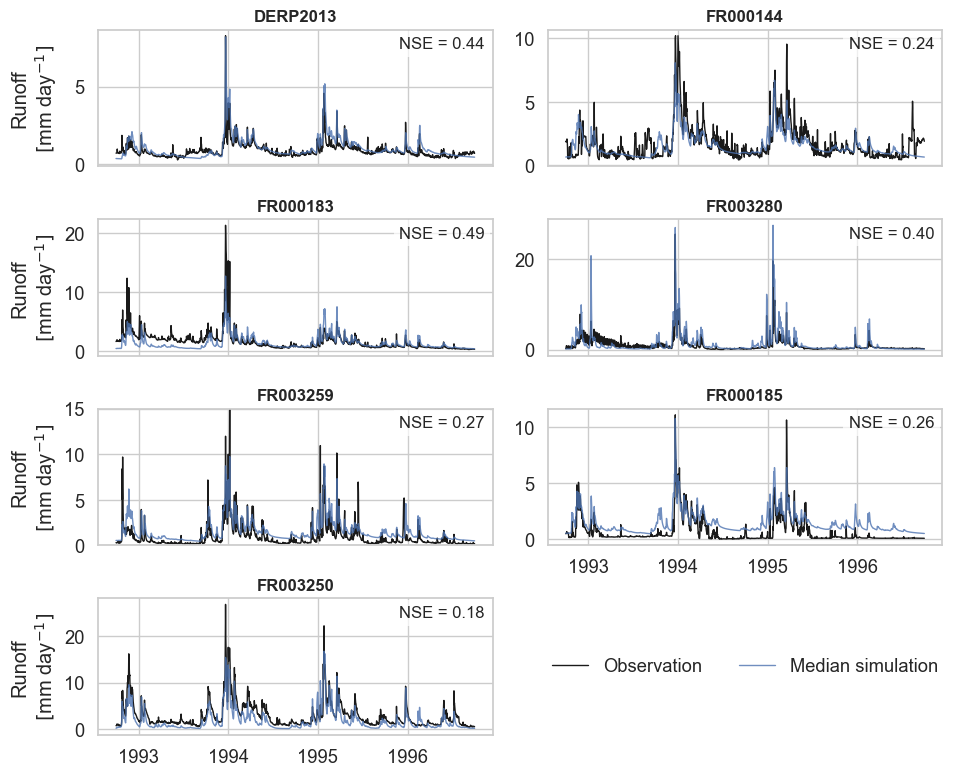

In [154]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["DERP2013", "FR000144", "FR000183", "FR003280", "FR003259", "FR000185","FR003250"]  # Your 6 gauge IDs
start_date = "1992-10-01"
end_date = "1996-09-30"

# Create subplots (2 columns × 3 rows)
fig, axes = plt.subplots(4, 2, figsize=(10, 8), sharex=True)
axes = axes.flatten()  # Flatten to easily loop

# Plot each hydrograph
for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]
    
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    # Plot observation and regional simulation
    ax.plot(ts.date, ts["observation"], label="Observation", linewidth=1.0, color="k")
    ax.plot(ts.date, ts["regional"], label="Regional", linewidth=1.0, alpha=0.8)
    
    ax.set_title(f"{gauge_id}", fontsize=12, fontweight="bold")
    #ax.set_ylim(0, 20)
    ax.grid(True)

    if i % 2 == 0:  # Left column
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # Get NSE value (rounded for display)
    nse = data_diff_val_complete.loc[gauge_id, "nse_r1comp"]
    nse_label = f"NSE = {nse:.2f}"
    
    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.98, 0.95, nse_label,
        transform=ax.transAxes,
        ha='right', va='top',
        fontsize=12,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    #if i == 5:
    #    ax.set_xticklabels(["1990", "1992", "1994", "1996", "1998", "2000"])



#axes[0].set_ylim(0, 10)
#axes[1].set_ylim(0, 10)
axes[4].set_ylim(0, 15)


main_titles = [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

# Use last subplot for legend
legend_ax = axes[-1]
legend_ax.axis("off")

# Custom legend
handles, labels = axes[0].get_legend_handles_labels()
labels = ["Observation", r"Median simulation"]

legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=3
)

import matplotlib.dates as mdates

# Set x-axis ticks to years
for ax in axes[:-1]:  # Skip last subplot used for legend
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

axes[5].tick_params(labelbottom=True)  # Force x-tick labels visible


fig.align_ylabels(axes)

plt.tight_layout(rect=[0, 0, 1, 1])  # Leave space for legend


# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/hydrographs_badNSE.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

In [89]:
# Moselle
# Base directory and group names
base_dir = Path("../results/sim_moselle/space-time")
group_names = [f"Group_{i}" for i in range(1, 8)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

In [90]:
# Garonne
# Base directory and group names
base_dir = Path("../results/sim_garonne/space-time")
group_names = [f"Group_{i}" for i in range(1, 3)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean_garonne = combined.mean(dim="group")

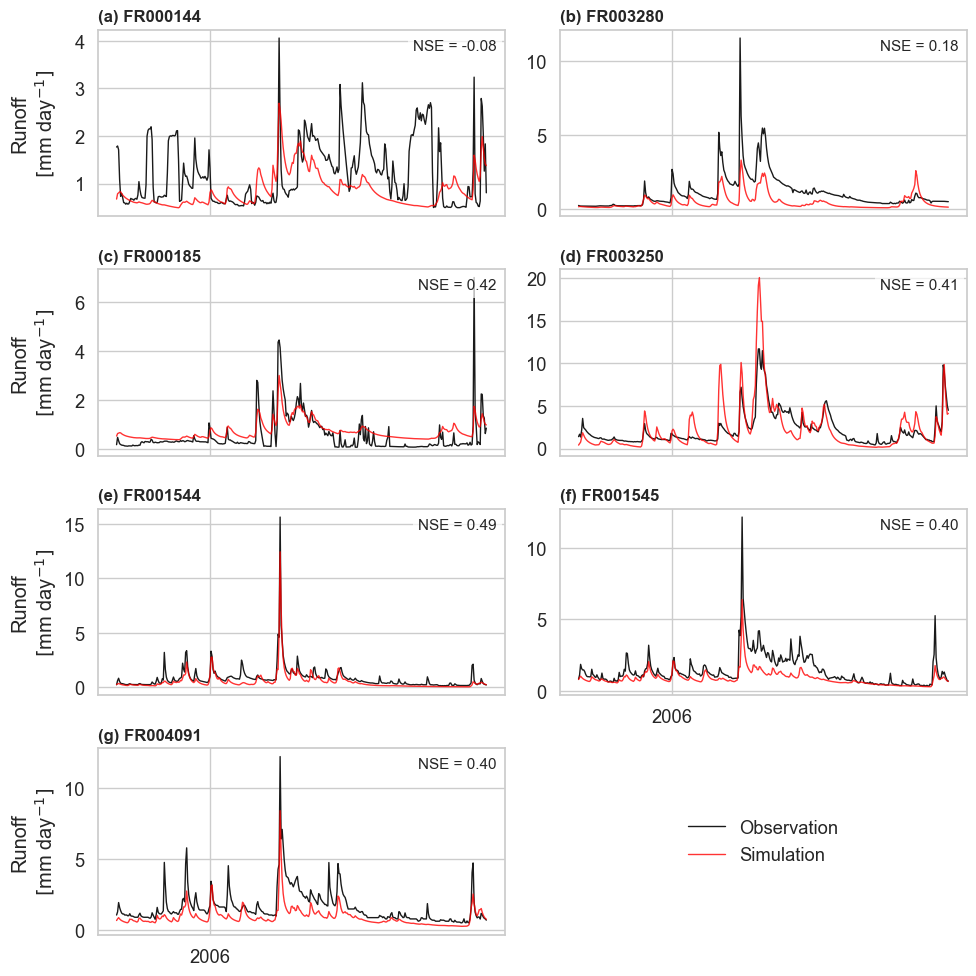

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ------------------------------------------------------------
# PARAMETERS
# ------------------------------------------------------------

gauges_main = ["FR000144", "FR003280", "FR000185", "FR003250"]
gauges_garonne = ["FR001544", "FR001545", "FR004091"]

gauge_ids = gauges_main + gauges_garonne

start_date = "2005-10-01"
end_date   = "2006-09-30"

n_gauges = len(gauge_ids)
titles = ["a", "b", "c", "d", "e", "f", "g"]
# ------------------------------------------------------------
# CREATE SUBPLOTS (4 × 2 = 8 slots)
# ------------------------------------------------------------

fig, axes = plt.subplots(4, 2, figsize=(10, 10), sharex=True)
axes = axes.flatten()

# ------------------------------------------------------------
# PLOT HYDROGRAPHS
# ------------------------------------------------------------

for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]

    # Select correct dataset
    if gauge_id in gauges_main:
        ds_plot = ds_mean
        data_diff_val_complete_plot = data_diff_val_complete.copy()
        ts = ds_plot.sel(
            gauge_id=gauge_id,
            date=slice(start_date, end_date)
        )

        ax.plot(ts.date, ts["observation"], color="k", linewidth=1.0, label="Observation")
        ax.plot(ts.date, ts["regional"], color="red", linewidth=1.0, alpha=0.8, label="Simulation")

    else:
        ds_plot = ds_mean_garonne
        data_diff_val_complete_plot = data_diff_val_complete_garonne.copy()
        ts = ds_plot.sel(
            gauge_id=gauge_id,
            date=slice(start_date, end_date)
        )

        ax.plot(ts.date, ts["observation"], color="k", linewidth=1.0, label="Observation")
        ax.plot(ts.date, ts["regional"], color="red", linewidth=1.0, alpha=0.8, label="Simulation")




    title_complete = f"({titles[i]}) {gauge_id}"
    ax.set_title(title_complete, fontsize=12, fontweight="bold", loc="left")
    ax.grid(True)

    if i % 2 == 0:
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # NSE annotation
    nse = data_diff_val_complete_plot.loc[gauge_id, "nse_r1comp"]
    ax.text(
        0.98, 0.95, f"NSE = {nse:.2f}",
        transform=ax.transAxes,
        ha="right", va="top",
        fontsize=11,
        bbox=dict(facecolor="white", edgecolor="none", alpha=0.7)
    )

# ------------------------------------------------------------
# X-AXIS FORMATTING
# ------------------------------------------------------------

for ax in axes[:n_gauges]:
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

for ax in axes[-3:]:
    ax.tick_params(labelbottom=True)

# ------------------------------------------------------------
# LEGEND IN LAST PANEL
# ------------------------------------------------------------

legend_ax = axes[n_gauges]
legend_ax.axis("off")

handles, labels = axes[0].get_legend_handles_labels()
legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=1
)

# ------------------------------------------------------------
# TURN OFF UNUSED AXES
# ------------------------------------------------------------

for j in range(n_gauges + 1, len(axes)):
    axes[j].axis("off")

fig.align_ylabels(axes)
plt.tight_layout()

# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

plt.savefig(
    "../results/figs/figures/S15.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()


In [51]:
estreams_garonne_and_moselle_130_gauges_with_permeability_variants_and_lakes = pd.read_csv("/Users/nascimth/Library/CloudStorage/OneDrive-Eawag/Eawag/Papers/Moselle_superflexpy/GitHub/estreams_superflexpy/data/estreams_garonne_and_moselle_130_gauges_with_permeability_variants_and_lakes.csv", index_col=0)

### Catchments with the highest performance

In [377]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp>0.88][["nse_r1comp","nse_c1comp", "nse_g1comp", "nse_nogeo", "bfi_obs", "bfi_r1comp"]]

,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo,bfi_obs,bfi_r1comp
LU000001,0.884523,0.881554,0.649280,0.818454,0.549832,0.541392
FR003249,0.892924,0.891078,0.884859,0.866954,0.581528,0.602991
FR000128,0.884267,0.880618,0.832449,0.826265,0.526895,0.551680
FR003241,0.886049,0.884207,0.866354,0.853902,0.575086,0.600708
FR003265,0.900366,0.899369,0.897081,0.891996,0.605153,0.632555
DEBU1957,0.889051,0.888017,0.889836,0.882486,0.607290,0.629697
FR003237,0.899046,0.896788,0.879130,0.867927,0.583372,0.596317
FR000140,0.884409,0.883873,0.872127,0.858613,0.570017,0.604185
DERP2003,0.890121,0.889400,0.851956,0.874557,0.560047,0.582378


In [69]:
data_diff_val_complete.loc[['DERP2011', 'DERP2013', 'DERP2027', 'FR000184', 'FR000201', 'FR003250']]

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,hfd_obs,...,slope_obs,slope_r1comp,slope_c1comp,slope_g1comp,slope_nogeo,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo
DERP2011,0.796410,0.830064,0.793363,0.818362,0.562614,0.622298,0.659665,0.595894,0.649066,129.92,...,2.012416,2.252475,2.073676,2.225895,2.063100,0.851127,0.977919,0.980737,0.980479,0.972921
DERP2013,-0.454676,0.336643,0.571146,0.500465,0.816544,0.807227,0.819108,0.771225,0.647853,160.76,...,0.958338,1.386901,1.301790,1.555445,2.118597,0.762804,0.819871,0.821231,0.823370,0.820557
DERP2027,0.761128,0.791102,0.760716,0.769759,0.578469,0.592599,0.661527,0.593280,0.653474,131.52,...,1.823202,2.647934,2.125812,2.336622,2.043438,1.150596,0.953463,0.954118,0.952190,0.944660
FR000184,0.335225,0.623459,0.587743,0.620917,0.764557,0.826784,0.827827,0.779276,0.644843,151.44,...,1.439657,1.205495,1.154815,1.451579,1.945676,1.346135,1.145649,1.141432,1.145384,1.147091
FR000201,0.727409,0.789981,0.774783,0.786002,0.436507,0.549143,0.586976,0.540289,0.655680,116.16,...,3.464184,2.706693,2.531908,2.779720,2.048432,0.849581,0.674314,0.678791,0.683550,0.673594
FR003250,0.392146,0.425633,0.280377,0.231655,0.685264,0.549293,0.564374,0.655188,0.633475,147.04,...,1.810170,2.935070,2.640790,2.458819,1.833348,2.390766,1.599011,1.582984,1.588207,1.562289


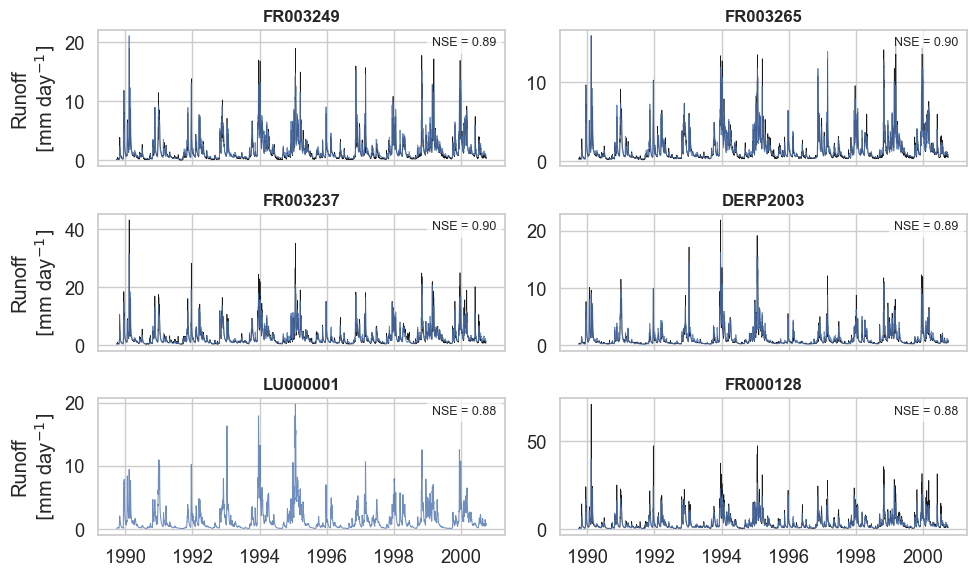

In [77]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["FR003249", "FR003265", "FR003237", "DERP2003", "LU000001", "FR000128"]  # Your 6 gauge IDs
start_date = "1989-10-01"
end_date = "2000-09-30"

# Create subplots (2 columns × 3 rows)
fig, axes = plt.subplots(3, 2, figsize=(10, 6), sharex=True)
axes = axes.flatten()  # Flatten to easily loop

# Plot each hydrograph
for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]
    
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    # Plot observation and regional simulation
    ax.plot(ts.date, ts["observation"], label="Observation", linewidth=0.5, color="k")
    ax.plot(ts.date, ts["regional"], label="Regional", linewidth=0.75, alpha=0.8)
    
    ax.set_title(f"{gauge_id}", fontsize=12, fontweight="bold")
    #ax.set_ylim(0, 20)
    ax.grid(True)

    if i % 2 == 0:  # Left column
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # Get NSE value (rounded for display)
    nse = data_diff_val_complete.loc[gauge_id, "nse_r1comp"]
    nse_label = f"NSE = {nse:.2f}"
    
    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.98, 0.95, nse_label,
        transform=ax.transAxes,
        ha='right', va='top',
        fontsize=9,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    #if i == 5:
    #    ax.set_xticklabels(["1990", "1992", "1994", "1996", "1998", "2000"])



#axes[0].set_ylim(0, 10)
#axes[1].set_ylim(0, 10)


main_titles = [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

# Use last subplot for legend
#legend_ax = axes[-1]
#legend_ax.axis("off")

# Custom legend
handles, labels = axes[0].get_legend_handles_labels()
labels = ["Observation", r"Mean simulation"]

legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=3
)


fig.align_ylabels(axes)

plt.tight_layout(rect=[0, 0, 1, 1])  # Leave space for legend


# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/hydrographs_goodNSE.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

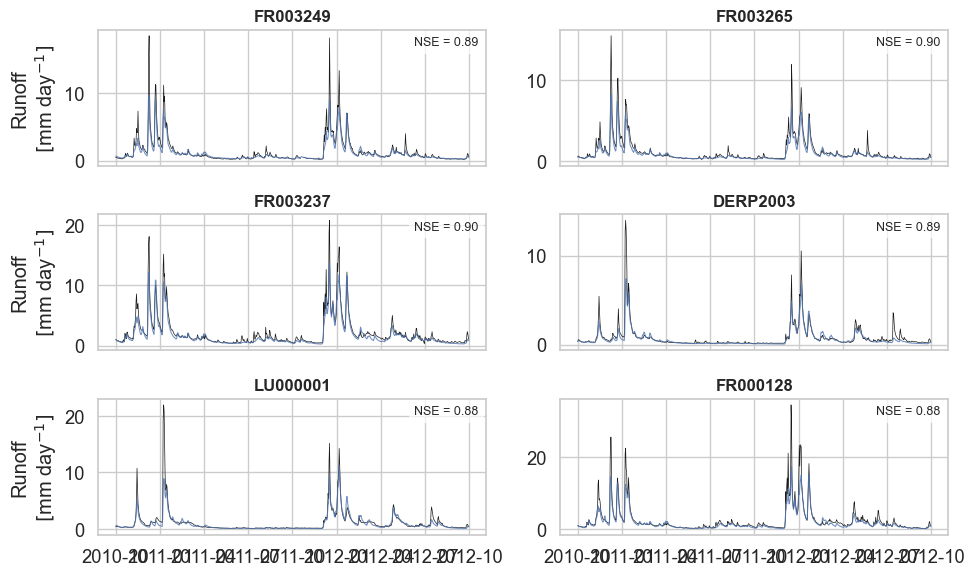

In [386]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["FR003249", "FR003265", "FR003237", "DERP2003", "LU000001", "FR000128"]  # Your 6 gauge IDs
start_date = "2010-10-01"
end_date = "2012-09-30"

# Create subplots (2 columns × 3 rows)
fig, axes = plt.subplots(3, 2, figsize=(10, 6), sharex=True)
axes = axes.flatten()  # Flatten to easily loop

# Plot each hydrograph
for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]
    
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    # Plot observation and regional simulation
    ax.plot(ts.date, ts["observation"], label="Observation", linewidth=0.5, color="k")
    ax.plot(ts.date, ts["regional"], label="Regional", linewidth=0.75, alpha=0.8)
    
    ax.set_title(f"{gauge_id}", fontsize=12, fontweight="bold")
    #ax.set_ylim(0, 20)
    ax.grid(True)

    if i % 2 == 0:  # Left column
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # Get NSE value (rounded for display)
    nse = data_diff_val_complete.loc[gauge_id, "nse_r1comp"]
    nse_label = f"NSE = {nse:.2f}"
    
    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.98, 0.95, nse_label,
        transform=ax.transAxes,
        ha='right', va='top',
        fontsize=9,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    #if i == 5:
    #    ax.set_xticklabels(["1990", "1992", "1994", "1996", "1998", "2000"])



#axes[0].set_ylim(0, 10)
#axes[1].set_ylim(0, 10)


main_titles = [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

# Use last subplot for legend
#legend_ax = axes[-1]
#legend_ax.axis("off")

# Custom legend
handles, labels = axes[0].get_legend_handles_labels()
labels = ["Observation", r"Mean simulation"]

legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=3
)


fig.align_ylabels(axes)

plt.tight_layout(rect=[0, 0, 1, 1])  # Leave space for legend


# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/hydrographs_goodNSE_1year.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

### Study area

In [54]:
catchment_boundaries_moselle = catchment_boundaries.loc[estreams_garonne_and_moselle_130_gauges_with_permeability_variants_and_lakes.index.tolist(), :]
catchment_boundaries_moselle.to_file("/Users/nascimth/Documents/data/gis/paper_moselle_superflexpy/catchment_boundaries_moselle_130_gauges.shp")

In [48]:
catchment_boundaries_moselle = catchment_boundaries.loc[network_estreams_gdf.index.tolist(), :]
world = gpd.read_file(r"/Users/nascimth/Documents/data/gis/world.shp")
lakes = gpd.read_file(r"file:///Users/nascimth/Documents/data/gis/paper_moselle_superflexpy/lakes_moselle.shp")

NameError: name 'network_estreams_gdf' is not defined

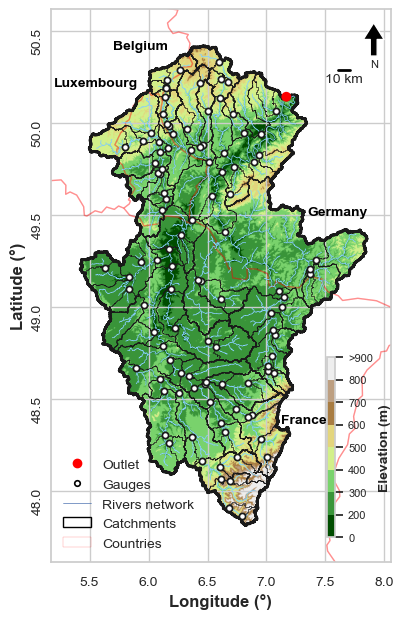

In [212]:
import matplotlib as mpl
from matplotlib.colors import BoundaryNorm
from matplotlib.colors import LinearSegmentedColormap

# Define custom terrain colormap without blue
terrain_no_blue_colors = [
    (0.0,  "#004d00"),  # dark green
    (0.25, "#66cc66"),  # light green
    (0.5,  "#ffff99"),  # yellow
    (0.75, "#996633"),  # brown
    (1.0,  "#eeeeee")   # light gray/white
]

terrain_no_blue = LinearSegmentedColormap.from_list("terrain_no_blue", terrain_no_blue_colors)



# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, ax = plt.subplots(figsize=(4, 6))


data_df = estreams_attributes_dfs["DEBU1959"]
# Load the world shapefile dataset provided by GeoPandas

# Set font properties using rcParams
mpl.rcParams['font.family'] = 'arial'  # Change the font family
mpl.rcParams['font.size'] = 12           # Change the font size
mpl.rcParams['font.weight'] = 'normal'   # Change font weight
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight


# Clear the subplot
ax.clear()

# Set the background color to white
ax.set_facecolor('white')

# Set plot limits to the bounding box of the selected study areas
bounds = moselle.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = moselle.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

world.plot(ax=ax, color='none', edgecolor='red', linewidth=1, alpha=0.25)

# Calculate the extent
left, bottom = transform * (0, 0)
right, top = transform * (elevation_wgs.shape[1], elevation_wgs.shape[0])
extent = (left, right, top, bottom)  # Notice the order for top and bottom

# Define the color classes (discrete intervals)
bounds = [0, 200, 300, 400, 500, 600, 700, 800, 900]  # Define class boundaries
cmap = plt.get_cmap(terrain_no_blue)  # Choose a colormap
norm = BoundaryNorm(bounds, cmap.N)  # Normalize based on the class boundaries

# Plot the elevation data with class intervals
cax = ax.imshow(elevation_wgs, cmap=cmap, norm=norm, extent=extent)

# Add colorbar with class labels
#cbar = fig.colorbar(cax, ticks=bounds)
#cbar.set_label('Elevation (m)')
# Create a small colorbar inside the plot
cbar_ax = fig.add_axes([0.8, 0.12, 0.02, 0.3])  # [left, bottom, width, height]
cbar = fig.colorbar(cax, cax=cbar_ax, orientation='vertical', ticks=bounds)

tick_labels = [str(b) for b in bounds[:-1]] + ['>900']
cbar.ax.set_yticklabels(tick_labels)

cbar.ax.tick_params(labelsize=8)  # Set the font size for the ticks
cbar.set_label('Elevation (m)', fontsize=10)  # Set the label with a smaller font size

# Adjust the colorbar size (shrink)
#cbar.ax.set_aspect('auto')

# Set the title and show the plot
#ax.set_title('C', loc = "left", fontsize=14, fontweight="bold")

# Plot the river
rivers_moselle.plot(ax=ax, linewidth=0.5, color="lightskyblue")

# Plot the mask to cover everything outside the study area
#mask.plot(ax=ax, facecolor='none', edgecolor='darkred', linewidth=0.8)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, label='Sub-catchments')

moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=2, label='Sub-catchments')
catchment_boundaries_moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.5, label='Sub-catchments')


## Plot the points from network_estreams_filtered
#network_estreams_gdf.plot(ax=ax, color='black', markersize=30, edgecolor='none', linewidth=0.5, 
#                          label='Streamflow gauges', zorder=1000)

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax, color='white', markersize=20, edgecolor='k', linewidth=1.25, 
                          label='Streamflow gauges', zorder=1000)

# Plot the points from network_estreams_filtered
network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax, color='red', markersize=50, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

# Set plot limits to the bounding box of the study area
ax.set_xlim(x_min-0.25, x_max+0.2)
ax.set_ylim(y_min-0.2, y_max+0.2)


ax.set_xlabel("Longitude (°)", fontsize=12)
ax.set_ylabel("Latitude (°)", fontsize=12)

# Create manual legend entries:
# For sub-catchments (as a polygon with a black boundary)
subcatchment_patch = Patch(facecolor='none', edgecolor='black', label='Catchments')
countries_patch = Patch(facecolor='none', edgecolor='red', lw=0.25, alpha = 0.5, label='Countries')

# For streamflow gauges (as black dots)
#streamflow_marker = Line2D([0], [0], color='black', lw=0, marker='o', markersize=4, label='Gauges')
streamflow_marker = Line2D(
    [0], [0],
    color='none',                # No line connecting markers
    marker='o',                  # Circle marker
    markersize=4,                # Size in points
    markerfacecolor='white',     # Fill color inside the circle
    markeredgecolor='black',     # Color of the circle's edge
    markeredgewidth=1.2,         # Width of the edge
    label='Gauges'
)

# For outlet gauges (as black dots)
outlet_marker = Line2D([0], [0], color='red', lw=0, marker='o', markersize=6, label='Outlet')

# For another line (representing rivers)
river_line = Line2D([0], [0], lw=0.5, label='Rivers network')

# Add the legend with all items
legend = ax.legend(handles=[outlet_marker, streamflow_marker, river_line, subcatchment_patch, countries_patch], 
                   loc='lower left', fontsize=10, title="", title_fontsize='8', frameon=False)

# Add a north arrow
x, y, arrow_length = 0.95, 0.975, 0.075
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length), arrowprops=dict(facecolor='black', width=5, headwidth=15), ha='center', va='center', fontsize=8, xycoords=ax.transAxes)

# Add a scale bar 
scalebar_length = 10  # in kilometers
x_scalebar = x_max - (x_max - x_min) * 0.1
y_scalebar = y_min + (y_max - y_min) * 0.95
ax.plot([x_scalebar, x_scalebar + scalebar_length/100], [y_scalebar, y_scalebar], color='black', linewidth=2)
ax.text(x_scalebar + (scalebar_length/200), y_scalebar - (y_max - y_min) * 0.02, f'{scalebar_length} km', ha='center', va='center', fontsize=10)

# Rotate the existing y-tick labels without changing them
ax.set_yticklabels(ax.get_yticklabels(), rotation=90, ha='center', fontsize=10)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)

# Adding some text
ax.text(5.7, 50.4, 'Belgium', fontsize=10, color='black', fontweight='bold')
ax.text(5.2, 50.2, 'Luxembourg', fontsize=10, color='black', fontweight='bold')
ax.text(7.35, 49.50, 'Germany', fontsize=10, color='black', fontweight='bold')
ax.text(7.12, 48.37, 'France', fontsize=10, color='black', fontweight='bold')

import matplotlib.ticker as ticker
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
#ax.set_aspect('equal')
ax.grid(True)
# Adjust the layout to remove extra space
plt.tight_layout(pad=0)

# Save including everything (colorbar + legend)
plt.savefig(
    r"/Users/nascimth/Library/CloudStorage/OneDrive-Eawag/Eawag/Papers/Moselle_superflexpy/GitHub/estreams_superflexpy/results/figs/study_area.png",
    dpi=300,
    bbox_inches='tight'
)
# Show the plot
plt.show()

### Parameters plots

In [ ]:
#Moselle parameters loading
import re
import os
import glob

def is_valid_key(k):
    # Exclude keys that end in Group_X_2
    
    return not re.search(r'Group_\d+_2$', k)

def is_valid_key_2(k):
    # Include only keys that end in Group_X_2
    return re.search(r'Group_\d+_2$', k)

# Dictionary to store all parameter dicts
all_param_dicts = {}

# Loop through all CSVs in the current directory
for filepath in glob.glob("../results/groups/*moselle*comp*.csv"):
    file_key = os.path.splitext(os.path.basename(filepath))[0]  # Strip .csv
    
    param_dict = {}

    # Read file and parse lines
    with open(filepath, 'r') as f:
        for line in f:
            line = line.strip()
            if not line or line.startswith(","):  # Skip empty or malformed lines
                continue
            parts = line.split(",")
            if len(parts) == 2:
                key, value = parts
                try:
                    param_dict[key] = float(value)
                except ValueError:
                    pass  # Skip lines where value is not a float
            else:
                pass  # Skip malformed lines

    # Store the parsed dictionary
    all_param_dicts[file_key] = param_dict


regional_keys_2 = [k for k in all_param_dicts if "regi" in k and is_valid_key_2(k)]
continental_keys_2 = [k for k in all_param_dicts if "cont" in k and is_valid_key_2(k)]
global_keys_2 = [k for k in all_param_dicts if "glob" in k and is_valid_key_2(k)]


regional_keys_1 = [k for k in all_param_dicts if "regi" in k and is_valid_key(k)]
continental_keys_1 = [k for k in all_param_dicts if "cont" in k and is_valid_key(k)]
global_keys_1 = [k for k in all_param_dicts if "glob" in k and is_valid_key(k)]


#################### Regional parameters
dfs=[]
for key in regional_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

regional_params_2 = pd.concat(dfs)

regional_params_2.high_snow_k = 1/regional_params_2.high_snow_k
regional_params_2.high_slow_k = 1/regional_params_2.high_slow_k
regional_params_2.high_fast_k = 1/regional_params_2.high_fast_k
regional_params_2.general_snow_k = 1/regional_params_2.general_snow_k
regional_params_2.general_slow_k = 1/regional_params_2.general_slow_k
regional_params_2.general_fast_k = 1/regional_params_2.general_fast_k
regional_params_2.low_snow_k = 1/regional_params_2.low_snow_k
regional_params_2.low_slow_k = 1/regional_params_2.low_slow_k
regional_params_2.low_fast_k = 1/regional_params_2.low_fast_k

dfs=[]
for key in regional_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

regional_params_1 = pd.concat(dfs)

regional_params_1.high_snow_k = 1/regional_params_1.high_snow_k
regional_params_1.high_slow_k = 1/regional_params_1.high_slow_k
regional_params_1.high_fast_k = 1/regional_params_1.high_fast_k
regional_params_1.general_snow_k = 1/regional_params_1.general_snow_k
regional_params_1.general_slow_k = 1/regional_params_1.general_slow_k
regional_params_1.general_fast_k = 1/regional_params_1.general_fast_k
regional_params_1.low_snow_k = 1/regional_params_1.low_snow_k
regional_params_1.low_slow_k = 1/regional_params_1.low_slow_k
regional_params_1.low_fast_k = 1/regional_params_1.low_fast_k

#################### Continental parameters
dfs=[]
for key in continental_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

continental_params_2 = pd.concat(dfs)
continental_params_2.high_snow_k = 1/continental_params_2.high_snow_k
continental_params_2.high_slow_k = 1/continental_params_2.high_slow_k
continental_params_2.high_fast_k = 1/continental_params_2.high_fast_k
continental_params_2.general_snow_k = 1/continental_params_2.general_snow_k
continental_params_2.general_slow_k = 1/continental_params_2.general_slow_k
continental_params_2.general_fast_k = 1/continental_params_2.general_fast_k
continental_params_2.low_snow_k = 1/continental_params_2.low_snow_k
continental_params_2.low_slow_k = 1/continental_params_2.low_slow_k
continental_params_2.low_fast_k = 1/continental_params_2.low_fast_k

dfs=[]
for key in continental_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

continental_params_1 = pd.concat(dfs)
continental_params_1.high_snow_k = 1/continental_params_1.high_snow_k
continental_params_1.high_slow_k = 1/continental_params_1.high_slow_k
continental_params_1.high_fast_k = 1/continental_params_1.high_fast_k
continental_params_1.general_snow_k = 1/continental_params_1.general_snow_k
continental_params_1.general_slow_k = 1/continental_params_1.general_slow_k
continental_params_1.general_fast_k = 1/continental_params_1.general_fast_k
continental_params_1.low_snow_k = 1/continental_params_1.low_snow_k
continental_params_1.low_slow_k = 1/continental_params_1.low_slow_k
continental_params_1.low_fast_k = 1/continental_params_1.low_fast_k

#################### Global parameters
dfs=[]
for key in global_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

global_params_2 = pd.concat(dfs)
global_params_2.high_snow_k = 1/global_params_2.high_snow_k
global_params_2.high_slow_k = 1/global_params_2.high_slow_k
global_params_2.high_fast_k = 1/global_params_2.high_fast_k
global_params_2.general_snow_k = 1/global_params_2.general_snow_k
global_params_2.general_slow_k = 1/global_params_2.general_slow_k
global_params_2.general_fast_k = 1/global_params_2.general_fast_k
global_params_2.low_snow_k = 1/global_params_2.low_snow_k
global_params_2.low_slow_k = 1/global_params_2.low_slow_k
global_params_2.low_fast_k = 1/global_params_2.low_fast_k

dfs=[]
for key in global_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

global_params_1 = pd.concat(dfs)
global_params_1.high_snow_k = 1/global_params_1.high_snow_k
global_params_1.high_slow_k = 1/global_params_1.high_slow_k
global_params_1.high_fast_k = 1/global_params_1.high_fast_k
global_params_1.general_snow_k = 1/global_params_1.general_snow_k
global_params_1.general_slow_k = 1/global_params_1.general_slow_k
global_params_1.general_fast_k = 1/global_params_1.general_fast_k
global_params_1.low_snow_k = 1/global_params_1.low_snow_k
global_params_1.low_slow_k = 1/global_params_1.low_slow_k
global_params_1.low_fast_k = 1/global_params_1.low_fast_k


##### Concatenate all parameters
global_params = pd.concat([global_params_2], ignore_index=True)
continental_params = pd.concat([continental_params_2], ignore_index=True)
regional_params = pd.concat([regional_params_2], ignore_index=True)

#### Figure with log axis

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/2801019289.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/2801019289.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/2801019289.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/2801019289.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

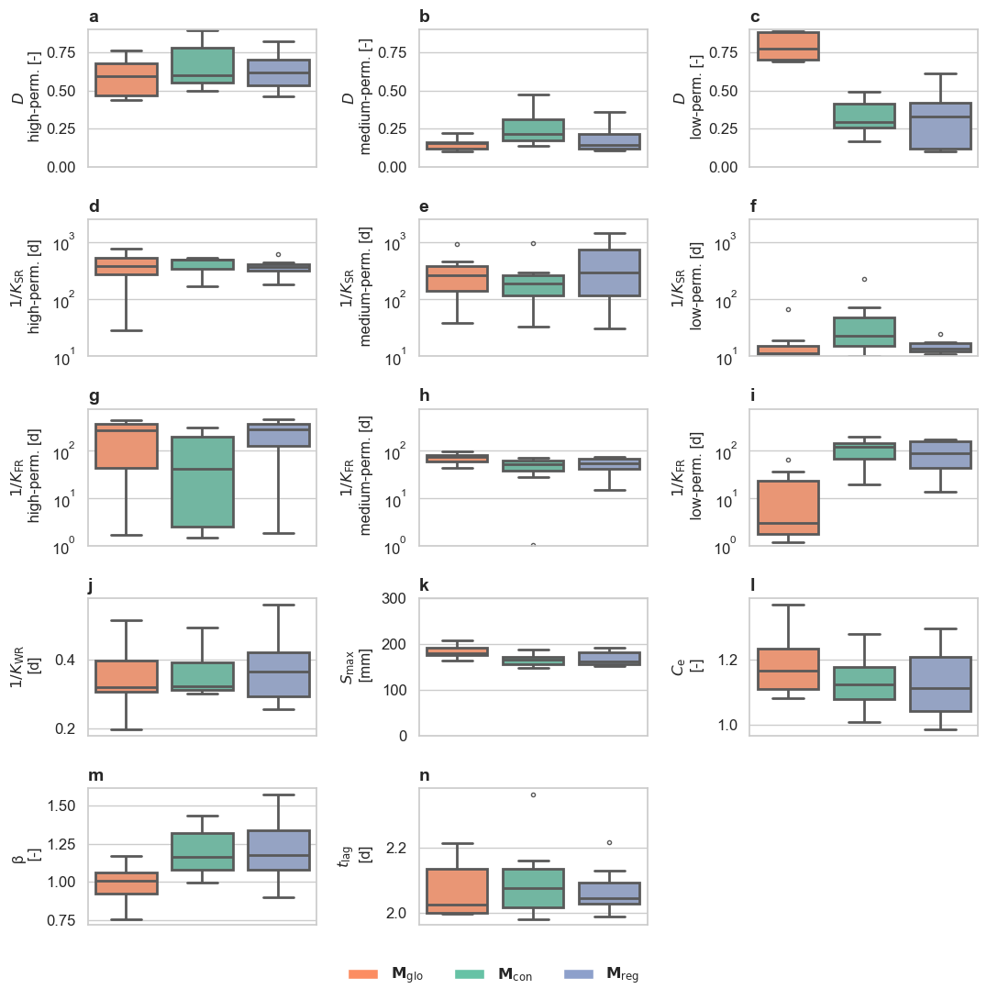

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Patch
import matplotlib as mpl
mpl.rcParams['text.usetex'] = False


subplot_titles = list("abcdefghijklmnopqrstu")  # Enough for 26 variables


# Seaborn styling
sns.set_theme(style="whitegrid", font_scale=1.2)

# Prepare long-format data
def prepare_long_df(df, name):
    df_long = df.copy()
    df_long['source'] = name
    return df_long

regional_long = prepare_long_df(regional_params, 'Regional')
continental_long = prepare_long_df(continental_params, 'Continental')
global_long = prepare_long_df(global_params, 'Global')

all_long = pd.concat([global_long, continental_long, regional_long], axis=0)
all_long = all_long.melt(id_vars='source', var_name='variable', value_name='value')

# Colors for groups
palette = {
    'Regional': '#8da0cb',     # blue
    'Continental': '#66c2a5',  # green
    'Global': '#fc8d62'        # orange
}

# Variables to plot
variables = [

    'high_lowersplitter_splitpar', 
    'general_lowersplitter_splitpar',
    'low_lowersplitter_splitpar',

    'high_slow_k',
    'general_slow_k',
    'low_slow_k',
    
    'high_fast_k', 
    'general_fast_k',
    'low_fast_k',

    'high_snow_k', 
    'high_unsaturated_Smax', 
    'high_unsaturated_Ce',
    'high_unsaturated_beta', 
    'high_lag-fun_lag-time',
    ]


# Pretty labels for y-axes
pretty_labels = {

    'general_lowersplitter_splitpar': r'$\mathit{D}$' + '\n medium-perm. [-]',
    'high_lowersplitter_splitpar': r'$\mathit{D}$' + '\n high-perm. [-]',#
    'low_lowersplitter_splitpar': r'$\mathit{D}$' + '\n low-perm. [-]',#
    'high_fast_k': r'$1/\mathit{K}_{\mathrm{FR}}$' + '\n high-perm. [d]',
    'high_slow_k': r'$1/\mathit{K}_{\mathrm{SR}}$' + '\n high-perm. [d]',#
    'general_slow_k': r'$1/\mathit{K}_{\mathrm{SR}}$' + '\n medium-perm. [d]',#
    'general_fast_k': r'$1/\mathit{K}_{\mathrm{FR}}$' + '\n medium-perm. [d]',#
    'low_slow_k': r'$1/\mathit{K}_{\mathrm{SR}}$' + '\n low-perm. [d]',#
    'low_fast_k': r'$1/\mathit{K}_{\mathrm{FR}}$' + '\n low-perm. [d]',#

    'high_snow_k': r'$1/\mathit{K}_{\mathrm{WR}}$' + '\n [d]',#
    'high_unsaturated_Smax': r'$\mathit{S}_{\mathrm{max}}$' + '\n [mm]',
    'high_unsaturated_Ce': r'$\mathit{C}_{\mathrm{e}}$' + '\n [-]',#
    'high_unsaturated_beta': 'β \n [-]',#
    'high_lag-fun_lag-time': r'$\mathit{t}_{\mathrm{lag}}$' + '\n [d]',#


}

# Layout
ncols = 3
nrows = int(np.ceil(len(variables) / ncols))
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(11, 11), sharey=False)
axes = axes.flatten()

# Plot
for i, var in enumerate(variables):
    ax = axes[i]
    sns.boxplot(
        data=all_long[all_long['variable'] == var],
        x='source', y='value',
        palette=palette,
        linewidth=2.0,
        fliersize=3,
        ax=ax
    )
    ax.set_title(subplot_titles[i], fontsize=14, weight='bold', loc="left")  # "A", "B", ...
    ax.set_xlabel('')
    ax.set_ylabel(pretty_labels.get(var, var), fontsize=12)
    ax.set_xticks([])  # remove x-axis group labels
    ax.tick_params(labelsize=12)

# Hide unused axes
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Custom legend
legend_elements = [
    Patch(facecolor=palette['Global'], label=r"$\mathbf{M_{\mathrm{glo}}}$"),
    Patch(facecolor=palette['Continental'], label=r"$\mathbf{M_{\mathrm{con}}}$"),
    Patch(facecolor=palette["Regional"], label=r"$\mathbf{M_{\mathrm{reg}}}$"),
]

axes[0].set_ylim(0, 0.9)  
axes[1].set_ylim(0, 0.9)  
axes[2].set_ylim(0, 0.9)  

axes[3].set_ylim(10, 2500)  
axes[4].set_ylim(10, 2500)  
axes[5].set_ylim(10, 2500)

axes[6].set_ylim(1, 750)  
axes[7].set_ylim(1, 750)  
axes[8].set_ylim(1, 750)  
axes[10].set_ylim(0, 300)  


axes[3].set_yscale('log')
axes[4].set_yscale('log')
axes[5].set_yscale('log')

axes[6].set_yscale('log')
axes[7].set_yscale('log')
axes[8].set_yscale('log')

fig.legend(
    handles=legend_elements,
    loc='lower center',
    ncol=3,
    fontsize=12,
    frameon=False
)

# Align all y-axis labels
for ax in axes:
    ax.yaxis.set_label_coords(-0.2, 0.5)  # adjust -0.15 as needed

#axes[8].set_ylim(-10, 200)
plt.tight_layout(rect=[0, 0.05, 1, 1]) 
plt.savefig("../results/figs/figures/figSXX_paramsMoselle.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

### Supporting information

#### Figure S1

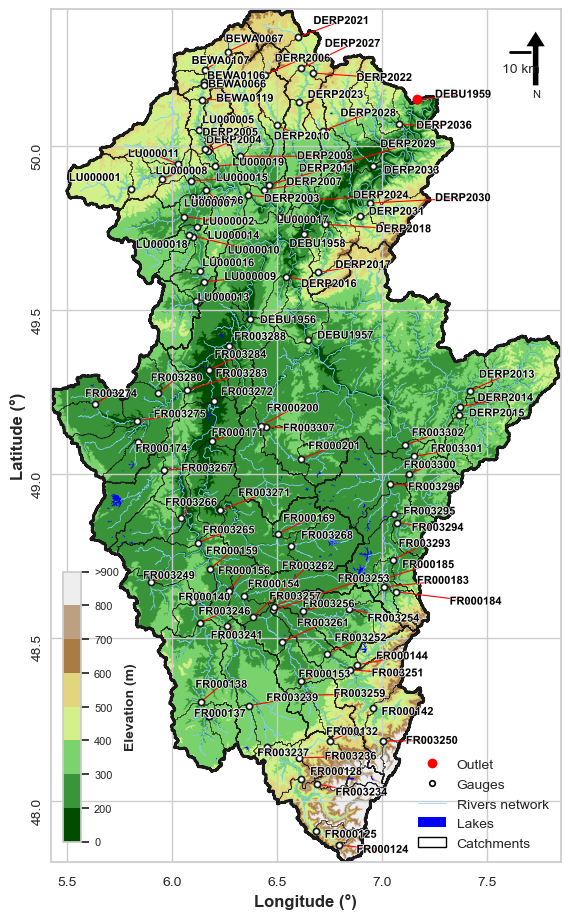

In [415]:
import matplotlib as mpl
from matplotlib.colors import BoundaryNorm
from matplotlib.colors import LinearSegmentedColormap
import adjustText
from adjustText import adjust_text
# Define custom terrain colormap without blue
terrain_no_blue_colors = [
    (0.0,  "#004d00"),  # dark green
    (0.25, "#66cc66"),  # light green
    (0.5,  "#ffff99"),  # yellow
    (0.75, "#996633"),  # brown
    (1.0,  "#eeeeee")   # light gray/white
]

terrain_no_blue = LinearSegmentedColormap.from_list("terrain_no_blue", terrain_no_blue_colors)



# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, ax = plt.subplots(figsize=(9, 9))


data_df = estreams_attributes_dfs["DEBU1959"]
# Load the world shapefile dataset provided by GeoPandas

# Set font properties using rcParams
mpl.rcParams['font.family'] = 'arial'  # Change the font family
mpl.rcParams['font.size'] = 12           # Change the font size
mpl.rcParams['font.weight'] = 'normal'   # Change font weight
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight


# Clear the subplot
ax.clear()

# Set the background color to white
ax.set_facecolor('white')

# Set plot limits to the bounding box of the selected study areas
bounds = moselle.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = moselle.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

#world.plot(ax=ax, color='none', edgecolor='red', linewidth=1, alpha=0.25)

# Calculate the extent
left, bottom = transform * (0, 0)
right, top = transform * (elevation_wgs.shape[1], elevation_wgs.shape[0])
extent = (left, right, top, bottom)  # Notice the order for top and bottom

# Define the color classes (discrete intervals)
bounds = [0, 200, 300, 400, 500, 600, 700, 800, 900]  # Define class boundaries
cmap = plt.get_cmap(terrain_no_blue)  # Choose a colormap
norm = BoundaryNorm(bounds, cmap.N)  # Normalize based on the class boundaries

# Plot the elevation data with class intervals
cax = ax.imshow(elevation_wgs, cmap=cmap, norm=norm, extent=extent)

# Add colorbar with class labels
#cbar = fig.colorbar(cax, ticks=bounds)
#cbar.set_label('Elevation (m)')
# Create a small colorbar inside the plot
cbar_ax = fig.add_axes([0.23, 0.075, 0.02, 0.3])  # [left, bottom, width, height]
cbar = fig.colorbar(cax, cax=cbar_ax, orientation='vertical', ticks=bounds)

tick_labels = [str(b) for b in bounds[:-1]] + ['>900']
cbar.ax.set_yticklabels(tick_labels)

cbar.ax.tick_params(labelsize=8)  # Set the font size for the ticks
cbar.set_label('Elevation (m)', fontsize=10)  # Set the label with a smaller font size

# Adjust the colorbar size (shrink)
#cbar.ax.set_aspect('auto')

# Set the title and show the plot
#ax.set_title('C', loc = "left", fontsize=14, fontweight="bold")

# Plot the river
rivers_moselle.plot(ax=ax, linewidth=0.5, color="lightskyblue")

# Plot the mask to cover everything outside the study area
#mask.plot(ax=ax, facecolor='none', edgecolor='darkred', linewidth=0.8)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, label='Sub-catchments')

moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=2, label='Sub-catchments')
catchment_boundaries_moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.5, label='Sub-catchments')
lakes.plot(ax=ax, facecolor='blue', edgecolor='none', linewidth=1, label='Lakes and reservoirs')

## Plot the points from network_estreams_filtered
#network_estreams_gdf.plot(ax=ax, color='black', markersize=30, edgecolor='none', linewidth=0.5, 
#                          label='Streamflow gauges', zorder=1000)

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax, color='white', markersize=20, edgecolor='k', linewidth=1.25, 
                          label='Streamflow gauges', zorder=1000)

# Plot the points from network_estreams_filtered
network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax, color='red', markersize=50, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

# Set plot limits to the bounding box of the study area
ax.set_xlim(x_min-0.25, x_max+0.2)
ax.set_ylim(y_min-0.2, y_max+0.2)


ax.set_xlabel("Longitude (°)", fontsize=12)
ax.set_ylabel("Latitude (°)", fontsize=12)

# Create manual legend entries:
# For sub-catchments (as a polygon with a black boundary)
subcatchment_patch = Patch(facecolor='none', edgecolor='black', label='Catchments')

#countries_patch = Patch(facecolor='none', edgecolor='red', lw=0.25, alpha = 0.5, label='Countries')

# For streamflow gauges (as black dots)
#streamflow_marker = Line2D([0], [0], color='black', lw=0, marker='o', markersize=4, label='Gauges')
streamflow_marker = Line2D(
    [0], [0],
    color='none',                # No line connecting markers
    marker='o',                  # Circle marker
    markersize=4,                # Size in points
    markerfacecolor='white',     # Fill color inside the circle
    markeredgecolor='black',     # Color of the circle's edge
    markeredgewidth=1.2,         # Width of the edge
    label='Gauges'
)

# For outlet gauges (as black dots)
outlet_marker = Line2D([0], [0], color='red', lw=0, marker='o', markersize=6, label='Outlet')

# For another line (representing rivers)
river_line = Line2D([0], [0], lw=0.5, label='Rivers network')

## Add the legend with all items
#legend = ax.legend(handles=[outlet_marker, streamflow_marker, river_line, subcatchment_patch, countries_patch], 
#                   loc='lower left', fontsize=10, title="", title_fontsize='8', frameon=False)

# Add a north arrow
x, y, arrow_length = 0.95, 0.975, 0.075
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length), arrowprops=dict(facecolor='black', width=5, headwidth=15), ha='center', va='center', fontsize=8, xycoords=ax.transAxes)

# Add a scale bar 
scalebar_length = 10  # in kilometers
x_scalebar = x_max - (x_max - x_min) * 0.1
y_scalebar = y_min + (y_max - y_min) * 0.95
ax.plot([x_scalebar, x_scalebar + scalebar_length/100], [y_scalebar, y_scalebar], color='black', linewidth=2)
ax.text(x_scalebar + (scalebar_length/200), y_scalebar - (y_max - y_min) * 0.02, f'{scalebar_length} km', ha='center', va='center', fontsize=10)

# Rotate the existing y-tick labels without changing them
ax.set_yticklabels(ax.get_yticklabels(), rotation=90, ha='center', fontsize=10)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)

# Add labels for selected basin_ids
label_df = network_estreams_gdf.index.tolist()

# Set plot limits to the bounding box of the study area
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

import matplotlib.patheffects as pe

texts = []
points_x, points_y = [], []  # store the reference points

for basin in label_df:
    x = network_estreams_gdf.loc[basin, 'lon']
    y = network_estreams_gdf.loc[basin, 'lat']
    t = ax.text(
        x, y, basin,
        fontsize=8, ha='left', va='bottom',
        color='black', zorder=20000, fontweight="bold"
    )
    # Add white outline
    t.set_path_effects([
        pe.withStroke(linewidth=1, foreground="white")
    ])
    texts.append(t)
    points_x.append(x)
    points_y.append(y)

# Adjust with leader lines
adjust_text(
    texts, 
    x=points_x, y=points_y,  # anchor texts to their points
    ax=ax,
    expand_text=(0.1, 0.1),
    arrowprops=dict(arrowstyle="-", color="red", lw=0.8, zorder=19999))

import matplotlib.ticker as ticker
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
#ax.set_aspect('equal')
ax.grid(True)


# Create manual legend entries:
# For sub-catchments (as a polygon with a black boundary)
subcatchment_patch = Patch(facecolor='none', edgecolor='black', linewidth=1, label='Catchments')
lakes_patch = Patch(facecolor='blue', edgecolor='none', linewidth=1, label='Lakes')


# For streamflow gauges (as black dots)
streamflow_marker = Line2D(
    [0], [0],
    color='none',                # No line connecting markers
    marker='o',                  # Circle marker
    markersize=4,                # Size in points
    markerfacecolor='white',     # Fill color inside the circle
    markeredgecolor='black',     # Color of the circle's edge
    markeredgewidth=1.2,         # Width of the edge
    label='Gauges'
)

# For outlet gauges (as black dots)
outlet_marker = Line2D([0], [0], color='red', lw=0, marker='o', markersize=6, label='Outlet')

# For another line (representing rivers)
river_line = Line2D([0], [0], lw=0.5, label='Rivers network', color='lightskyblue')

# Add the legend with all items
legend = ax.legend(handles=[outlet_marker, streamflow_marker, river_line, lakes_patch, subcatchment_patch], 
                   loc='lower right', fontsize=10, title="", title_fontsize='8', frameon=False)



# Adjust the layout to remove extra space
plt.tight_layout(pad=0)

# Save including everything (colorbar + legend)
plt.savefig(
    r"/Users/nascimth/Library/CloudStorage/OneDrive-Eawag/Eawag/Papers/Moselle_superflexpy/GitHub/estreams_superflexpy/results/figs/appendix_study)area.png",
    dpi=300,
    bbox_inches='tight'
)

# Show the plot
plt.show()

#### Correlations

In [86]:
estreams_attributes_clipped_filters["nse_r1comp"] = data_diff_val_complete["nse_r1comp"]
estreams_attributes_clipped_filters["nse_c1comp"] = data_diff_val_complete["nse_c1comp"]
estreams_attributes_clipped_filters["nse_g1comp"] = data_diff_val_complete["nse_g1comp"]
estreams_attributes_clipped_filters["nse_nogeo"] = data_diff_val_complete["nse_nogeo"]
estreams_attributes_clipped_filters["bfi_obs"] = data_diff_val_complete["bfi_obs"]

estreams_attributes_clipped_filters_plot = estreams_attributes_clipped_filters.copy()
estreams_attributes_clipped_filters_plot.drop("group", inplace=True, axis=1)
estreams_attributes_clipped_filters_plot_nodup = estreams_attributes_clipped_filters_plot[~estreams_attributes_clipped_filters_plot.index.duplicated(keep='first')]
estreams_attributes_clipped_filters_plot_nodup["lakes_area_frac"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_area"] / estreams_attributes_clipped_filters_plot_nodup["area_estreams"]
estreams_attributes_clipped_filters_plot_nodup["lakes_vol_frac"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_vol"] / estreams_attributes_clipped_filters_plot_nodup["area_estreams"]

corr_series = estreams_attributes_clipped_filters_plot.iloc[:, 30:].corr(method="pearson")["nse_r1comp"]
filtered_corr = corr_series[abs(corr_series) > 0.0]

filtered_corr[20:40]

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_65216/3934226551.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  estreams_attributes_clipped_filters_plot_nodup["lakes_area_frac"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_area"] / estreams_attributes_clipped_filters_plot_nodup["area_estreams"]
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_65216/3934226551.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  estreams_attributes_clipped_filters_plot_nodup["lakes_v

hp_time              0.165274
lp_freq             -0.133100
lp_dur              -0.058889
lp_time              0.017367
ele_mt_max           0.085766
ele_mt_mean         -0.062911
ele_mt_min          -0.213930
slp_dg_mean         -0.327416
flat_area_fra        0.106113
steep_area_fra      -0.391404
elon_ratio           0.106516
strm_dens            0.086838
lit_dom             -0.094143
bedrk_dep            0.242876
perm_verylow_glob   -0.074466
perm_low_glob        0.220460
perm_medium_glob     0.123555
perm_high_glob      -0.160111
lit_fra_su           0.215180
lit_fra_ss          -0.186315
Name: nse_r1comp, dtype: float64

In [87]:
corr_series = estreams_attributes_clipped_filters_plot.iloc[:, 30:].corr(method="pearson")["nse_g1comp"]
filtered_corr = corr_series[abs(corr_series) > 0.2]

filtered_corr

baseflow_index          -0.343992
hfd_mean                -0.545481
hfd_std                 -0.371417
q_5                     -0.296343
ele_mt_min              -0.266157
slp_dg_mean             -0.334079
flat_area_fra            0.207581
steep_area_fra          -0.350439
lit_dom                 -0.248861
bedrk_dep                0.290017
perm_low_glob            0.244927
perm_medium_glob         0.309231
perm_high_glob          -0.422997
lit_fra_su               0.251958
lit_fra_ss              -0.453646
lit_fra_sc               0.214089
lit_fra_mt               0.244927
lit_fra_va              -0.571087
perm_high_cont          -0.325242
lit_fra_Gravels          0.266144
lit_fra_Sandstones      -0.371259
root_dep_mean            0.329026
root_dep_max             0.246618
soil_tawc_mean           0.221433
soil_fra_sand_mean      -0.320538
soil_fra_silt_mean       0.242124
soil_fra_clay_mean       0.290644
soil_fra_grav_mean       0.358654
soil_bd_mean            -0.357769
lai_mean      

In [88]:
data_diff_val_complete.min() 

nse_nogeo       -0.506631
nse_g1comp       0.165087
nse_c1comp       0.095085
nse_r1comp       0.181581
bfi_obs          0.420919
bfi_r1comp       0.498500
bfi_c1comp       0.523026
bfi_g1comp       0.508287
bfi_nogeo        0.588289
hfd_obs         97.277778
hfd_r1comp      97.388889
hfd_c1comp      98.777778
hfd_g1comp      96.166667
hfd_nogeo       93.722222
slope_obs        0.958338
slope_r1comp     1.232520
slope_c1comp     1.142526
slope_g1comp     1.279501
slope_nogeo      1.798806
qmean_obs        0.518305
qmean_r1comp     0.578160
qmean_c1comp     0.581992
qmean_g1comp     0.586953
qmean_nogeo      0.578906
dtype: float64

In [89]:

corr_series = estreams_attributes_clipped_filters_plot_nodup.iloc[:, 30:].corr(method="pearson")["lakes_vol_frac"]
filtered_corr = corr_series[abs(corr_series) > 0.0]
filtered_corr[-10:]

perm_high_glob2      0.146316
perm_medium_glob2   -0.131991
perm_low_glob2      -0.007677
nse_r1comp          -0.298286
nse_c1comp          -0.359153
nse_g1comp          -0.339669
nse_nogeo           -0.375259
bfi_obs              0.153948
lakes_area_frac      0.727570
lakes_vol_frac       1.000000
Name: lakes_vol_frac, dtype: float64

In [90]:
estreams_attributes_clipped_filters_plot_nodup.columns[40:]

Index(['hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep', 'perm_verylow_glob',
       'perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 'lit_fra_su',
       'lit_fra_ss', 'lit_fra_sm', 'lit_fra_sc', 'lit_fra_mt', 'lit_fra_pi',
       'lit_fra_py', 'lit_fra_vi', 'lit_fra_ev', 'lit_fra_ig', 'lit_fra_pa',
       'lit_fra_pb', 'lit_fra_va', 'lit_fra_vb', 'perm_high_cont',
       'perm_medium_cont', 'perm_low_cont', 'perm_verylow_cont',
       'lit_fra_Conglomerates', 'lit_fra_Conglomerates and sands',
       'lit_fra_Gravels', 'lit_fra_Sands', 'lit_fra_Sandstones',
       'lit_fra_Sandstones and sands', 'root_dep_mean', 'root_dep_max',
       'root_dep_min', 'soil_tawc_mean', 'soil_fra_sand_mean'

In [101]:
corr_series = estreams_attributes_clipped_filters_plot_nodup.iloc[:, 30:].corr(method="spearman")["hfd_mean"]
corr_series.iloc[-20
                 :]

lakes_num              0.073267
lakes_tot_area         0.066557
lakes_tot_vol          0.056840
sno_cov_mean          -0.046515
irri_1990             -0.150949
irri_2005             -0.184487
stations_num_p_mean   -0.151855
perm_high_regi         0.643059
perm_medium_regi      -0.000728
perm_low_regi         -0.308139
perm_high_glob2        0.221761
perm_medium_glob2     -0.211071
perm_low_glob2         0.323503
nse_r1comp            -0.317834
nse_c1comp            -0.327547
nse_g1comp            -0.082907
nse_nogeo             -0.110163
bfi_obs                0.828624
lakes_area_frac        0.036171
lakes_vol_frac         0.040239
Name: hfd_mean, dtype: float64

In [107]:
estreams_attributes_clipped_filters_plot_nodup["area"] = estreams_attributes_clipped_filters_plot_nodup["area_estreams"]
corr_series = estreams_attributes_clipped_filters_plot_nodup.iloc[:, 30:].corr(method="spearman")["nse_r1comp"]
corr_series.iloc[-10:
                 :]

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_65216/1697488289.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  estreams_attributes_clipped_filters_plot_nodup["area"] = estreams_attributes_clipped_filters_plot_nodup["area_estreams"]


perm_medium_glob2   -0.194363
perm_low_glob2       0.241368
nse_r1comp           1.000000
nse_c1comp           0.969495
nse_g1comp           0.746873
nse_nogeo            0.890108
bfi_obs             -0.146684
lakes_area_frac      0.129895
lakes_vol_frac       0.193008
area                 0.544676
Name: nse_r1comp, dtype: float64

In [329]:
estreams_attributes_clipped_filters_plot_nodup["lakes_area_frac"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_area"] / estreams_attributes_clipped_filters_plot_nodup["area_estreams"]
estreams_attributes_clipped_filters_plot_nodup["lakes_vol_frac"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_vol"] / estreams_attributes_clipped_filters_plot_nodup["area_estreams"]

estreams_attributes_clipped_filters_plot_nodup["lakes_mean_depth"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_vol"] / estreams_attributes_clipped_filters_plot_nodup["lakes_tot_area"]



In [330]:
estreams_attributes_clipped_filters_plot_nodup

,Unnamed: 0,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,...,perm_low_glob2,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo,bfi_obs,lakes_area_frac,marker_size,lakes_vol_frac,lakes_mean_depth
basin_id,,,,,,,,,,,,,,,,,,,,,
LU000018,0,5,Schoenfels,LU,LU_CONTACTFORM,Mamer,6.100795,49.723112,6.100795,49.723112,...,0.0,0.661654,0.515473,0.656544,0.623167,0.552706,0.000000,10,0.000000,NaN
LU000010,1,6,Hunnebuer,LU,LU_CONTACTFORM,Eisch,6.079524,49.729184,6.079524,49.729184,...,0.0,0.781961,0.689694,0.694558,0.736587,0.622472,0.000000,50,0.000000,NaN
LU000001,2,17,Bigonville,LU,LU_CONTACTFORM,Sure,5.801399,49.869821,5.801399,49.869821,...,0.0,0.875687,0.877058,0.631810,0.822228,0.549832,0.000000,100,0.000000,NaN
DERP2028,3,2674030900,Eisenschmitt,DE,DE_RP,Salm,6.718000,50.048000,6.718000,50.048000,...,1.0,0.706292,0.629006,0.748662,0.824758,0.592346,0.000000,10,0.000000,NaN
FR000183,4,A900105050,A9001050,FR,FR_EAUFRANCE,La Sarre à Laneuveville-lès-Lorquin,7.008689,48.654579,7.008689,48.654579,...,6.0,0.488465,0.468789,0.468859,0.381274,0.740801,0.000000,10,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DERP2007,106,2628050400,Pruemzurlay,DE,DE_RP,Pruem,6.437000,49.868000,6.437000,49.868000,...,0.0,0.834975,0.819834,0.855475,0.798634,0.501588,0.000451,100,0.003455,7.653846
FR003271,107,A782101001,La Seille Ã Nomeny,FR,FR_EAUFRANCE,La Seille à Nomeny,6.227788,48.888271,6.227788,48.888271,...,0.0,0.751781,0.771728,0.753425,0.770787,0.545286,0.008363,100,0.040702,4.867097
FR003301,108,A930108040,La Sarre Ã Wittring,FR,FR_EAUFRANCE,La Sarre à Wittring,7.150066,49.053225,7.150066,49.053225,...,0.0,0.861112,0.850951,0.859052,0.838624,0.545102,0.010854,200,0.056401,5.196457


In [331]:
estreams_attributes_clipped_filters_plot_nodup[estreams_attributes_clipped_filters_plot_nodup.hfd_mean>150][["hfd_mean", "lakes_tot_area","lakes_num", "area_estreams", "lakes_area_frac", "lulc_2006_agriculture", "lakes_tot_vol", "lakes_vol_frac", "lakes_mean_depth", "nse_r1comp"]]

,hfd_mean,lakes_tot_area,lakes_num,area_estreams,lakes_area_frac,lulc_2006_agriculture,lakes_tot_vol,lakes_vol_frac,lakes_mean_depth,nse_r1comp
basin_id,,,,,,,,,,
FR000183,152.760,0.00,0.0,70.750,0.000000,0.151,0.00,0.000000,NaN,0.488465
FR000144,172.085,2.86,2.0,117.784,0.024282,0.032,57.45,0.487757,20.087413,0.235977
FR000184,160.347,0.00,0.0,89.950,0.000000,0.042,0.00,0.000000,NaN,0.636002
DERP2013,166.582,0.10,1.0,530.000,0.000189,0.311,0.62,0.001170,6.200000,0.443957
FR003250,156.082,0.00,0.0,67.143,0.000000,0.164,0.00,0.000000,NaN,0.181581
DERP2014,151.561,0.28,1.0,430.000,0.000651,0.482,1.42,0.003302,5.071429,0.803130


In [327]:
0.4877/10**6

4.877e-07

In [332]:
estreams_attributes_clipped_filters_plot_nodup.lakes_mean_depth.describe()

count    61.000000
mean      8.097114
std       8.398328
min       1.500000
25%       3.261905
50%       5.196457
75%       7.653846
max      37.575758
Name: lakes_mean_depth, dtype: float64

In [319]:
estreams_attributes_clipped_filters_plot_nodup.lakes_tot_vol.describe()

count    108.000000
mean      27.434259
std       64.801459
min        0.000000
25%        0.000000
50%        0.725000
75%       34.697500
max      396.310000
Name: lakes_tot_vol, dtype: float64

In [317]:
estreams_attributes_clipped_filters_plot_nodup.lakes_vol_frac.describe()

count    108.000000
mean       0.018140
std        0.052393
min        0.000000
25%        0.000000
50%        0.001934
75%        0.016164
max        0.487757
Name: lakes_vol_frac, dtype: float64

In [103]:
estreams_attributes_clipped_filters_plot_nodup[estreams_attributes_clipped_filters_plot_nodup.nse_r1comp<0.5][["hfd_mean", "lakes_tot_area","lakes_num", "area_estreams", "lakes_area_frac", "lulc_2006_agriculture", "lakes_tot_vol", "lakes_vol_frac", "nse_r1comp"]]

,hfd_mean,lakes_tot_area,lakes_num,area_estreams,lakes_area_frac,lulc_2006_agriculture,lakes_tot_vol,lakes_vol_frac,nse_r1comp
basin_id,,,,,,,,,
FR000183,152.760,0.00,0.0,70.750,0.000000,0.151,0.00,0.000000,0.488465
FR000185,145.097,0.00,0.0,188.492,0.000000,0.156,0.00,0.000000,0.263676
FR000144,172.085,2.86,2.0,117.784,0.024282,0.032,57.45,0.487757,0.235977
FR003280,148.667,0.00,0.0,74.738,0.000000,0.749,0.00,0.000000,0.402323
DERP2013,166.582,0.10,1.0,530.000,0.000189,0.311,0.62,0.001170,0.443957
FR003259,136.647,0.00,0.0,64.746,0.000000,0.414,0.00,0.000000,0.272996
FR003250,156.082,0.00,0.0,67.143,0.000000,0.164,0.00,0.000000,0.181581


<Axes: >

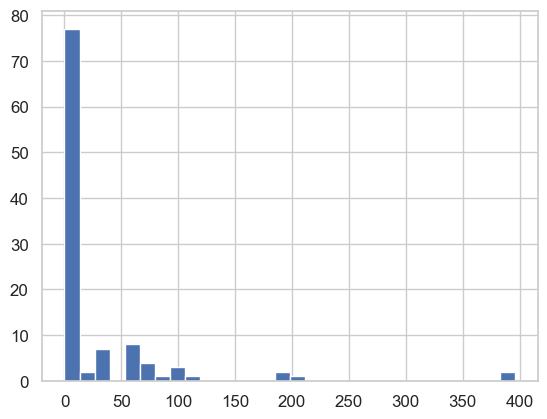

In [320]:
estreams_attributes_clipped_filters_plot_nodup.lakes_tot_vol.hist(bins=30)

<Axes: >

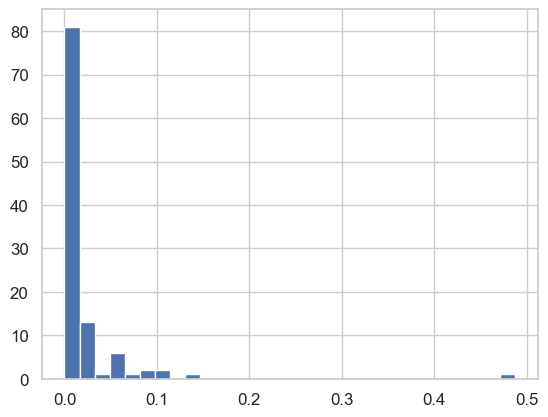

In [311]:
estreams_attributes_clipped_filters_plot_nodup.lakes_vol_frac.hist(bins=30)

<Axes: >

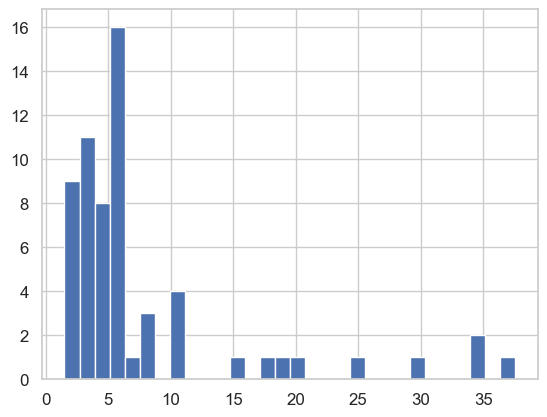

In [333]:
estreams_attributes_clipped_filters_plot_nodup.lakes_mean_depth.hist(bins=30)

#### Figure S3

In [383]:
estreams_attributes_clipped_filters_plot_nodup["lakes_vol_frac_in_mm"] = estreams_attributes_clipped_filters_plot_nodup["lakes_vol_frac"] * 1000

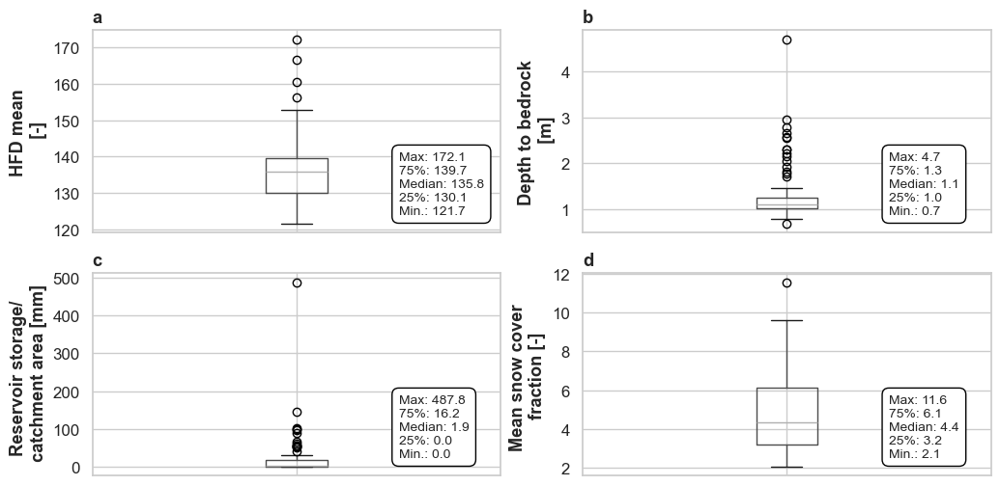

In [398]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(12, 6))
axes = axes.flatten()  # convert 2x2 array into 1D list of axes

panels = [
    ("hfd_mean", "HFD mean\n [-]", "a"),
    ("bedrk_dep", "Depth to bedrock\n [m]", "b"),
    ("lakes_vol_frac_in_mm", "Reservoir storage/ \n catchment area [mm]", "c"),
    ("sno_cov_mean", "Mean snow cover \nfraction [-]", "d")
]

# Loop through the panels
for i, (x_col, xlabel, label) in enumerate(panels):
    ax = axes[i]



    # draw the boxplot
    estreams_attributes_clipped_filters_plot_nodup.boxplot(column=x_col, ax=ax)
    ax.set_ylabel(xlabel)
    ax.set_xticklabels([])

    ax.set_title(label, loc="left", fontweight="bold")

    # compute stats
    vals = estreams_attributes_clipped_filters_plot_nodup[x_col].dropna()
    q25 = vals.quantile(0.25)
    median = vals.median()
    q75 = vals.quantile(0.75)
    vmax = vals.max()
    vmin = vals.min()

    # prepare text
    stats_text = (
        f"Max: {vmax:.1f}\n"
        f"75%: {q75:.1f}\n"
        f"Median: {median:.1f}\n"
        f"25%: {q25:.1f}\n"
        f"Min.: {vmin:.1f}"
    )

    # add a single text box at 90% x, 90% y (axes coords)
    ax.text(
        0.75, 0.4, stats_text,
        transform=ax.transAxes,        # <-- use axes fraction coordinates
        fontsize=10,
        verticalalignment="top",
        horizontalalignment="left",
        bbox=dict(facecolor="white", edgecolor="black", boxstyle="round,pad=0.5")
    )

# Save figure
plt.savefig(
    "../results/figs/boxplot_figures3.png",
    dpi=300,
    bbox_inches='tight'

    
)
plt.show()


In [399]:
estreams_attributes_clipped_filters_plot_nodup.root_dep_mean.describe()

count    108.000000
mean     104.802389
std       17.581981
min       67.233000
25%       92.945500
50%      110.495000
75%      117.545500
max      130.000000
Name: root_dep_mean, dtype: float64

In [400]:
estreams_attributes_clipped_filters_plot_nodup.bedrk_dep.describe()

count    108.000000
mean       1.283593
std        0.548733
min        0.691000
25%        1.030000
50%        1.112500
75%        1.252000
max        4.694000
Name: bedrk_dep, dtype: float64

#### Figure S4

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_83009/1076636666.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  estreams_attributes_clipped_filters_plot_nodup["marker_size"] = estreams_attributes_clipped_filters_plot_nodup["area_estreams"].apply(get_marker_size)


nse_g1comp
nse_r1comp
nse_g1comp
nse_r1comp


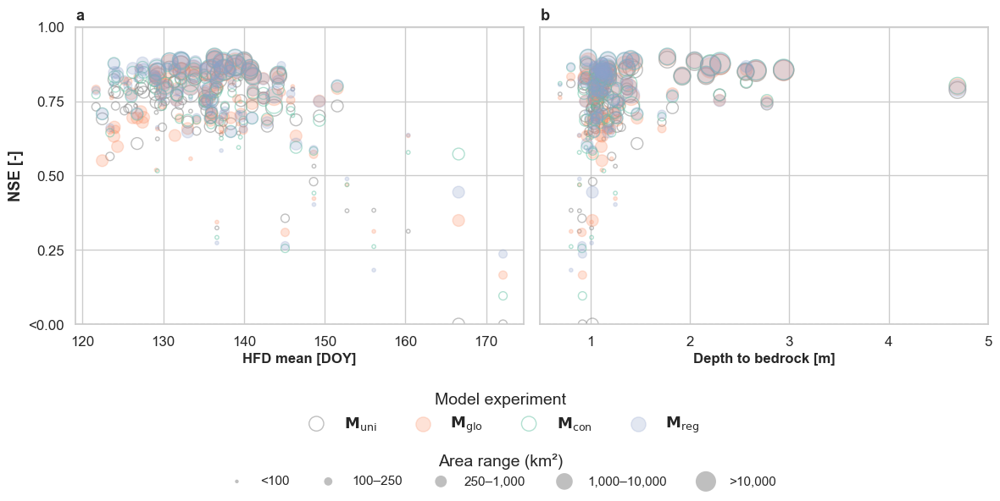

In [128]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mticker

# Set Seaborn style
sns.set(style="whitegrid", font_scale=1.1)

# Create 1x2 subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

# Define the two variables to plot
panels = [
    ("hfd_mean", "HFD mean [DOY]", "a"),
    ("bedrk_dep", "Depth to bedrock [m]", "b"),
]

# Define NSE columns and colors
nse_columns = {
    "nse_nogeo": "gray",
    "nse_g1comp": "#fc8d62",
    "nse_c1comp": "#66c2a5",
    "nse_r1comp": "#8da0cb",
}

# Function to determine marker size
def get_marker_size(area):
    if area < 100:
        return 10
    elif 100 <= area < 250:
        return 50
    elif 250 <= area < 1000:
        return 100
    elif 1000 <= area < 10000:
        return 200
    else:
        return 300

# Pre-compute marker sizes based on catchment area
estreams_attributes_clipped_filters_plot_nodup["marker_size"] = estreams_attributes_clipped_filters_plot_nodup["area_estreams"].apply(get_marker_size)

# Loop through the panels
for i, (x_col, xlabel, label) in enumerate(panels):
    ax = axes[i]

    for nse_col, color in nse_columns.items():


        if nse_col == "nse_nogeo":
            x = estreams_attributes_clipped_filters_plot_nodup[x_col]
            y = estreams_attributes_clipped_filters_plot_nodup[nse_col].clip(lower=0, upper=1)
            sizes = estreams_attributes_clipped_filters_plot_nodup["marker_size"]
            ax.scatter(x, y, color="none", label=nse_col if i == 0 else "", alpha=0.5, s=sizes, edgecolors=color)
        elif nse_col == "nse_c1comp":
            x = estreams_attributes_clipped_filters_plot_nodup[x_col]
            y = estreams_attributes_clipped_filters_plot_nodup[nse_col].clip(lower=0, upper=1)
            sizes = estreams_attributes_clipped_filters_plot_nodup["marker_size"]
            ax.scatter(x, y, color="none", label=nse_col if i == 0 else "", alpha=0.5, s=sizes, edgecolors=color)
        else:
            print(nse_col)
            x = estreams_attributes_clipped_filters_plot_nodup[x_col]
            y = estreams_attributes_clipped_filters_plot_nodup[nse_col].clip(lower=0, upper=1)
            sizes = estreams_attributes_clipped_filters_plot_nodup["marker_size"]
            ax.scatter(x, y, color=color, label=nse_col if i == 0 else "", alpha=0.25, s=sizes)


    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel("NSE [-]" if i == 0 else "")
    ax.set_title(label, loc='left', fontsize=13, fontweight="bold")
    ax.axhline(0, linestyle='--', color='gray', linewidth=1)
    ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
    ax.set_yticklabels(["<0.00", "0.25", "0.50", "0.75", "1.00"])
    ax.set_ylim(0, 1)

# First legend: NSE model experiment
handles_model, _ = axes[0].get_legend_handles_labels()
fig.legend(
    handles_model,
    [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", r"$\mathbf{M_{\mathrm{reg}}}$"],
    title="Model experiment",
    loc='lower center',
    ncol=4,
    fontsize=13,
    title_fontsize=14,
    frameon=False,
    bbox_to_anchor=(0.5, 0.1)  # slightly below plot
)

# Second legend: Marker size (area)
size_handles = [
    plt.scatter([], [], s=10,  color="gray", alpha=0.5, label='<100', edgecolors='none'),
    plt.scatter([], [], s=50,   color="gray",alpha=0.5, label='100–250', edgecolors='none'),
    plt.scatter([], [], s=100,   color="gray",alpha=0.5, label='250–1,000', edgecolors='none'),
    plt.scatter([], [], s=200,   color="gray",alpha=0.5, label='1,000–10,000', edgecolors='none'),
    plt.scatter([], [], s=300,  color="gray",alpha=0.5, label='>10,000', edgecolors='none')
]

fig.legend(
    handles=size_handles,
    title='Area range (km²)',
    loc='lower center',
    ncol=5,
    bbox_to_anchor=(0.5, 0),  # lower than the model legend
    frameon=False,
    fontsize=11,
    title_fontsize=14
)
#axes[0].set_xscale("log")
#axes[1].set_xscale("log")

axes[0].xaxis.set_major_formatter(mticker.ScalarFormatter())
axes[0].xaxis.set_minor_formatter(mticker.ScalarFormatter())  # hide minor tick labels if cluttered



ticks = [1, 2, 3, 4, 5]
axes[1].set_xticks(ticks)
axes[1].set_xticklabels([str(t) for t in ticks])  # show as plain numbers

#axes[1].xaxis.set_major_formatter(mticker.ScalarFormatter())
#axes[1].xaxis.set_minor_formatter(mticker.ScalarFormatter())  # hide minor tick labels if cluttered




# Adjust layout to reserve enough space for both legends
plt.tight_layout(rect=[0, 0.23, 1, 1])  # leave more space at the bottom

# Save figure
plt.savefig(
    "../results/figs/correlations_hfd_bedrockarea_scaled.png",
    dpi=300,
    bbox_inches='tight'

    
)

plt.show()


#### Supporting Tables (CSVs)

In [339]:
estreams_attributes_clipped_filters_plot_nodup_appendix = estreams_attributes_clipped_filters_plot_nodup.copy()

estreams_attributes_clipped_filters_plot_nodup_appendix["perm_high_cont2"] = estreams_attributes_clipped_filters_plot_nodup_appendix["perm_high_cont"] 
estreams_attributes_clipped_filters_plot_nodup_appendix["perm_medium_cont2"] = estreams_attributes_clipped_filters_plot_nodup_appendix["perm_medium_cont"] + estreams_attributes_clipped_filters_plot_nodup_appendix["perm_low_cont"]
estreams_attributes_clipped_filters_plot_nodup_appendix["perm_low_cont2"] = estreams_attributes_clipped_filters_plot_nodup_appendix["perm_verylow_cont"] 

estreams_attributes_clipped_filters_plot_nodup_appendix = estreams_attributes_clipped_filters_plot_nodup_appendix[['gauge_id', 
                                                                                                                  'gauge_name',
                                                                                                                  'gauge_country',
       'gauge_provider', 'river', 'lon_snap', 'lat_snap', 'area_official', 'area_estreams', 'area_flag', 'area_rel',
       'start_date', 'end_date', 'num_years', 'gauges_upstream', 'q_mean', 'q_runoff_ratio',
       'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index',
       'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time', 'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max',
       'ele_mt_mean', 'ele_mt_min', 'slp_dg_mean', 'flat_area_fra',
       'steep_area_fra', 'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',
        'lit_fra_su','lit_fra_ss', 'lit_fra_sm', 'lit_fra_sc', 'lit_fra_mt', 'lit_fra_pi',
       'lit_fra_py', 'lit_fra_vi', 'lit_fra_ev', 'lit_fra_ig', 'lit_fra_pa',
       'lit_fra_pb', 'lit_fra_va', 'lit_fra_vb', 

       'perm_high_regi', 'perm_medium_regi', 'perm_low_regi', 
       'perm_high_cont2', 'perm_medium_cont2', 'perm_low_cont2', 
       'perm_high_glob2', 'perm_medium_glob2', 'perm_low_glob2',
       
       'root_dep_mean', 'root_dep_max',
       'root_dep_min', 'soil_tawc_mean', 'soil_fra_sand_mean',
       'soil_fra_silt_mean', 'soil_fra_clay_mean', 'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 
       
       'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'lakes_tot_area', 'lakes_tot_vol', 'sno_cov_mean', 'irri_1990',
       'irri_2005', 'stations_num_p_mean',  'nse_r1comp', 'nse_c1comp',
       'nse_g1comp', 'nse_nogeo']]

In [361]:
estreams_attributes_clipped_filters_plot_nodup_appendix.to_csv("../results/supporting_information/moselle_attributes.csv", index=True)

In [114]:
data_diff_val_complete_dict_plot[["lat", "lon"]] = estreams_attributes_clipped_filters_plot_nodup[["lat_snap", "lon_snap"]]
data_diff_cal_complete_dict_plot[["lat", "lon"]] = estreams_attributes_clipped_filters_plot_nodup[["lat_snap", "lon_snap"]]    
data_diff_calibration_complete[["lat", "lon"]] = estreams_attributes_clipped_filters_plot_nodup[["lat_snap", "lon_snap"]]    


data_diff_val_complete_dict_plot.to_csv("../results/supporting_information/space_time_eval_median_nse_signatures.csv", index=True)
data_diff_cal_complete_dict_plot.to_csv("../results/supporting_information/space_eval_median_nse_signatures.csv", index=True)
data_diff_calibration_complete.to_csv("../results/supporting_information/calibration_median_nse_signatures.csv", index=True)


In [362]:
estreams_attributes_clipped_filters_plot_nodup_appendix.iloc[:, 15:].corr(method='pearson').to_csv("../results/supporting_information/moselle_attributes_correlation_pearson.csv", index=True)
estreams_attributes_clipped_filters_plot_nodup_appendix.iloc[:, 15:].corr(method='spearman').to_csv("../results/supporting_information/moselle_attributes_correlation_spearman.csv", index=True)

# Extra figures (posters)

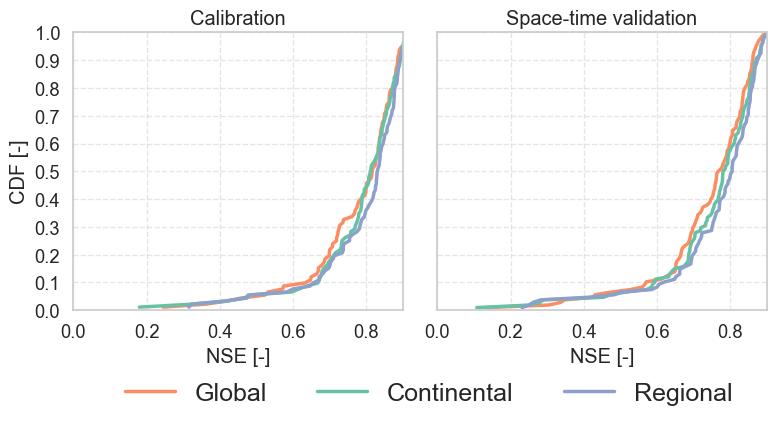

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.ticker as ticker

# Plotting function
def plot_cdf_mean(ax, data_input, title, label_letter):
    # Check if input is a dict or DataFrame
    if isinstance(data_input, dict):
        dfs = list(data_input.values())
        all_data = pd.concat(dfs, axis=0)
    elif isinstance(data_input, pd.DataFrame):
        all_data = data_input.copy()
    else:
        raise ValueError("data_input must be a dict of DataFrames or a single DataFrame.")
    
    data_combined = all_data.groupby(all_data.index).mean()

    for model_type in ['nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        if model_type not in data_combined.columns:
            continue
        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue
        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
        ax.plot(
            nse_values, cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

    ax.set_title(title)
    ax.set_xlim(-0.0, 0.9)
    ax.set_ylim(0, 1.0)
    ax.set_xlabel("NSE [-]")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))

    # Subplot label (a, b, c)
    ax.text(0, 1.075, label_letter, transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')


# Set styles
sns.set(style="whitegrid", font_scale=1.2)

# Color and label maps
colors = {
    'nse_g1comp': '#fc8d62',
    'nse_c1comp': '#66c2a5',
    'nse_r1comp': '#8da0cb',
}
labels_pretty = {
    'nse_g1comp': r"Global",
    'nse_c1comp': r"Continental",
    'nse_r1comp': r"Regional",
}

# --- FIGURE 1: CDF plots ---
fig, axs = plt.subplots(1, 2, figsize=(8, 4), sharey=True)

# Calibration and space validation use dictionaries
plot_cdf_mean(axs[0], data_diff_calibration_complete_dict_plot, "Calibration", "")
axs[0].set_ylabel("CDF [-]")

#plot_cdf_mean(axs[1], data_diff_cal_complete_dict_plot, "Space validation", "b")

# Space-time validation uses the DataFrame directly
plot_cdf_mean(axs[1], data_diff_val_complete_dict_plot, "Space-time validation", "")

# Legend shared
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels,
           #title="Model experiment",
           loc='lower center',
           bbox_to_anchor=(0.55, -0.1),
           ncol=4,
           fontsize=18,
           title_fontsize=14,
           frameon=False)

# Final layout
plt.tight_layout()
plt.savefig(
    "../results/figs/poster_cdfs.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()


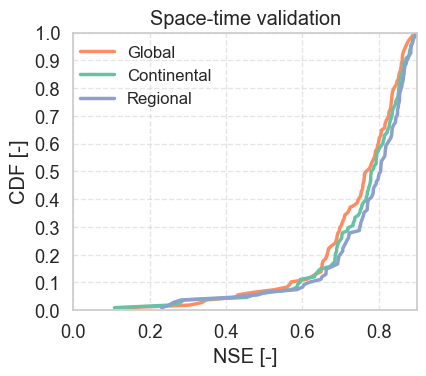

In [83]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.ticker as ticker

# Plotting function
def plot_cdf_mean(ax, data_input, title, label_letter):
    # Check if input is a dict or DataFrame
    if isinstance(data_input, dict):
        dfs = list(data_input.values())
        all_data = pd.concat(dfs, axis=0)
    elif isinstance(data_input, pd.DataFrame):
        all_data = data_input.copy()
    else:
        raise ValueError("data_input must be a dict of DataFrames or a single DataFrame.")
    
    data_combined = all_data.groupby(all_data.index).mean()

    for model_type in ['nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        if model_type not in data_combined.columns:
            continue
        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue
        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
        ax.plot(
            nse_values, cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

    ax.set_title(title)
    ax.set_xlim(-0.0, 0.9)
    ax.set_ylim(0, 1.0)
    ax.set_xlabel("NSE [-]")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))

    # Subplot label (a, b, c)
    ax.text(0, 1.075, label_letter, transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')


# Set styles
sns.set(style="whitegrid", font_scale=1.2)

# Color and label maps
colors = {
    'nse_g1comp': '#fc8d62',
    'nse_c1comp': '#66c2a5',
    'nse_r1comp': '#8da0cb',
}
labels_pretty = {
    'nse_g1comp': r"Global",
    'nse_c1comp': r"Continental",
    'nse_r1comp': r"Regional",
}

# --- FIGURE 1: CDF plots ---
fig, axs = plt.subplots(1, 1, figsize=(4.5, 4), sharey=True)

# Calibration and space validation use dictionaries
#plot_cdf_mean(axs, data_diff_calibration_complete_dict_plot, "Calibration", "")
axs.set_ylabel("CDF [-]")

#plot_cdf_mean(axs[1], data_diff_cal_complete_dict_plot, "Space validation", "b")

# Space-time validation uses the DataFrame directly
plot_cdf_mean(axs, data_diff_val_complete_dict_plot, "Space-time validation", "")

# Legend shared
handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels,
           #title="Model experiment",
           loc='center',
           bbox_to_anchor=(0.35, 0.78),
           ncol=1,
           fontsize=12,
           title_fontsize=14,
           frameon=False)

# Final layout
plt.tight_layout()
plt.savefig(
    "../results/figs/poster_cdfs.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()


/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_40569/4209680022.py:133: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


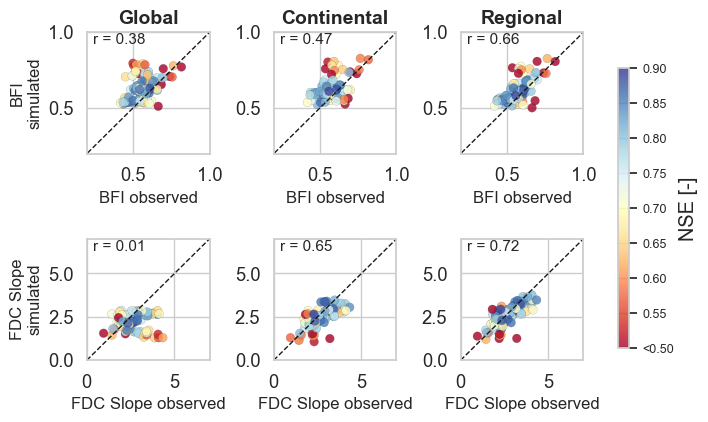

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope']
metric_titles = ['BFI', 'FDC Slope']

# Define suffixes and scales
suffixes = ['g1comp', 'c1comp', 'r1comp']
scale_titles = [r"Global", "Continental", "Regional"]

# Colormap and normalization
cmap = plt.cm.RdYlBu
vmin, vmax = 0.5, 0.9
norm = Normalize(vmin=vmin, vmax=vmax)

# Create subplots
fig, axs = plt.subplots(2, 3, figsize=(7, 4), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

# For shared colorbar, store one scatter artist
scatter_for_colorbar = None

# Loop through rows and columns
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]
        var_obs = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"
        var_nse = f"nse_{suffix}"

        # Color values clipped to [0.5, 0.9]
        colors = data_diff_val_complete[var_nse].clip(lower=vmin, upper=vmax)

        # Scatterplot
        sc = ax.scatter(
            data_diff_val_complete[var_obs],
            data_diff_val_complete[var_pred],
            c=colors,
            cmap=cmap,
            norm=norm,
            s=40,
            edgecolor='k',
            linewidth=0.1,
            alpha=0.8
        )

        # Store one artist for colorbar
        if scatter_for_colorbar is None:
            scatter_for_colorbar = sc


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12)
        else:
            ax.set_ylabel("")
        ax.set_xlabel(f"{row_title} observed", fontsize=12)

        # Correlation
        R = data_diff_val_complete[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        ax.text(
            0.05, 0.9, f"r = {R:.2f}", transform=ax.transAxes,
            fontsize=11, bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )

        # Subplot label
        subplot_idx = row * 4 + col
        #ax.text(
        #    -0.00, 1.14, f"{letters[subplot_idx]}", transform=ax.transAxes,
        #    fontsize=13, fontweight='bold', va='top', ha='left'
        #)

        # Set axis limits per metric
        if metric == 'bfi':
            ax.set_xlim(0.2, 1)
            ax.set_ylim(0.2, 1)
        elif metric == 'slope':
            ax.set_xlim(0, 7)
            ax.set_ylim(0, 7)
        elif metric == 'hfd':
            ax.set_xlim(110, 175)
            ax.set_ylim(110, 175)

axs[0, 0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 1].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 2].plot([0, 1], [0, 1], 'k--', lw=1)
#axs[0, 3].plot([0, 1], [0, 1], 'k--', lw=1)

axs[1, 0].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 1].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 2].plot([0, 7], [0, 7], 'k--', lw=1)
#axs[1, 3].plot([0, 7], [0, 7], 'k--', lw=1)

#axs[2, 0].plot([100, 180], [100, 180], 'k--', lw=1)
#axs[2, 1].plot([100, 180], [100, 180], 'k--', lw=1)
#axs[2, 2].plot([100, 180], [100, 180], 'k--', lw=1)
#axs[2, 3].plot([100, 180], [100, 180], 'k--', lw=1)


# Add single vertical colorbar to the right
fig.subplots_adjust(right=0.88)  # Make room for colorbar
cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(scatter_for_colorbar, cax=cbar_ax)
cbar.set_label("NSE [-]")
cbar.ax.tick_params(labelsize=9)



# Custom ticks and labels
ticks = np.linspace(0.5, 0.9, num=9)  # Adjust number of ticks if needed
tick_labels = [f"<0.50"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f"0.90"]
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)

## Column titles (below x-axis)
#col_positions = [0.25, 0.5, 0.79]
#for x, title in zip(col_positions, scale_titles):
#    fig.text(x, -0.1, title, ha='center', va='bottom', fontsize=14, fontweight='bold')
axs[0, 0].set_title("Global", fontsize=14, fontweight='bold')
axs[0, 1].set_title("Continental", fontsize=14, fontweight='bold')
axs[0, 2].set_title("Regional", fontsize=14, fontweight='bold')


# Final layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.12, right=0.85)

# Optional save
plt.savefig("../results/figs/poster_signatures_colorbar.png", dpi=300,  bbox_inches="tight")

plt.show()

In [84]:
gdf = gpd.read_file(r"/Users/nascimth/Documents/data/gis/world.shp")


In [92]:
moselle.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='Sub-catchments')


<Axes: xlabel='FDC Slope observed'>

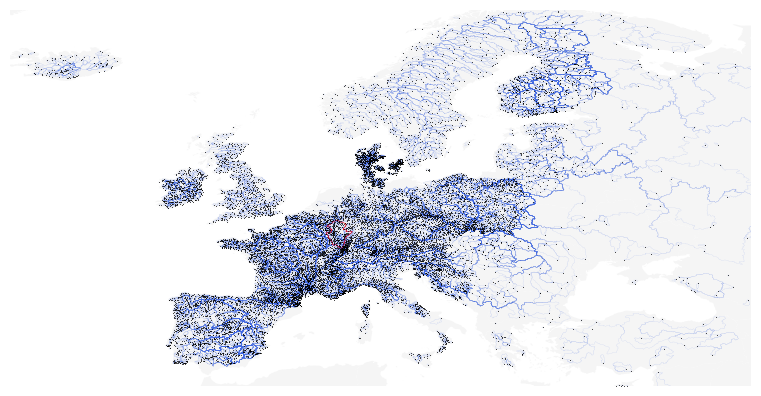

In [ ]:
# Set font properties using rcParams
mpl.rcParams['font.family'] = 'arial'  # Change the font family
mpl.rcParams['font.size'] = 8          # Change the font size
mpl.rcParams['font.weight'] = 'normal'  # Change font weight (e.g., 'bold', 'normal')
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight (e.g., 'bold', 'normal')

# Create a 2x1 subplot grid
fig, axs = plt.subplots(1, 1, figsize=(8, 4))

# Set the background color to white
axs.set_facecolor('white')
# Plot the shapefile with white facecolor and black boundaries
gdf.plot(ax=axs, facecolor='whitesmoke', edgecolor='None', linewidth=0.1)
axs.set_xlim(-24, 45) 
axs.set_ylim(35, 70)  

catchment_boundaries.plot(ax=axs, facecolor='None', edgecolor='royalblue', linewidth=0.05,  alpha=0.70)

moselle.plot(ax=axs, facecolor='none', edgecolor='red', linewidth=0.25, label='Sub-catchments')
axs.set_xlim(-24, 45) 
axs.set_ylim(35, 70)  

# Plot the gauges
axs.scatter(network_estreams['lon_snap'], network_estreams['lat_snap'], color='black', edgecolor='black',linewidth=0.5,
            marker='o', s=0.05, label = "Streamflow gauges")  # Adjust color, marker, and size as needed

axs.set_aspect('equal')  # Adjust aspect ratio as needed
axs.spines['top'].set_visible(False)
axs.spines['right'].set_visible(False)
axs.spines['bottom'].set_visible(False)
axs.spines['left'].set_visible(False)
axs.set_axis_off()  # Turn off both x-axis and y-axis

# Plot invisible scatter plot for legend
axs.plot([], [], color='royalblue', linewidth=0.8, label='Catchemnt boundaries')

#axs.legend(['Streamflow gauges', 'Catchment boundaries'], loc='lower left', frameon=False)


# Adjust layout and remove space between subplots
plt.tight_layout()

# Save or display the plot
#plt.show()
plt.savefig('../results/poster_figure_map.png', dpi=300)  # Replace 'figure.png' with your desired filename and forma

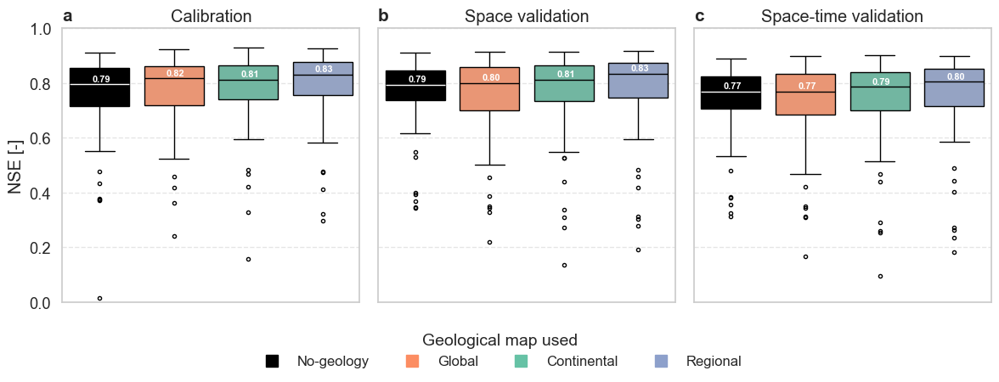

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.lines as mlines

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Model labels and colors
column_label_map = {
    'nse_nogeo': 'No-Geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional'
}
colors_box = {
    'No-Geology': 'black',
    'Global': '#fc8d62',
    'Continental': '#66c2a5',
    'Regional': '#8da0cb'
}

# Your input DataFrames for the three cases
dataframes = [
    data_diff_calibration_complete,
    data_diff_cal_complete,
    data_diff_val_complete
]
titles = ['Calibration', 'Space validation', 'Space-time validation']
subplot_labels = ['a', 'b', 'c']

# Create tidy DataFrames for seaborn
tidy_dataframes = []
for df, name in zip(dataframes, titles):
    df_tidy = pd.DataFrame({
        'NSE': pd.concat([df[col] for col in column_label_map]),
        'Model': sum([[column_label_map[col]] * len(df) for col in column_label_map], []),
        'Validation': name
    })
    tidy_dataframes.append(df_tidy)

df_all = pd.concat(tidy_dataframes, ignore_index=True)

# Plot
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharey=True)

for i, (ax, title, label) in enumerate(zip(axs, titles, subplot_labels)):
    df_sub = df_all[df_all["Validation"] == title]

    sns.boxplot(
        data=df_sub,
        x="Model",
        y="NSE",
        hue="Model",
        palette=colors_box,
        linewidth=1,
        fliersize=3,
        dodge=False,
        ax=ax
    )

    # Remove auto-generated legend
    if ax.get_legend():
        ax.get_legend().remove()

    # Annotate medians
    median_lines = ax.lines[4::6]
    for line in median_lines:
        y_data, x_data = line.get_xydata().mean(axis=0)
        ax.text(y_data - 0.1, x_data + 0.02, f"{x_data:.2f}", ha='left', va='center',
                fontweight='bold', fontsize=8, color='white')

        model_names = df_sub['Model'].unique()
        model_index = int(round(y_data))
        if model_index < len(model_names) and model_names[model_index] == 'No-Geology':
            line.set_color('white')

    ax.set_title(title)

    if i == 0:
        ax.set_ylabel("NSE [-]")
    else:
        ax.set_ylabel("")
        ax.tick_params(labelleft=False)  # Fully remove y-tick labels for right panels
    
    ax.set_xticks([])
    ax.set_xlabel("")
    ax.set_ylim(0, 1.0)
    ax.grid(True, linestyle='--', alpha=0.5)

    # Subplot label (a, b, c)
    ax.text(-0.0, 1.075, label, transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')

# Custom legend below
custom_handles = [
    mlines.Line2D([], [], color='black', marker='s', linestyle='None', markersize=10, label='No-geology'),
    mlines.Line2D([], [], color='#fc8d62', marker='s', linestyle='None', markersize=10, label='Global'),
    mlines.Line2D([], [], color='#66c2a5', marker='s', linestyle='None', markersize=10, label='Continental'),
    mlines.Line2D([], [], color='#8da0cb', marker='s', linestyle='None', markersize=10, label='Regional'),
]

fig.legend(
    handles=custom_handles,
    title="Geological map used",
    loc='lower center',
    bbox_to_anchor=(0.5, -0.15),
    ncol=4,
    fontsize=12,
    title_fontsize=14,
    frameon=False
)

plt.tight_layout()
plt.savefig("../results/figs/three_cdfs.png", dpi=300, bbox_inches='tight')
plt.show()

# End